<a href="https://colab.research.google.com/github/BrainConnection/Dynamical_Decoupling_Project/blob/main/5.%201Q%20DD%20(11).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Environment Setting



In [2]:
!pip install qutip
!pip install numpy
!pip install matplotlib
!pip install scipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 11.3 MB/s eta 0:00:00


In [3]:
from qutip import *
import numpy as np
import matplotlib.pyplot as plt
import scipy.interpolate
from scipy.optimize import curve_fit

# Goal of this paper

Goal : Investigate the effect of dynamical decoupling

Total evolution time : 500ns, 1000ns

Condition 1 : small photon number regime $ n = 0.005 $

Condition 2 : without Purcell Filter

Ramsey    CP (N=1)    CP (N=2)    CP (N=4)    XY4     CP (N=8)    XY8    CP (N=16)    XY16

If only Purcell Decay Decoherence exists,

Evolution time 500ns : 0.8546

Evolution time 1000ns : 0.7304

In [ ]:
sequence = ['Ramsey',
 'CP(N=2)',
 'CP(N=4)',
 'XY4',
 'CP(N=8)',
 'XY8',
 'CP(N=16)',
 'XY16']

In [ ]:
x = []

x.append([-3.279586863156681e-06,
 -0.006147126821793773,
 -0.00371991514725042,
 -0.013375896168849327,
 -0.006330879073066747,
 -0.03626167087448788,
 -0.004659901448955654,
 -0.00028683114216794677])

x.append([0.5717701828767193,
 0.5961668277714234,
 0.5989583648445842,
 0.600656398845272,
 0.5992157847775357,
 0.5863307092927911,
 0.5982000412623681,
 0.6086231472082744])

x.append([0.18419184590901022,
 -0.005132357763239799,
 -0.002088400273680034,
 -0.009767200673201032,
 -0.008176296770684174,
 -0.02449582203275339,
 -0.005372445350845202,
 -0.0019073921121162615])

x.append([-0.57187128975993,
 -0.6153362935990812,
 -0.6176444902819217,
 -0.6124246828893558,
 -0.6065092799030487,
 -0.6256165107258274,
 -0.6119010861298865,
 -0.6022286899983748])

x.append([-0.18420445431350657,
 -0.004841062356248755,
 -0.0039009947797595985,
 -0.007636169718256809,
 -0.005139428468733574,
 -0.02762162731451,
 -0.008770752985294675,
 0.0004815533659039476])

x.append([0.8084887225520323,
 0.8573141094985548,
 0.8479389020473972,
 0.8717779037644104,
 0.8568907544320788,
 0.8556694139837159,
 0.8621517493889108,
 0.8693166031025612])

x.append([0.7558111003966526,
 0.5982179301188536,
 0.6103508366374195,
 0.609859460606329,
 0.5968322070962813,
 0.6065876739307203,
 0.6078638525350322,
 0.5994585244656492])

x.append([0.26038176191883144,
 -0.003886823388510116,
 -0.005902390854784847,
 0.0016829407942034413,
 -0.005979459793198681,
 -6.218279695150248e-05,
 -0.0033708926080929817,
 -0.0019058793374698512])

x.append([-0.38757619769306145,
 -0.6090672750573335,
 -0.606336199450079,
 -0.6111253790793791,
 -0.6071401114763952,
 -0.6035465186772415,
 -0.6213019548588923,
 -0.608452746615518])

x.append([-0.8085006409047839,
 -0.8564597940767771,
 -0.87627594237545,
 -0.8488940380304101,
 -0.8719323785817874,
 -0.8684320403253889,
 -0.8862014508530823,
 -0.8567090333044705])

x.append([-0.7558270910484205,
 -0.6070722755225094,
 -0.6093173033956415,
 -0.601016651142986,
 -0.6073734629686037,
 -0.6061056766462541,
 -0.6250886622997631,
 -0.6116073264918084])

x.append([-0.26040795340105294,
 -0.004510851869356602,
 -0.0039044121646934866,
 0.008284687831935745,
 -0.0020261229217742216,
 -3.1415920979431523e-06,
 -0.010106324232312626,
 0.0003928254739470862])

x.append([0.3875540130277291,
 0.6032610433853887,
 0.6146743834620191,
 0.6209102057027738,
 0.6114785387412779,
 0.6062205846965896,
 0.6073552255680199,
 0.6176442701779389])

x.append([0.5718580642451684,
 0.602301130665335,
 0.604903334415462,
 0.6379971567219579,
 0.609057208941346,
 0.6391526552594626,
 0.6037507384631039,
 0.6080738663073463])

x.append([0.1841781812277634,
 -0.00662496296584042,
 -0.004132046425587229,
 0.017093590822826864,
 -0.0020391455743089455,
 0.026728229691691696,
 -0.004011723525633412,
 -0.00020852580358989275])

x.append([-0.5718941692648878,
 -0.6039698079350255,
 -0.6077458953435778,
 -0.5891575591936531,
 -0.6149044577382524,
 -0.58865656676844,
 -0.622268328504957,
 -0.6057681417515451])

x.append([-0.1842178444396177,
 -0.002456096190069157,
 2.4643221562047068e-05,
 0.018419225479998864,
 -0.0005872485174013616,
 0.024172565724740146,
 -0.009937798326329452,
 0.000645540073447584])

x.append([-2.277778587212718e-05,
 -0.003283183035430916,
 -0.0026608770689996106,
 0.022416034777229088,
 -0.002051022016244794,
 0.03600915786815688,
 -0.009272262659449717,
 0.0002946332591999186])

In [ ]:
y = []

y.append([7.734096653779052e-06,
 0.012915724037102528,
 0.047565112903585685,
 0.023392997547225906,
 0.0965639518497368,
 0.03567324927567942,
 0.19303072544447464,
 -0.00035119205422481226])

y.append([-0.18416607599822207,
 0.01152552790215959,
 0.03426803319876971,
 0.02001659767526609,
 0.06987304858011778,
 0.02535612656533105,
 0.13342881799144823,
 0.0009147786127915499])

y.append([0.5718721065304551,
 0.6159671519215979,
 0.6459381324450494,
 0.6179127805569476,
 0.6676504692953067,
 0.6299905975078246,
 0.7201466072228639,
 0.6127140522354917])

y.append([0.18418947132446867,
 0.010268309633360806,
 0.034048462010591335,
 0.014810305608657162,
 0.0684641409627402,
 0.02416142328230267,
 0.13875411700901902,
 -0.0013386100934930105])

y.append([-0.5718811481756245,
 -0.5993410226019735,
 -0.5727862017534704,
 -0.5881167775059002,
 -0.5249356550813178,
 -0.5860589063966566,
 -0.457906874136088,
 -0.6156496741565565])

y.append([-0.2603945515684473,
 0.003884824442790767,
 0.0006814480353173083,
 0.0061188096239849,
 0.0028847499978055264,
 0.0012789741767283871,
 -0.0031543210029796034,
 -0.00024195576704873402])

y.append([0.38757066823719205,
 0.5985222823107916,
 0.6108421195716534,
 0.6152826587318662,
 0.592751709126299,
 0.60721214309408,
 0.5827513396922717,
 0.6003166576628425])

y.append([0.8084982548279832,
 0.8479858766434436,
 0.855254105587596,
 0.8647601891167129,
 0.8536491892427298,
 0.8475883288456668,
 0.8354424590125131,
 0.8559837677647906])

y.append([0.75581751307245,
 0.5990283135693322,
 0.5993685088890042,
 0.6164452154692157,
 0.5955078725967067,
 0.6039085136607756,
 0.5939890916481337,
 0.606555696552074])

y.append([0.2603954146326093,
 -0.004152005802372886,
 0.0021766697110132986,
 0.0020802115937719814,
 -0.0018267320022655944,
 9.876168316721307e-06,
 0.0038704686768260784,
 -0.0006363663490915744])

y.append([-0.38755947246248423,
 -0.5997194040781957,
 -0.6007238379191449,
 -0.6015217325181632,
 -0.5915056220548501,
 -0.6063639784293076,
 -0.5901266523733157,
 -0.6135428084096893])

y.append([-0.8084911773869858,
 -0.8590733798514938,
 -0.8544728911275421,
 -0.8460129969356283,
 -0.8600505781894972,
 -0.8574643837217973,
 -0.8284144186466881,
 -0.8562844330030227])

y.append([-0.7558206930968472,
 -0.6063336458321267,
 -0.6127259268814764,
 -0.6068095809004621,
 -0.5981382779743158,
 -0.6017252002861435,
 -0.5959754379207942,
 -0.6156681957601533])

y.append([-0.1841870797894638,
 -0.008386414049439664,
 -0.034534302950467576,
 -0.009358825087921293,
 -0.06601896559801575,
 -0.0226257117210636,
 -0.14139683316713672,
 0.0014320292024175916])

y.append([0.5718876365852713,
 0.6002645392257151,
 0.5699520478754877,
 0.6037161544568533,
 0.5346371357044523,
 0.5884138045778429,
 0.4468792519204833,
 0.6127728723434123])

y.append([0.18420882087054818,
 -0.009885337491362386,
 -0.033371112221533265,
 -0.008891215005126742,
 -0.07130755937506199,
 -0.025273015724171056,
 -0.13584002624283648,
 -0.00011176322833794002])

y.append([-0.5718646242459903,
 -0.6094622608887499,
 -0.6329072372890225,
 -0.6135101731290518,
 -0.6657812409559959,
 -0.6255587047288405,
 -0.7269384124416238,
 -0.6078714198535015])

y.append([1.48304838469573e-05,
 -0.01331435160755092,
 -0.048166029020492766,
 -0.014426703100333862,
 -0.09761558528519307,
 -0.035990448054061555,
 -0.19353692983217824,
 -0.0007269669045145841])

In [ ]:
z = []

z.append([0.9999984000679382,
 0.7413682716246399,
 0.7404506115497307,
 0.741656833589466,
 0.7393309761879261,
 0.7432949285153894,
 0.7254744123811285,
 0.7493857525806134])

z.append([0.7861443621342101,
 0.5262112453301361,
 0.5260442002825545,
 0.5399361456135182,
 0.5237718550383085,
 0.5534489693002509,
 0.5166328324719944,
 0.533193291381541])

z.append([0.786149036206535,
 0.5184831135018954,
 0.49293488415315795,
 0.5162914619789293,
 0.45694214892891594,
 0.5038892730680922,
 0.38002465874798946,
 0.5322787630734622])

z.append([0.7861436073384286,
 0.5290653497696675,
 0.5273205550800467,
 0.5157125814447876,
 0.5258924516446059,
 0.5037462729099345,
 0.5138075789878142,
 0.532321054437998])

z.append([0.7861389347161303,
 0.5363936928226986,
 0.5598524103088585,
 0.5388552558977387,
 0.5929749261891345,
 0.5524514003539748,
 0.652488981520416,
 0.5330243594287231])

z.append([0.26985428851896726,
 0.00868694124851636,
 0.00885859330603048,
 0.026516550204116935,
 0.00799872331078633,
 0.04427416217063016,
 0.011106876104999854,
 0.009549982487660853])

z.append([0.2698591817900675,
 7.794956118656275e-05,
 -0.024980008116378506,
 0.010251197547773285,
 -0.05945459825478464,
 0.00946948482238746,
 -0.12494250159157427,
 0.009508667826592421])

z.append([0.2698608975804466,
 -0.002731719009368382,
 -0.03767750483894032,
 -0.006200410964661653,
 -0.08663108364885397,
 -0.025115635528153674,
 -0.18341397462952388,
 0.009655443182678997])

z.append([0.26985843094021883,
 0.0019769623333337188,
 -0.023258074608686636,
 -0.01337786097729215,
 -0.057289314155291315,
 -0.03937218107586664,
 -0.12896321935590718,
 0.009559177082724708])

z.append([0.2698532267774185,
 0.011837065522780838,
 0.010234771323799938,
 -0.007015855327084974,
 0.011746144893898478,
 -0.025441929010731713,
 0.0062022311613716494,
 0.0096981251756112])

z.append([0.26984833347632425,
 0.020409530543500833,
 0.043474468467130024,
 0.008902571647535159,
 0.0786833739836714,
 0.009594332743530599,
 0.14437374119005292,
 0.010185141101588387])

z.append([0.26984661749068595,
 0.0232238477677084,
 0.05724807259501395,
 0.025508924005131262,
 0.10552530729004192,
 0.04444107750113642,
 0.20115716195151312,
 0.01022298828149413])

z.append([0.2698490841577611,
 0.01838608308768405,
 0.04255810040796497,
 0.032784609684446755,
 0.07575023038297465,
 0.058633544123075344,
 0.14751036530072711,
 0.009575319292618466])

z.append([-0.24643609197396565,
 -0.5077918622543609,
 -0.5078119834396859,
 -0.4962406247581145,
 -0.5085085599295132,
 -0.48491374157207606,
 -0.4956284776943738,
 -0.513986424547079])

z.append([-0.2464314195609619,
 -0.5159262876544002,
 -0.5413175513043635,
 -0.5202528818083487,
 -0.5750758434780919,
 -0.5342657041951366,
 -0.6328304651831077,
 -0.5139735619584072])

z.append([-0.24643684857122658,
 -0.5058490349020287,
 -0.5068127325165404,
 -0.520033268677022,
 -0.505139440388555,
 -0.5347454419136694,
 -0.4992732923531416,
 -0.5137722248522807])

z.append([-0.2464415210441114,
 -0.49760544870307977,
 -0.4741132878809289,
 -0.49659888228683335,
 -0.43853242380637036,
 -0.48450152571184973,
 -0.36087790371057704,
 -0.5134126148717993])

z.append([-0.4602908851834419,
 -0.7209647931961348,
 -0.7217560342909815,
 -0.7223485402951596,
 -0.7222104527559059,
 -0.7239048264667629,
 -0.7074810040272264,
 -0.7289612624202191])

In [ ]:
init_state = []

init_state.append([0.0, 0.0, 1.0])

init_state.append([0.7036655234717203, 0.0, 0.7099506753885818])
init_state.append([4.3087086549499445e-17, 0.7036655234717203, 0.7099506753885818])
init_state.append([-0.7036655234717203, 8.617417309899889e-17, 0.7099506753885818])
init_state.append([-1.2926125964849835e-16, -0.7036655234717203, 0.7099506753885818])

init_state.append([0.9951333266680702, 0.0, 0.009709662154540055])
init_state.append([0.7036655234717203, 0.7036655234717201, 0.00970966215454011])
init_state.append([6.093434216144547e-17, 0.9951333266680702, 0.009709662154540055])
init_state.append([-0.7036655234717201, 0.7036655234717203, 0.00970966215454011])
init_state.append([-0.9951333266680702, 1.2186868432289094e-16, 0.009709662154540055])
init_state.append([-0.7036655234717204, -0.7036655234717201, 0.00970966215454])
init_state.append([-1.8280302648433644e-16, -0.9951333266680702, 0.009709662154540055])
init_state.append([0.7036655234717201, -0.7036655234717204, 0.009709662154540055])

init_state.append([0.7036655234717203, 0.0, -0.6905313510795019])
init_state.append([4.308708654949945e-17, 0.7036655234717203, -0.6905313510795019])
init_state.append([-0.7036655234717203, 8.61741730989989e-17, -0.6905313510795019])
init_state.append([-1.2926125964849837e-16, -0.7036655234717203, -0.6905313510795019])

init_state.append([0.0, 0.0, -0.9805806756909203])

In [ ]:
z_distance = []

for i in range(18):
  temp = []
  for j in range(8):
    temp.append(np.sqrt(x[i][j]**2 + y[i][j]**2))
  z_distance.append(temp)

In [ ]:
distance = []

for i in range(18):
  temp = []
  for j in range(8):
    temp.append(np.sqrt(x[i][j]**2 + y[i][j]**2 + z[i][j]**2))
  distance.append(temp)

In [ ]:
fidelity = []

for i in range(18):
  temp = []
  for j in range(8):
    rho = np.array([[0.5+0.5*z[i][j], 0.5*x[i][j]-1j*0.5*y[i][j]], [0.5*x[i][j]+1j*0.5*y[i][j], 0.5-0.5*z[i][j]]])
    rho_0 = np.array([[0.5+0.5*init_state[i][2], 0.5*init_state[i][0]-1j*0.5*init_state[i][1]], [0.5*init_state[i][0]+1j*0.5*init_state[i][1], 0.5-0.5*init_state[i][2]]])
    fid = np.trace(np.sqrt(np.sqrt(rho_0) * rho * np.sqrt(rho_0)))
    temp.append(fid)
  fidelity.append(temp)

In [ ]:
fidelity

[[(0.9999996000169045+0j),
  (0.9331045685304086+0j),
  (0.9328586740631538+0j),
  (0.9331818776609054+0j),
  (0.9325585708651029+0j),
  (0.9336206211613445+0j),
  (0.9288364797910148+0j),
  (0.9352501677574331+0j)],
 [(0.9983439560475248+0j),
  (0.9930878469873566+0j),
  (0.9930763143716758+0j),
  (0.9940072055317566+0j),
  (0.9929186229888642+0j),
  (0.9948569125217128+0j),
  (0.9924134335335035+0j),
  (0.9935625319854298+0j)],
 [(0.9983437385099959+0j),
  (0.9925457840474694+0j),
  (0.9906323230612661+0j),
  (0.9923889075424296+0j),
  (0.9876323925162531+0j),
  (0.9914752987317554+0j),
  (0.9801057747420463+0j),
  (0.9935011766067775+0j)],
 [(0.9983439911751871+0j),
  (0.9932836254327919+0j),
  (0.9931642249372021+0j),
  (0.9923472408759435+0j),
  (0.9930658307163035+0j),
  (0.9914645104542055+0j),
  (0.9922094433190005+0j),
  (0.9935040193940112+0j)],
 [(0.9983442086262276+0j),
  (0.9937752859538175+0j),
  (0.9952399007614582+0j),
  (0.9939368406760385+0j),
  (0.997010760956727+0j)

In [ ]:
avg_zdistance = []
for j in range(8):
  avg = 0
  for i in range(18):
    avg = avg + z_distance[i][j]
  avg = avg/18
  avg_zdistance.append(avg)

avg_zdistance

[0.6445298082367237,
 0.6500713742333132,
 0.6569029542354164,
 0.6557086960806825,
 0.6594517026725454,
 0.6571363097743157,
 0.6700414459327785,
 0.6532862417651013]

In [ ]:
avg_zdistance_equator = []
for j in range(8):
  avg = 0
  for i in range(8):
    avg = avg + z_distance[i+5][j]
  avg = avg/8
  avg_zdistance_equator.append(avg)

avg_zdistance_equator

[0.8493934310058645,
 0.853754973226459,
 0.8592022821140515,
 0.860545893016063,
 0.8546688964170996,
 0.8565923881488892,
 0.8530616835928428,
 0.860525654575883]

In [ ]:
avg_distance = []
for j in range(8):
  avg = 0
  for i in range(18):
    avg = avg + distance[i][j]
  avg = avg/18
  avg_distance.append(avg)

avg_distance

[0.8414090787050801,
 0.8146623535283881,
 0.8182408769822972,
 0.8190855360227945,
 0.8176089730261437,
 0.8187706018709251,
 0.8227720491159044,
 0.8215468567201385]

In [ ]:
avg_distance_equator = []
for j in range(8):
  avg = 0
  for i in range(8):
    avg = avg + distance[i+5][j]
  avg = avg/8
  avg_distance_equator.append(avg)

avg_distance_equator

[0.8912296287429095,
 0.8538659697444289,
 0.8599117923636037,
 0.8607543901244016,
 0.8574148236912802,
 0.8573503258541818,
 0.864015477505813,
 0.8605808699614981]

In [ ]:
avg_fidelity = []
for j in range(8):
  avg = 0
  for i in range(18):
    avg = avg + fidelity[i][j]
  avg = avg/18
  avg_fidelity.append(avg)

avg_fidelity

[(0.9830313763855287+0j),
 (0.991055781170122+0j),
 (0.9909547872064234+0j),
 (0.9910837296804982+0j),
 (0.9905994779974748+0j),
 (0.9910724405124913+0j),
 (0.988704586164698+0j),
 (0.9914520262087319+0j)]

In [ ]:
avg_fidelity_equator = []
for j in range(8):
  avg = 0
  for i in range(8):
    avg = avg + fidelity[i+5][j]
  avg = avg/8
  avg_fidelity_equator.append(avg)

avg_fidelity_equator

[(0.9913314572907747+0j),
 (0.9999892901932997+0j),
 (0.9998590411479056+0j),
 (0.9999666896842861+0j),
 (0.9994227528989971+0j),
 (0.9998490877936123+0j),
 (0.9976598459854197+0j),
 (0.999999990635851+0j)]

# CP CPMG UDD XY4 XY8 XY16 Sequence

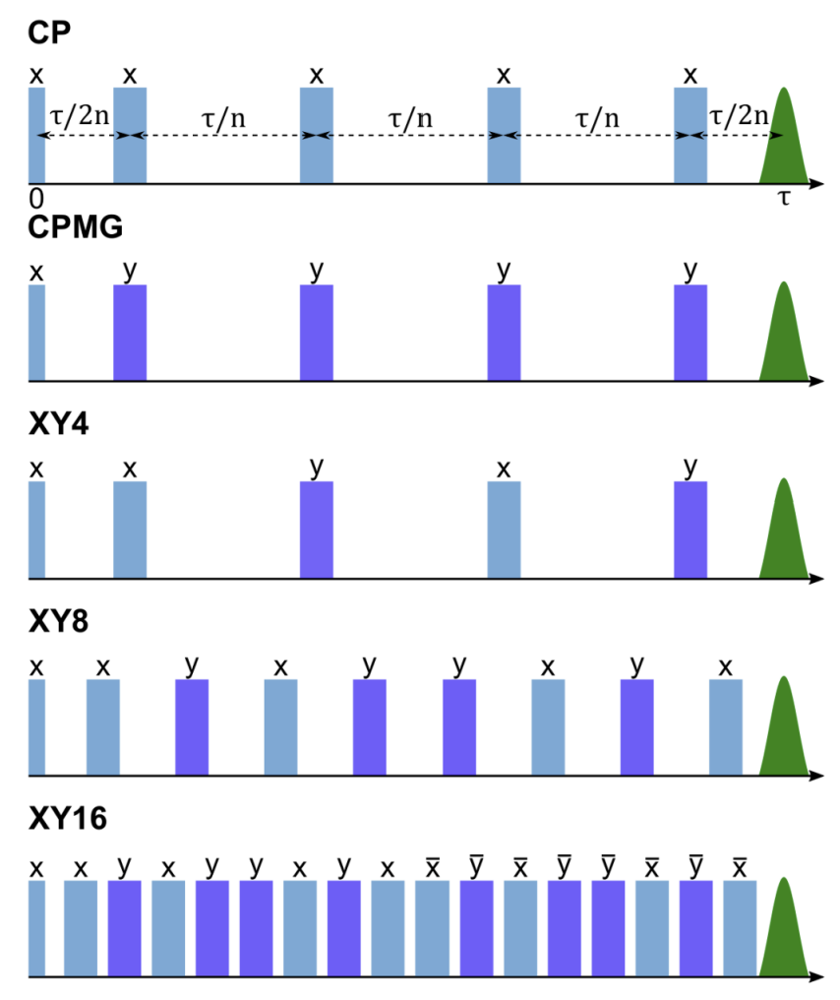

In [4]:
# Modulate each pulse timing (Equivalent Spacing)
# pulse list
# skip pi/2 pulse at T_srt, T_end
# pi pulse at pulse time list

def Pulse_Timing(T_srt, T_end, N):

    T = T_end - T_srt
    Seq_list = []
    for i in range(N):
      Seq_list.append(T_srt + (2*i+1)*T/(2*N))

    Seq = np.array(Seq_list)

    return Seq


# Modulate each pulse timing (Sinusoidal Spacing)
# pulse list
# skip pi/2 pulse at T_srt, T_end
# pi pulse at pulse time list

def Pulse_Timing_UDD(T_srt, T_end, N):

    T = T_end - T_srt
    Seq_list = []

    shift = 0
    for i in range(N):
      shift = shift + T * np.sin(np.pi/(2*(N+2))) * np.sin(np.pi*(i+1)/(N+2)) / np.cos(np.pi/(2*(N+2)))
      Seq_list.append(T_srt + shift)

    Seq = np.array(Seq_list)

    return Seq

In [5]:
# Single Square Pulse Envolope

def Single_pulse_env(t, B, T_cent):

    return B * (t > T_cent-0.5*np.pi/B) * (t < T_cent+0.5*np.pi/B)


# Single Square Pulse (lab frame)

def Single_pulse(t, B, Omega_qd, T_cent, Phi_qd):

    return Single_pulse_env(t, B, T_cent) * np.cos(Omega_qd * t + Phi_qd)

In [6]:
# time-dependent coefficient for resonator drive

def Hrd_rotating_frame(t, args):
    """
    Envelope function for the readout drive
    """
    A = args['A'] # amplitude of the readout drive
    T_srt = args['T_srt_r'] # duration of the readout drive, in units of ns
    T_end = args['T_end_r'] # duration of the readout drive, in units of ns

    return A * (T_srt <= t) * (t <= T_end)


def Hrd_lab_frame(t, args):
    omega_rd = args['Omega_rd']
    return Hrd_rotating_frame(t, args) * np.cos(omega_rd * t)

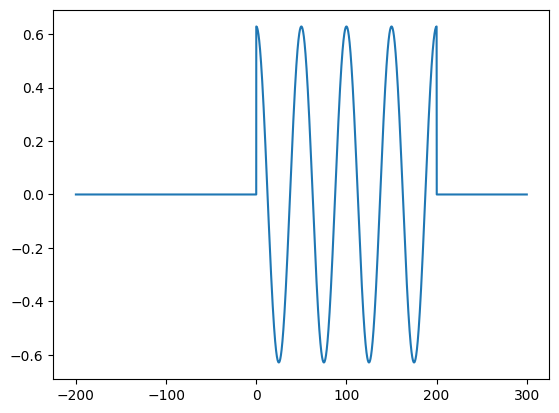

In [7]:
# resonator drive pulse simulation

tlist = np.linspace(-200, 300, 10000)
plt.figure()
plt.plot(tlist, Hrd_lab_frame(tlist, {'A': 2*np.pi*0.1, 'T_srt_r': 0, 'T_end_r': 200, 'Omega_rd': 2*np.pi*0.02}))

## CP CPMG UDD Sequence

In [8]:
# CP (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N_seq (number of pulse)

def CP_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    N = args['N_seq']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, N)
    pulse = 0

    for T_cent in Seq:
      pulse = pulse + Single_pulse(t, B, Omega_qd, T_cent, 0)

    return pulse

In [9]:
# CPMG (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N_seq (number of pulse)

def CPMG_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    N = args['N_seq']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, N)
    pulse = 0

    for T_cent in Seq:
      pulse = pulse + Single_pulse(t, B, Omega_qd, T_cent, 0.5*np.pi)

    return pulse

In [10]:
# CPMG (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)
# N_seq (number of pulse)

def UDD_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    N = args['N_seq']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing_UDD(T_srt, T_end, N)
    pulse = 0

    for T_cent in Seq:
      pulse = pulse + Single_pulse(t, B, Omega_qd, T_cent, 0.5*np.pi)

    return pulse

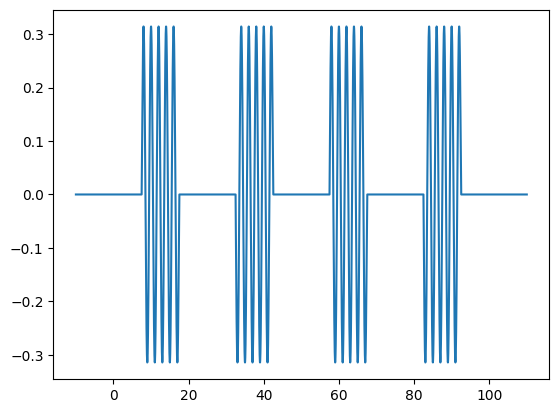

In [11]:
# qubit drive pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, CP_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'N_seq': 4, 'Omega_qd': 2*np.pi*0.5}))

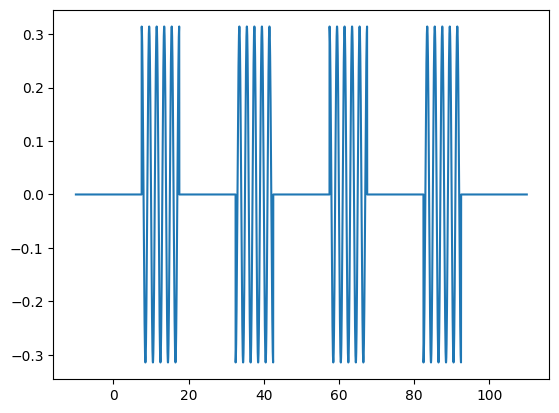

In [12]:
# qubit drive pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, CPMG_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'N_seq': 4, 'Omega_qd': 2*np.pi*0.5}))

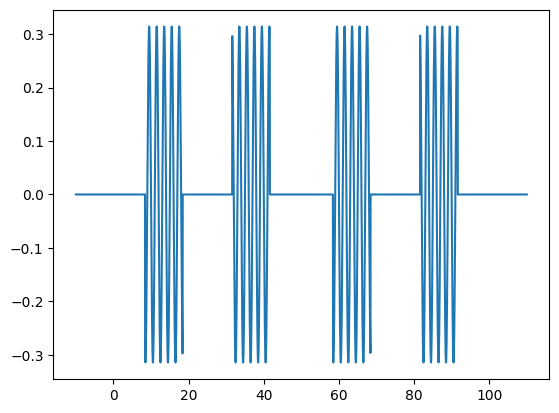

In [13]:
# qubit drive pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, UDD_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'N_seq': 4, 'Omega_qd': 2*np.pi*0.5}))

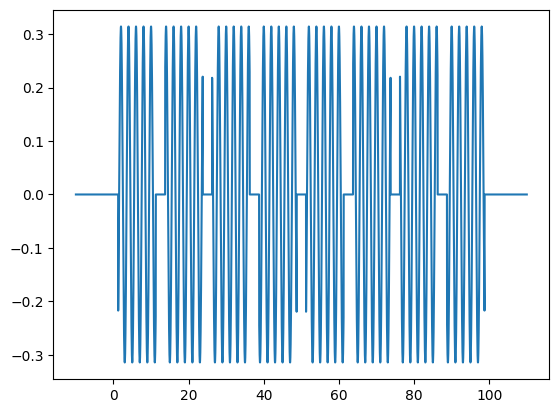

In [14]:
# qubit drive pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, CP_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'N_seq': 8, 'Omega_qd': 2*np.pi*0.5}))

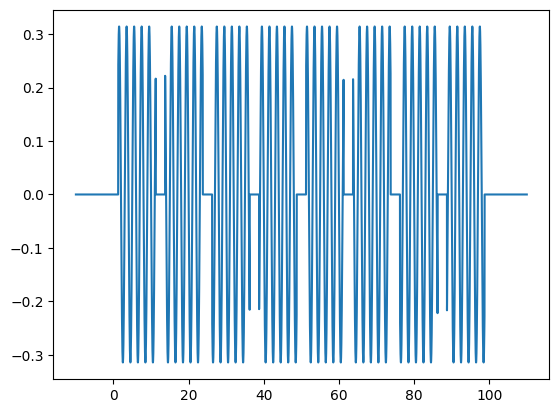

In [15]:
# qubit drive pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, CPMG_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'N_seq': 8, 'Omega_qd': 2*np.pi*0.5}))

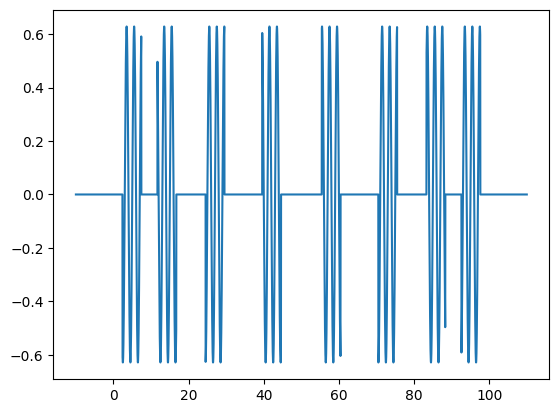

In [16]:
# qubit drive pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, UDD_lab_frame(tlist, {'B': 2*np.pi*0.1, 'T_srt_q': 0, 'T_end_q': 100, 'N_seq': 8, 'Omega_qd': 2*np.pi*0.5}))

## XY4 XY8 XY16 Sequence

In [17]:
# XY4 (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)

def XY4_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, 4)
    pulse = 0

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[0], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[1], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[2], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[3], 1.0*np.pi)

    return pulse

In [18]:
# XY8 (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)

def XY8_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, 8)
    pulse = 0

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[0], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[1], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[2], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[3], 0.5*np.pi)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[4], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[5], 1.0*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[6], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[7], 1.0*np.pi)

    return pulse

In [19]:
# XY16 (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)

def XY16_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing(T_srt, T_end, 16)
    pulse = 0

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[0], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[1], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[2], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[3], 0.5*np.pi)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[4], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[5], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[6], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[7], 0)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[8], np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[9], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[10], np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[11], 1.5*np.pi)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[12], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[13], np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[14], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[15], np.pi)

    return pulse

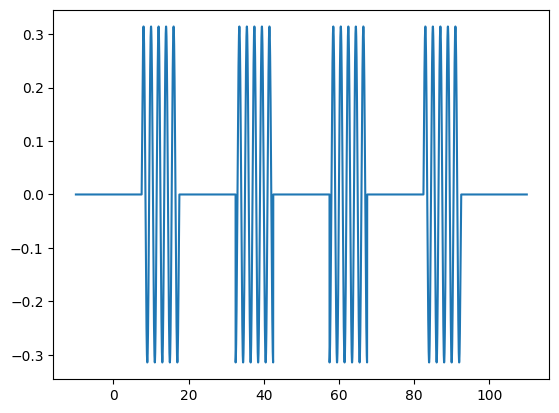

In [20]:
# qubit pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, XY4_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'Omega_qd': 2*np.pi*0.5}))

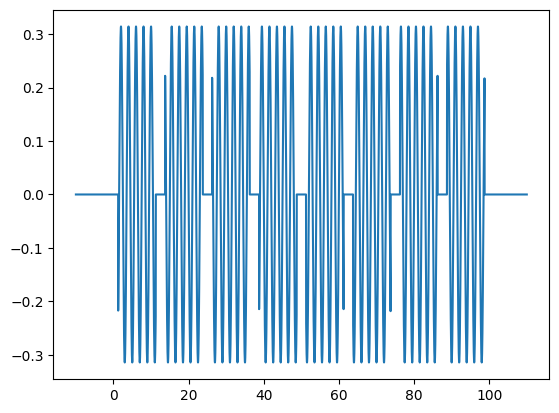

In [21]:
# qubit pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, XY8_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'Omega_qd': 2*np.pi*0.5}))

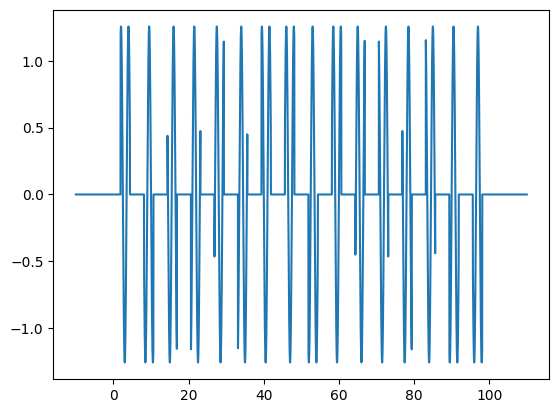

In [22]:
# qubit pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, XY16_lab_frame(tlist, {'B': 2*np.pi*0.2, 'T_srt_q': 0, 'T_end_q': 100, 'Omega_qd': 2*np.pi*0.5}))

## UDD4 UDD8 UDD16 Sequence

In [23]:
# UDD4 (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)

def UDD4_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing_UDD(T_srt, T_end, 4)
    pulse = 0

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[0], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[1], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[2], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[3], 0.5*np.pi)

    return pulse

In [24]:
# UDD8 (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)

def UDD8_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing_UDD(T_srt, T_end, 8)
    pulse = 0

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[0], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[1], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[2], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[3], 0.5*np.pi)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[4], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[5], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[6], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[7], 0)

    return pulse

In [25]:
# UDD16 (lab frame)

# args

# B (qubit drive amplitude)
# Omega_qd (qubit drive frequency)
# T_srt (pulse start time)
# T_end (pulse end time)

def UDD16_lab_frame(t, args):

    Omega_qd = args['Omega_qd']
    T_srt = args['T_srt_q']
    T_end = args['T_end_q']
    B = args['B']

    # T_cent
    Seq = Pulse_Timing_UDD(T_srt, T_end, 16)
    pulse = 0

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[0], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[1], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[2], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[3], 0.5*np.pi)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[4], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[5], 0)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[6], 0.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[7], 0)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[8], np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[9], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[10], np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[11], 1.5*np.pi)

    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[12], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[13], np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[14], 1.5*np.pi)
    pulse = pulse + Single_pulse(t, B, Omega_qd, Seq[15], np.pi)

    return pulse

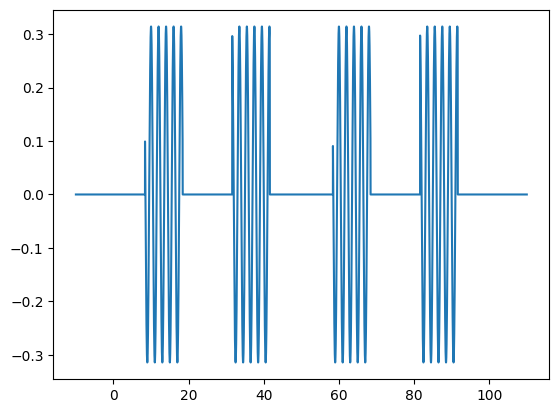

In [26]:
# qubit pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, UDD4_lab_frame(tlist, {'B': 2*np.pi*0.05, 'T_srt_q': 0, 'T_end_q': 100, 'Omega_qd': 2*np.pi*0.5}))

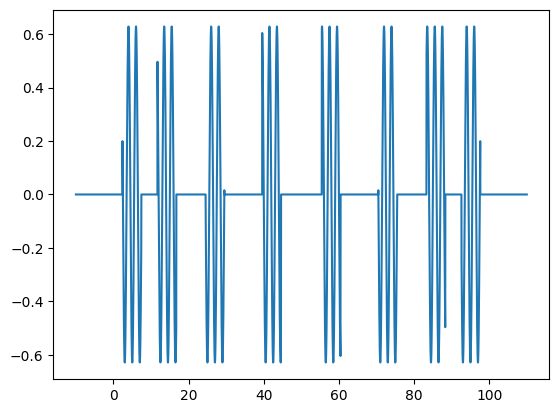

In [27]:
# qubit pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, UDD8_lab_frame(tlist, {'B': 2*np.pi*0.1, 'T_srt_q': 0, 'T_end_q': 100, 'Omega_qd': 2*np.pi*0.5}))

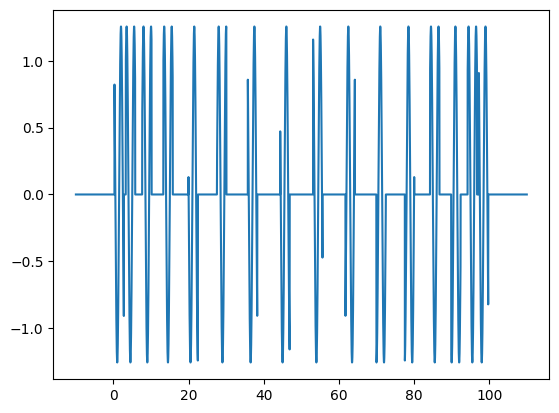

In [28]:
# qubit pulse simulation
tlist = np.linspace(-10, 110, 10000)
plt.figure()
plt.plot(tlist, UDD16_lab_frame(tlist, {'B': 2*np.pi*0.2, 'T_srt_q': 0, 'T_end_q': 100, 'Omega_qd': 2*np.pi*0.5}))

# Dynamical Decoupling Simulation

$ \omega_{qd} = \omega_q^b + \chi $

Evolution time 1000ns

Initial state $ |0\rangle $

In [29]:
N = 5

omega_r = 2 * np.pi * 7.0     # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0     # qubit frequency in units of GHz

g = 2 * np.pi * 0.1           # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01      # resonator linewidth in units of GHz

detune = omega_q-omega_r
chi = g*g/(detune)

omega_rd = omega_r            # qubit frequency in units of GHz
omega_qd = omega_q + chi      # qubit frequency in units of GHz

sx = sigmax()
sy = sigmay()
sz = sigmaz()
sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

tlist = np.linspace(0, 1000, 10000)
T_end_q = 1000

cos = np.sqrt(0.5 + 0.5*5/np.sqrt(26))
sin = np.sqrt(0.5 - 0.5*5/np.sqrt(26))


psi_20 = tensor(basis(2,0), basis(N,0))
psi_21 = cos*tensor(basis(2,1), basis(N,0)) - sin*tensor(basis(2,0), basis(N,1))
psi_2s = psi_20


H0 = -0.5*omega_q*sz_composite + omega_r*number_composite + g*(tensor(sm, a.dag()) + tensor(sp, a))
H1 = tensor(qeye(2), a + a.dag())
H2 = sx_composite

A = 0.0002 * 2 * np.pi
B = 0.1 * 2 * np.pi

x_list = []
y_list = []
z_list = []

## Ramsey

In [30]:
# Simulation

N_seq = 0

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))
print([x_rot[0], y_rot[0], result.expect[2][0]])

8.020532383248801e-05
[0.0, -0.0, 1.0]


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

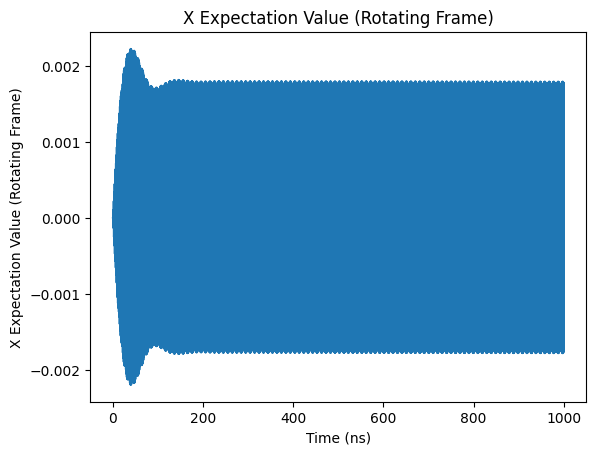

In [31]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

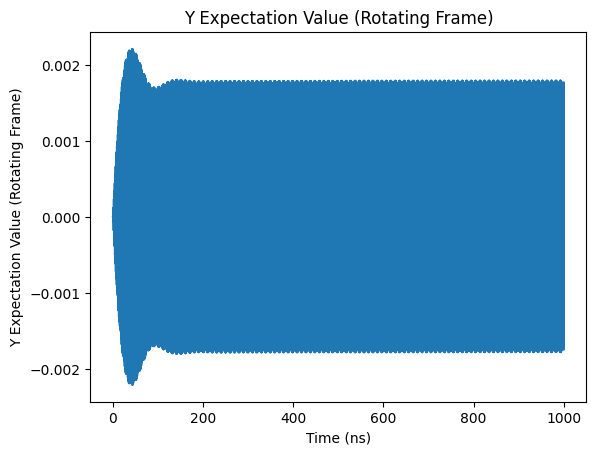

In [32]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

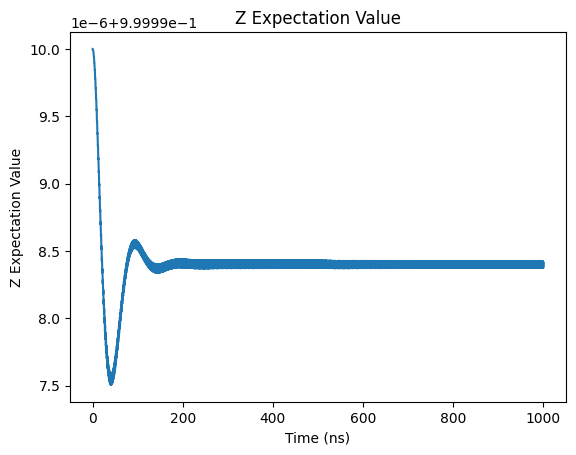

In [33]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

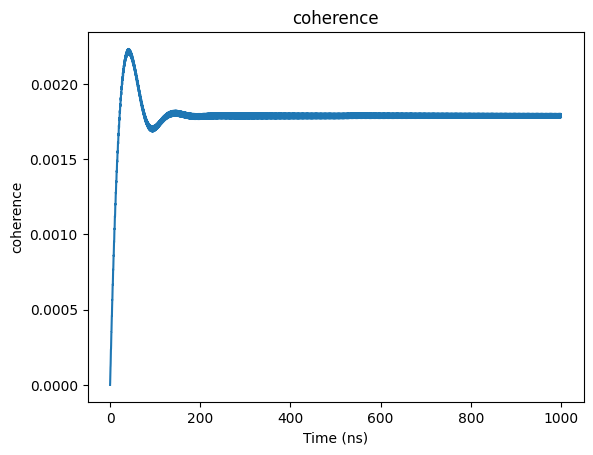

In [34]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

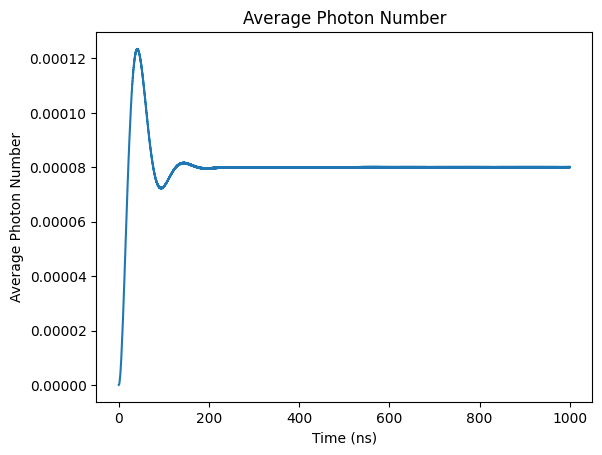

In [35]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

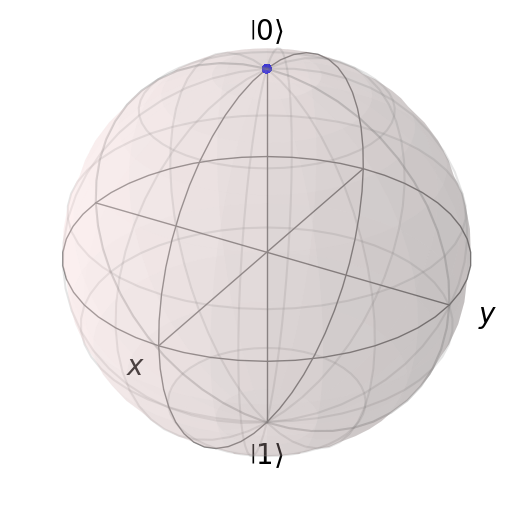

In [36]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [37]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=2)

In [38]:
# Simulation

N_seq = 2

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.00486302392908067


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

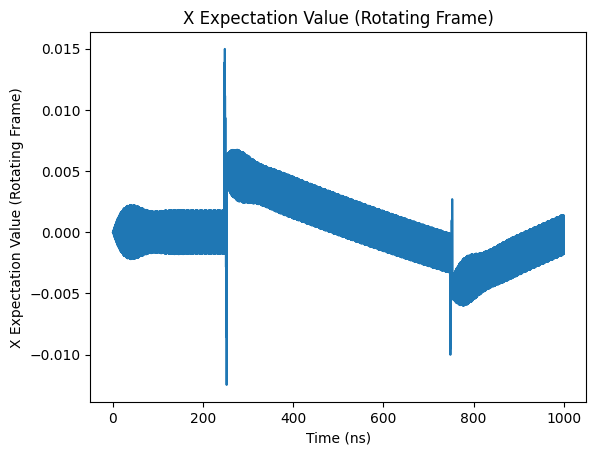

In [39]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

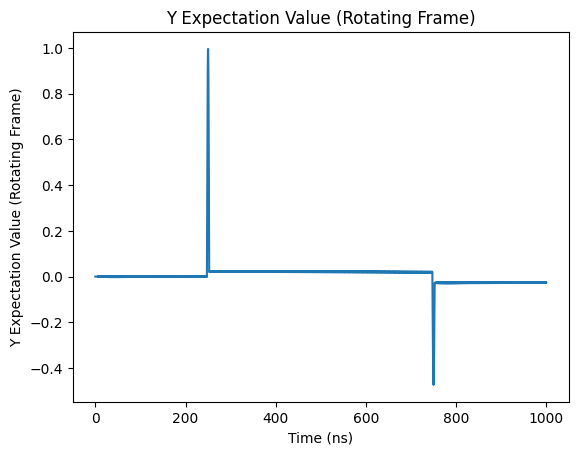

In [40]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

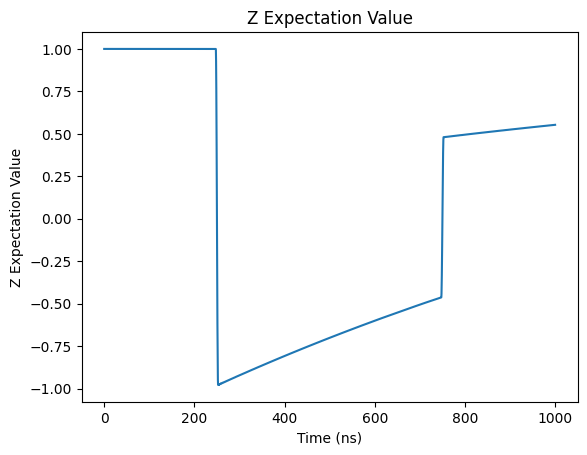

In [41]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

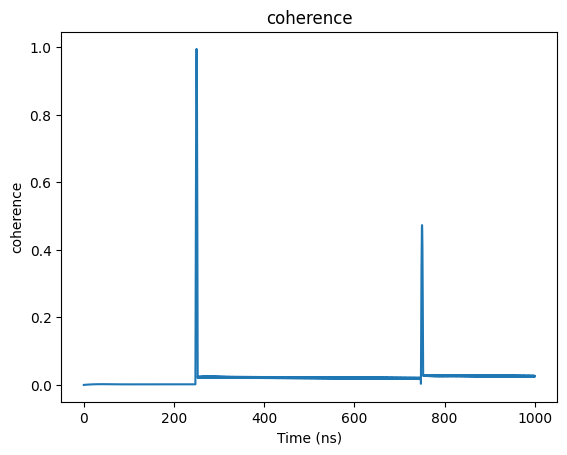

In [42]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

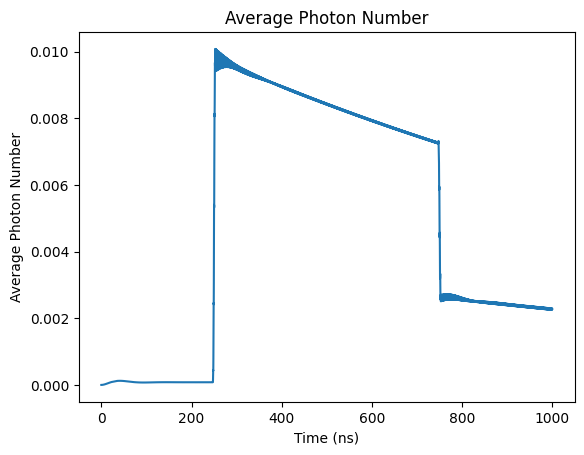

In [43]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

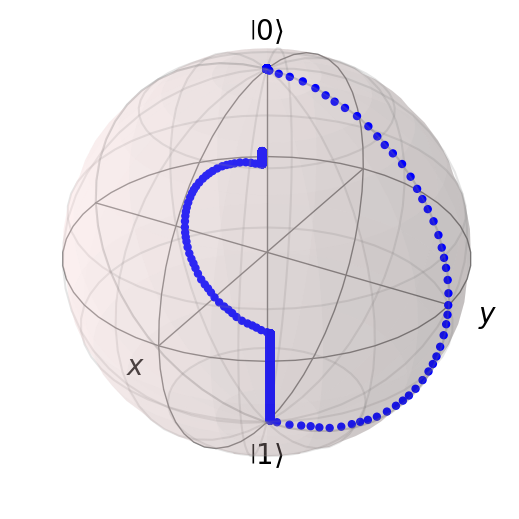

In [44]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [45]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=4)

In [46]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004949156570208561


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

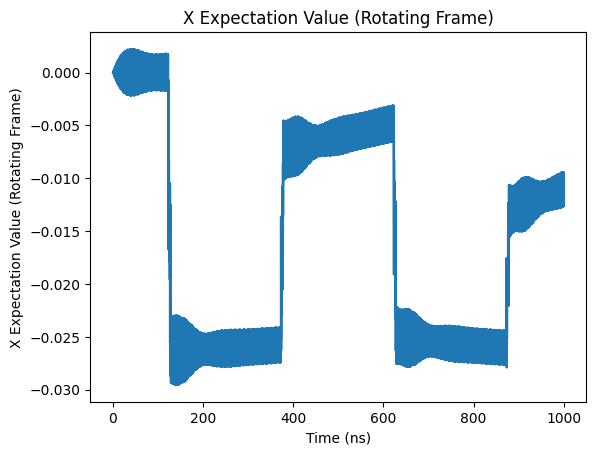

In [47]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

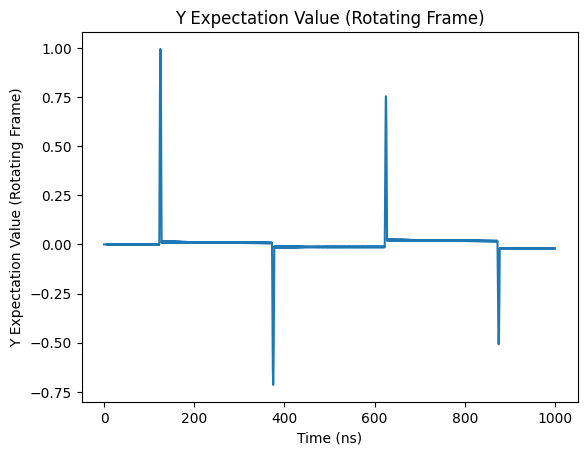

In [48]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

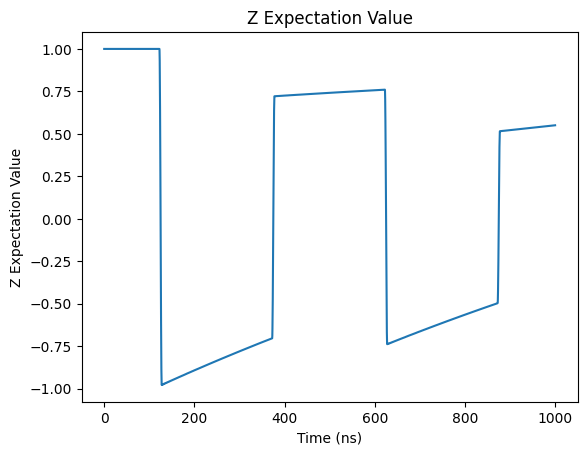

In [49]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

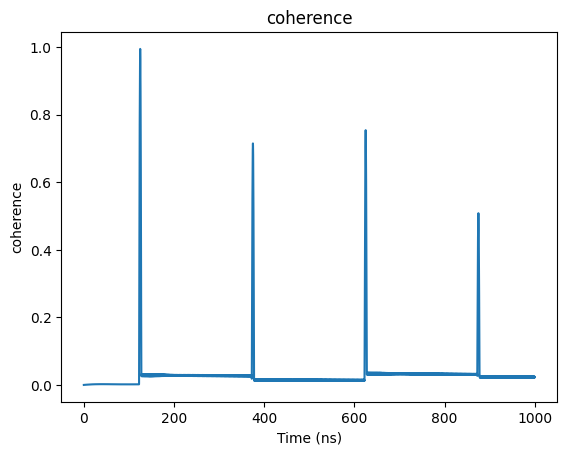

In [50]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

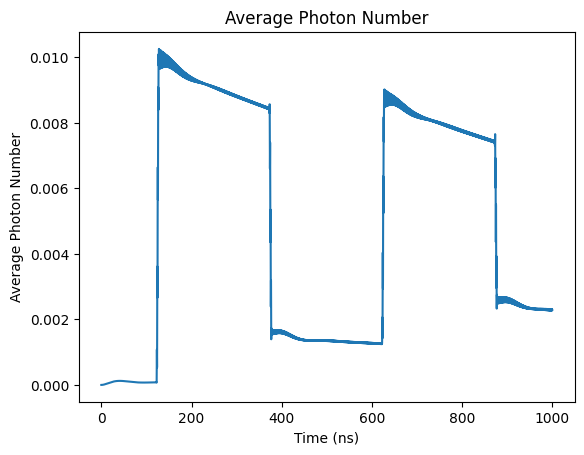

In [51]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

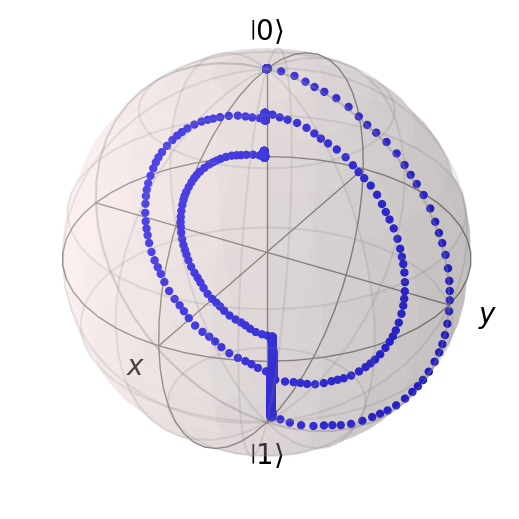

In [52]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [53]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY4

In [54]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY4_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004935839689615721


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

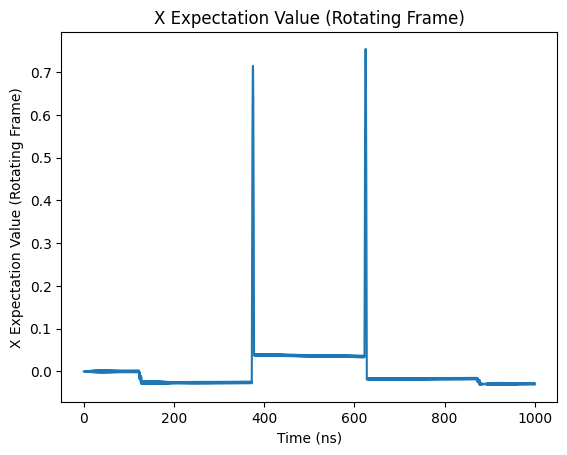

In [55]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

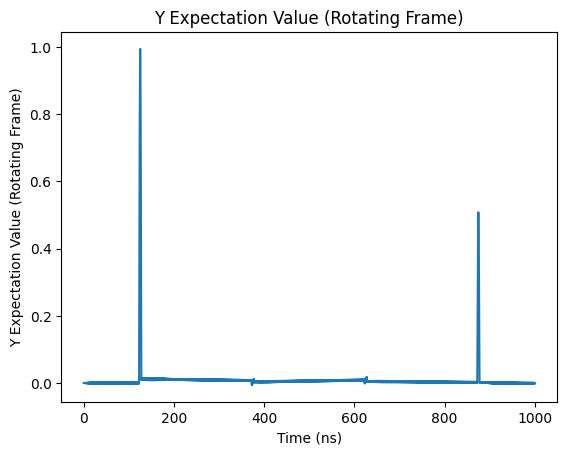

In [56]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

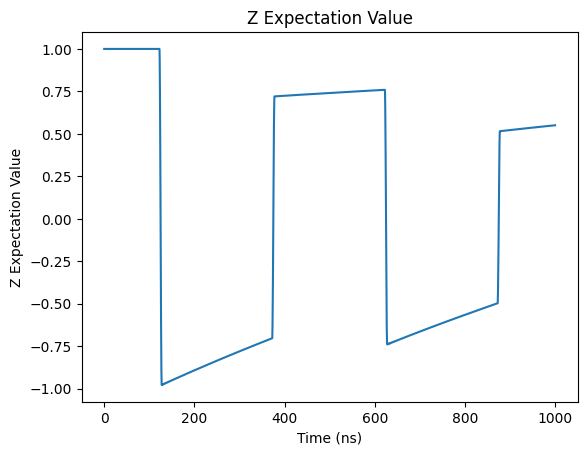

In [57]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

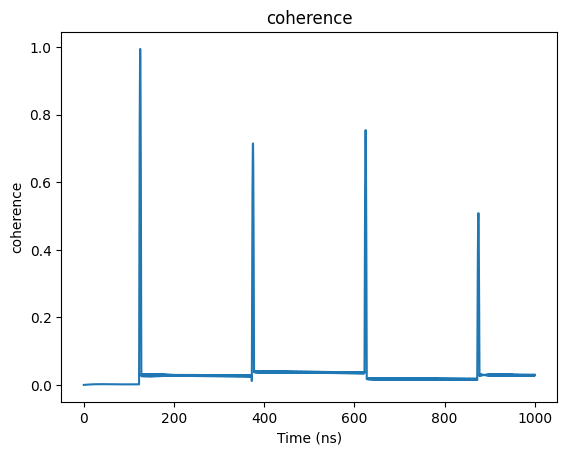

In [58]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

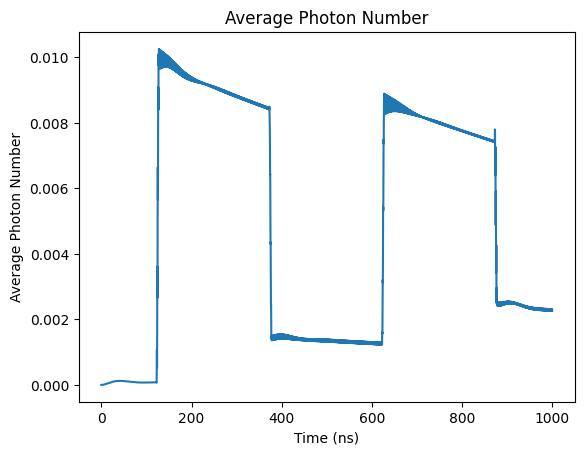

In [59]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

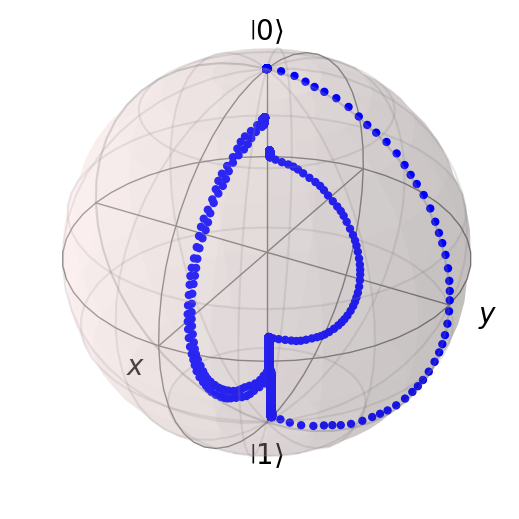

In [60]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [61]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=8)

In [62]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004982991796204814


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

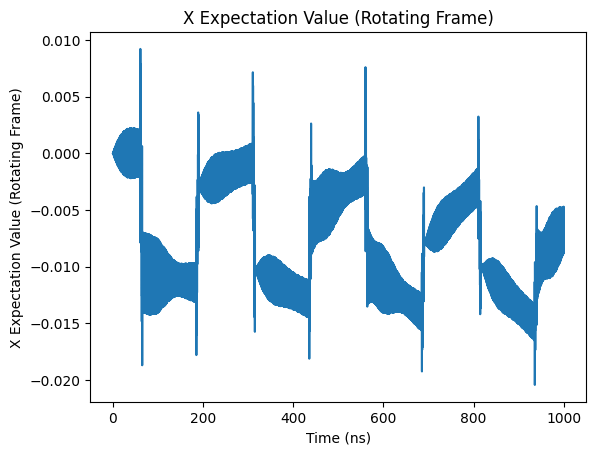

In [63]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

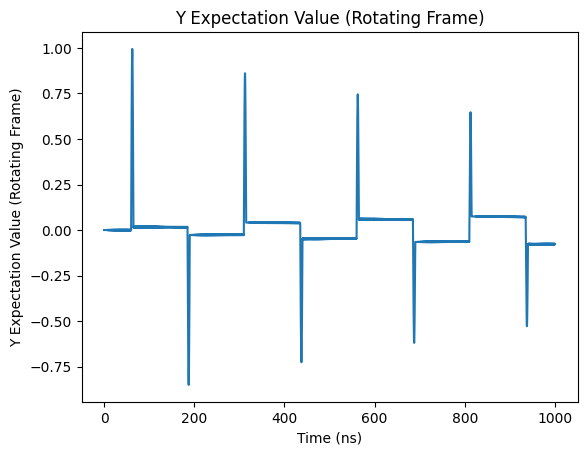

In [64]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

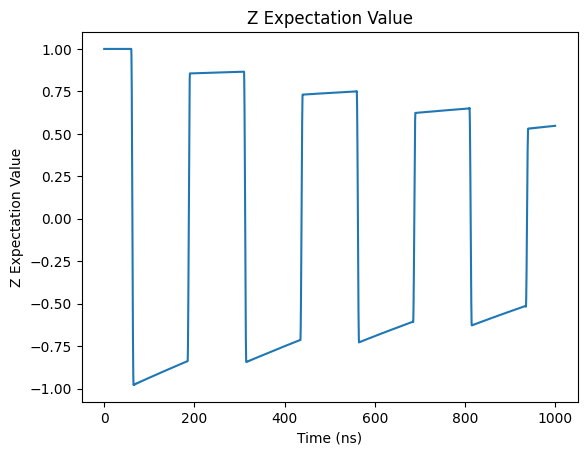

In [65]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

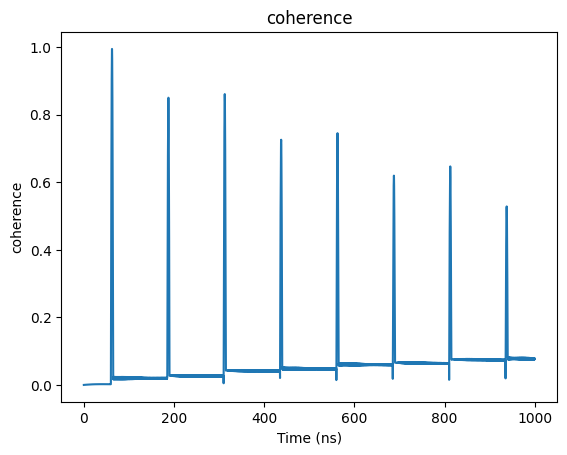

In [66]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

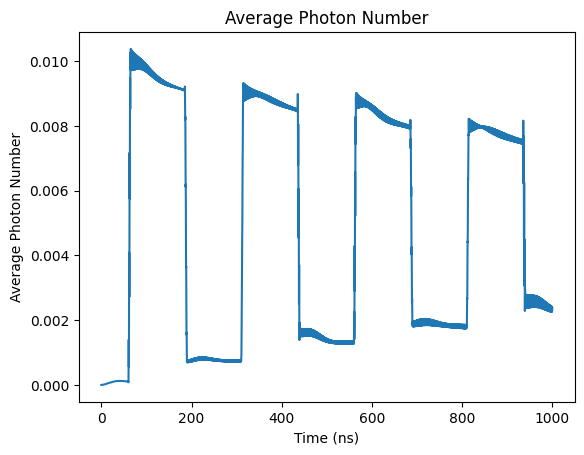

In [67]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

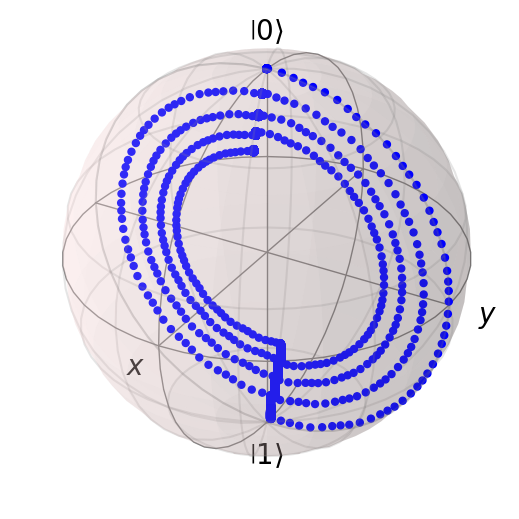

In [68]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [69]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY8

In [70]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY8_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004981852675784955


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

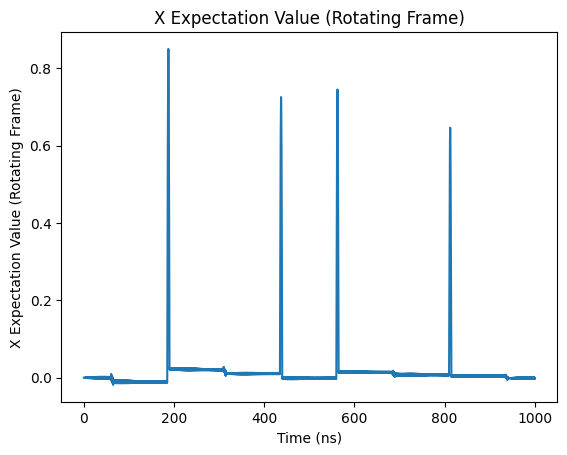

In [71]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

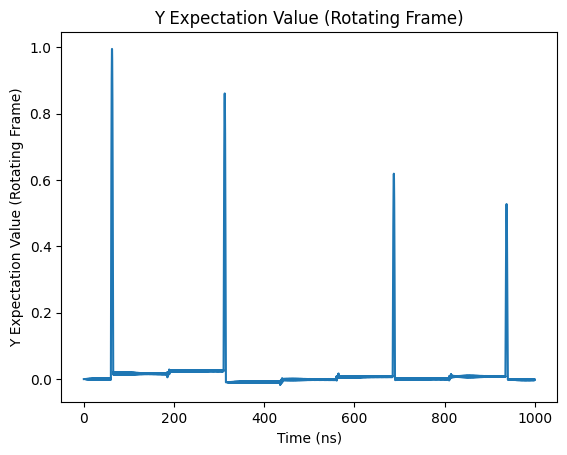

In [72]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

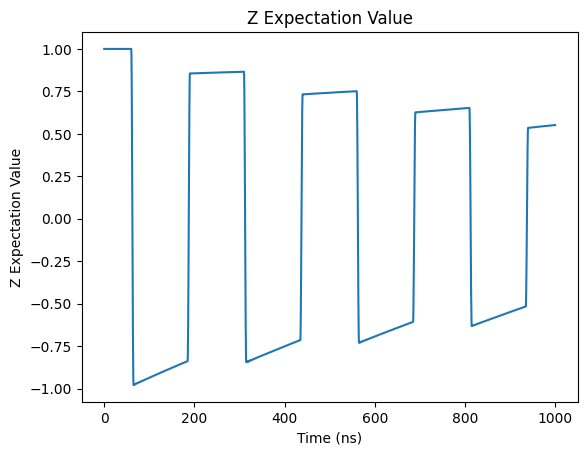

In [73]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

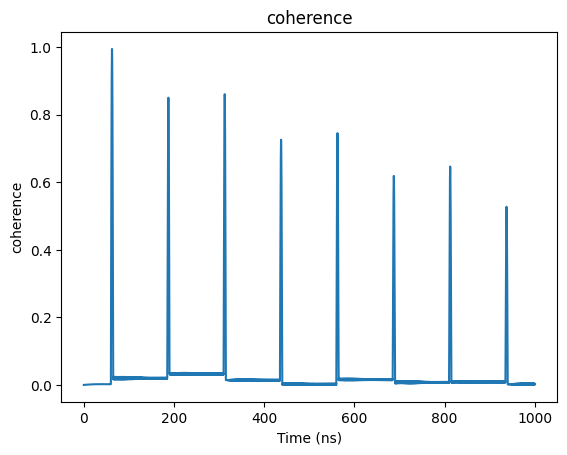

In [74]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

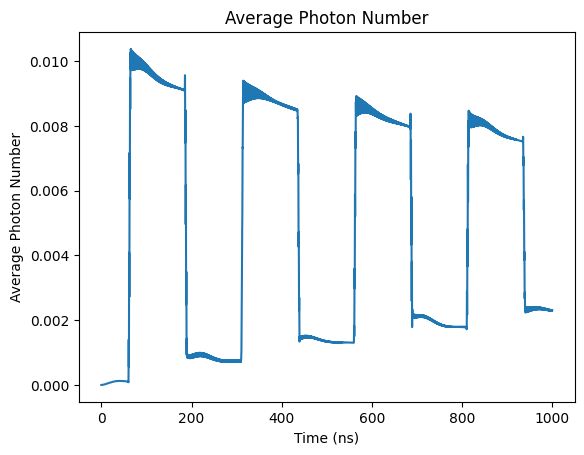

In [75]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

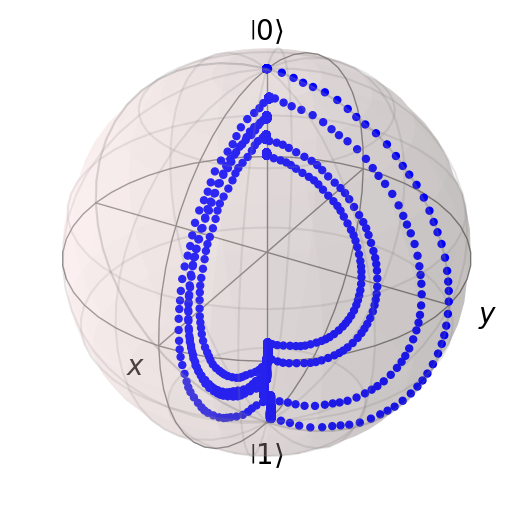

In [76]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [77]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=16)

In [78]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005050378505983119


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

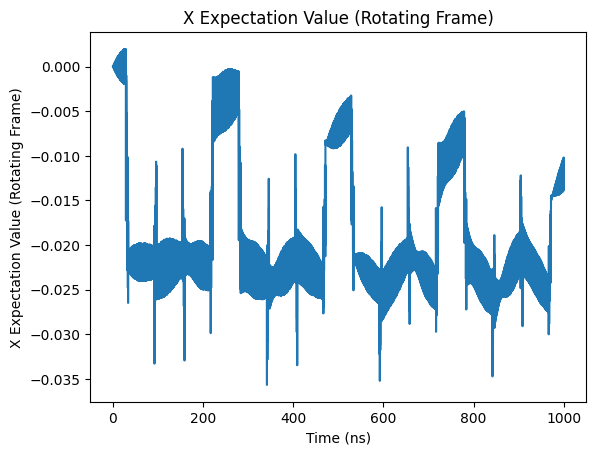

In [79]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

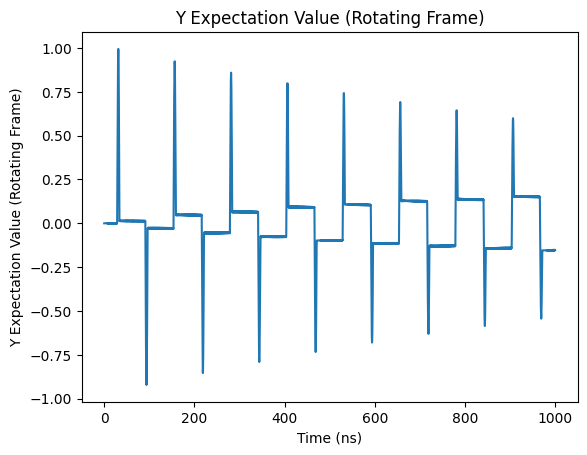

In [80]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

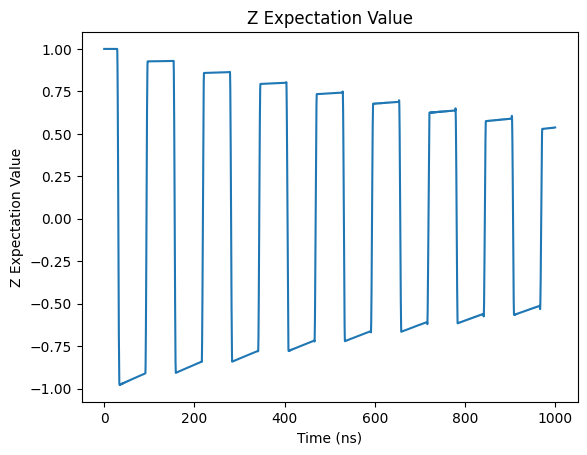

In [81]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

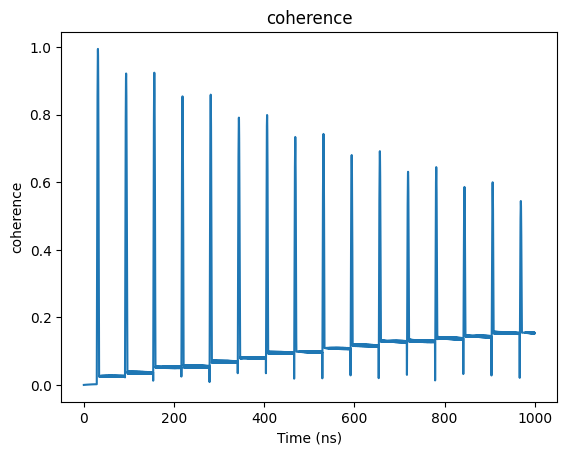

In [82]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

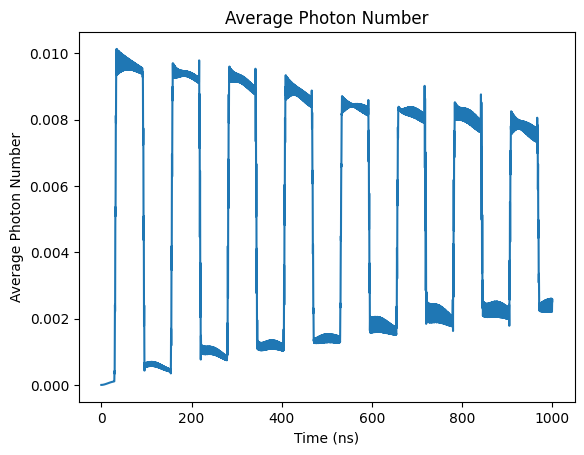

In [83]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

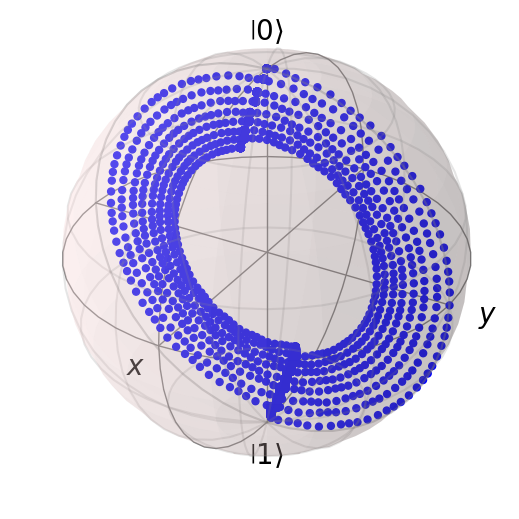

In [84]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [85]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY16

In [86]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY16_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005041616411603101


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

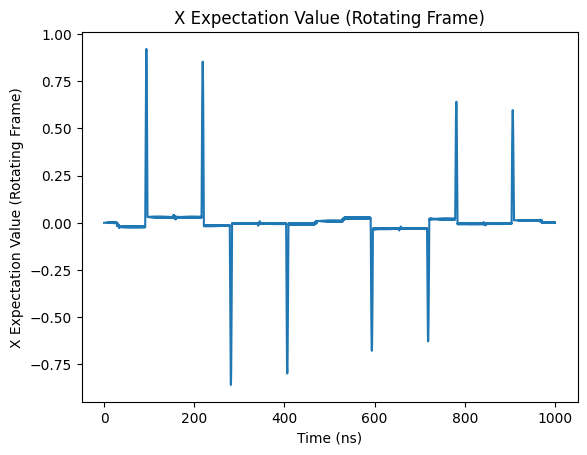

In [87]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

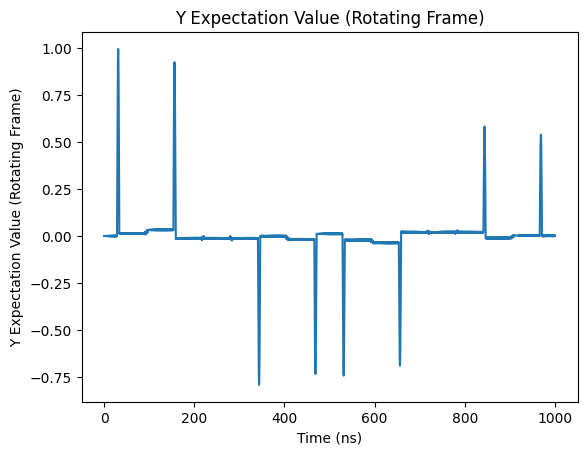

In [88]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

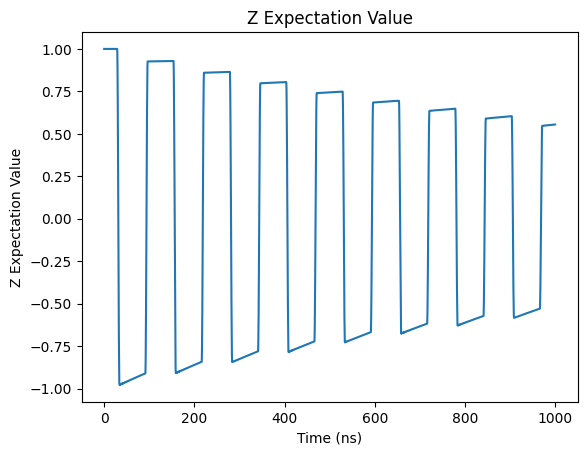

In [89]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

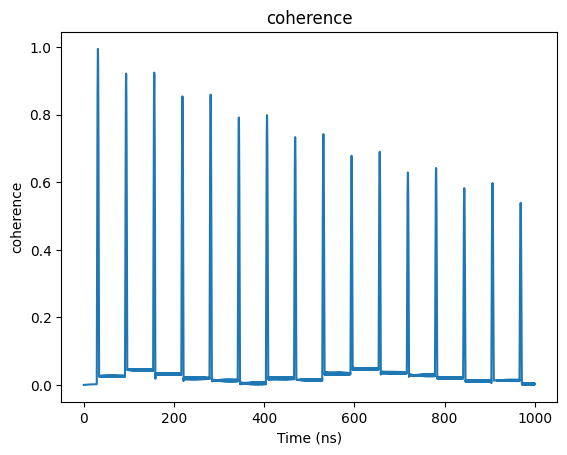

In [90]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

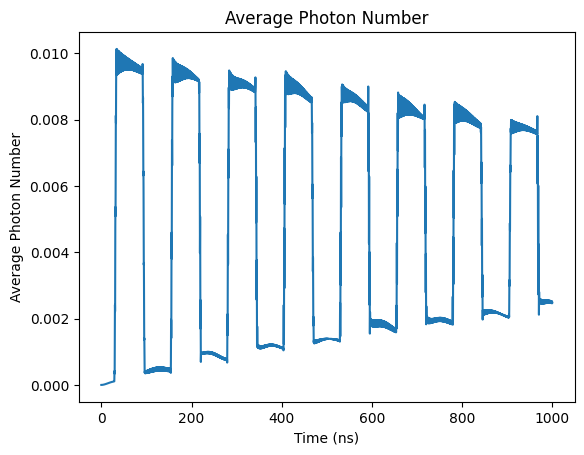

In [91]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

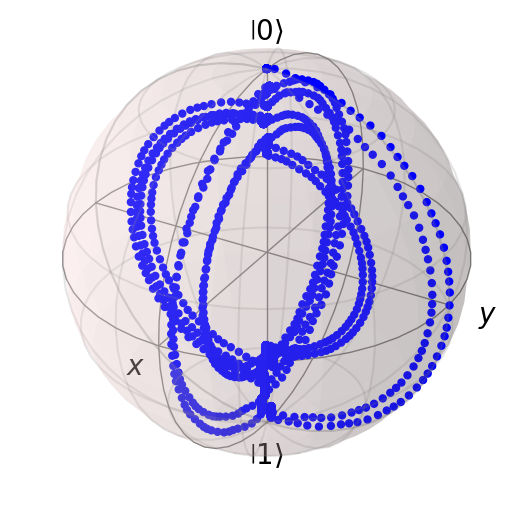

In [92]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [93]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## Print Coherence & Z

In [94]:
x_list

[-7.098686607543499e-06,
 -0.00019718507028187353,
 -0.011042256576336971,
 -0.02838791881509268,
 -0.006783118733394093,
 -0.001150163194052378,
 -0.01204749299129507,
 0.0014871516382334521]

In [95]:
y_list

[1.0869602968820732e-05,
 -0.02568287202606989,
 -0.020450440599397428,
 -0.0008493759073340063,
 -0.0769281302914166,
 -0.0017027086348140187,
 -0.1530930584009935,
 0.0015112209021645826]

In [96]:
z_list

[0.9999983999996672,
 0.5530352559757853,
 0.5503361469792587,
 0.5504202093889662,
 0.5471286824733684,
 0.551634118019886,
 0.5370304026216208,
 0.5549019374081705]

# Dynamical Decoupling Simulation

$ \omega_{qd} = \omega_q^b + \chi $

Evolution time 1000ns

Initial state $ \cos(\frac{1\pi}{8}) |0\rangle + \sin(\frac{1\pi}{8}) |1\rangle $

In [97]:
N = 5

omega_r = 2 * np.pi * 7.0     # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0     # qubit frequency in units of GHz

g = 2 * np.pi * 0.1           # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01      # resonator linewidth in units of GHz

detune = omega_q-omega_r
chi = g*g/(detune)

omega_rd = omega_r            # qubit frequency in units of GHz
omega_qd = omega_q + chi      # qubit frequency in units of GHz

sx = sigmax()
sy = sigmay()
sz = sigmaz()
sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

tlist = np.linspace(0, 1000, 10000)
T_end_q = 1000

cos = np.sqrt(0.5 + 0.5*5/np.sqrt(26))
sin = np.sqrt(0.5 - 0.5*5/np.sqrt(26))


psi_20 = tensor(basis(2,0), basis(N,0))
psi_21 = cos*tensor(basis(2,1), basis(N,0)) - sin*tensor(basis(2,0), basis(N,1))
psi_2s = np.cos(1*np.pi/8) * psi_20 + np.sin(1*np.pi/8) * psi_21


H0 = -0.5*omega_q*sz_composite + omega_r*number_composite + g*(tensor(sm, a.dag()) + tensor(sp, a))
H1 = tensor(qeye(2), a + a.dag())
H2 = sx_composite

A = 0.0002 * 2 * np.pi
B = 0.1 * 2 * np.pi

x_list = []
y_list = []
z_list = []

## Ramsey

In [98]:
# Simulation

N_seq = 0

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))
print([x_rot[0], y_rot[0], result.expect[2][0]])

0.0011454702068037688
[0.7036655234717203, -0.0, 0.7099506753885818]


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

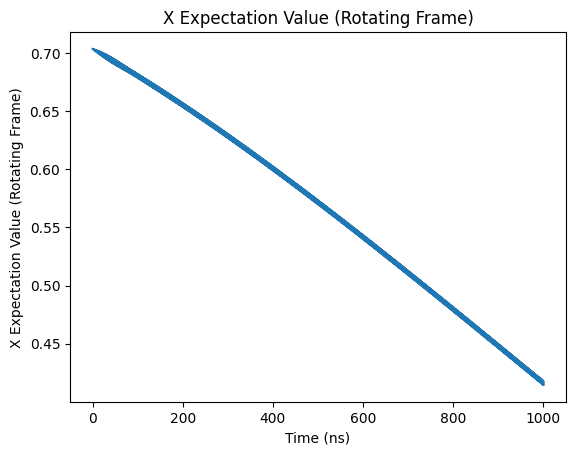

In [99]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

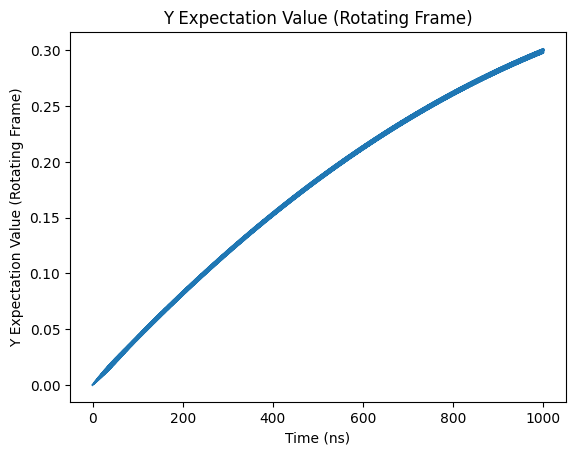

In [100]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

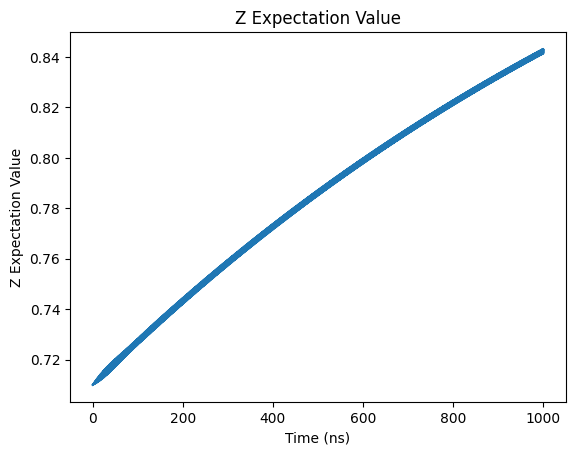

In [101]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

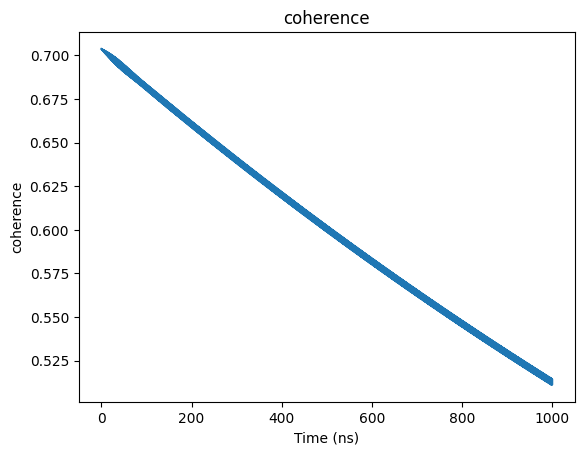

In [102]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

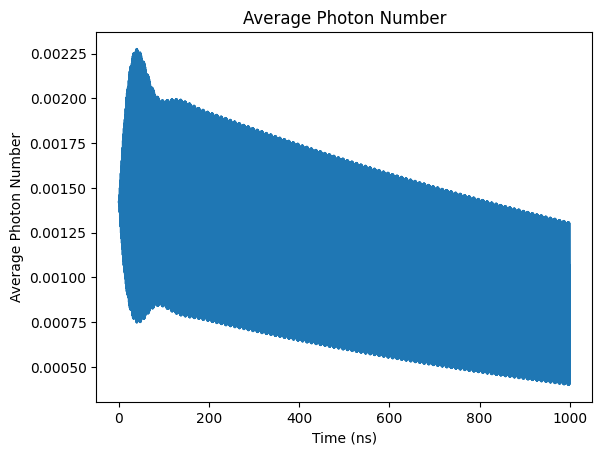

In [103]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

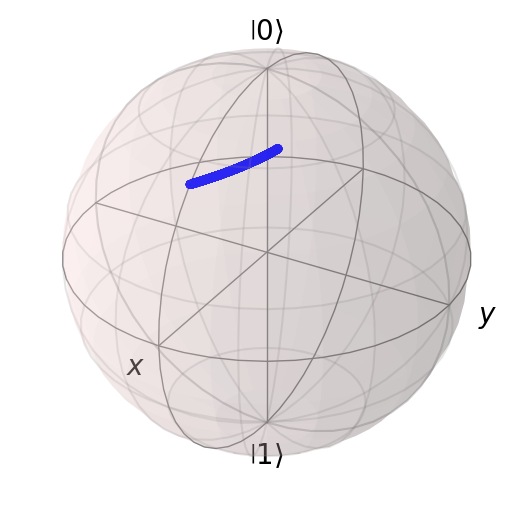

In [104]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [105]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=2)

In [106]:
# Simulation

N_seq = 2

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004877911216704841


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

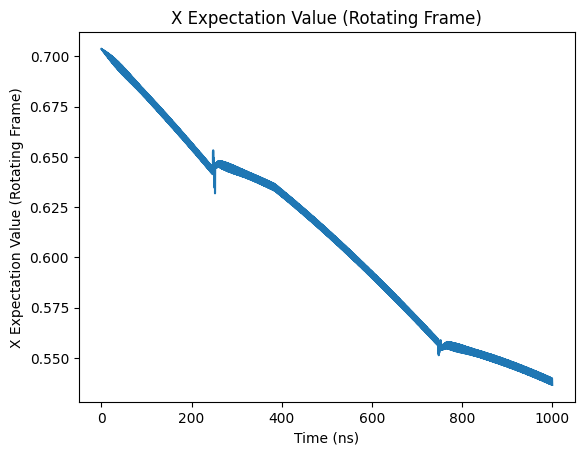

In [107]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

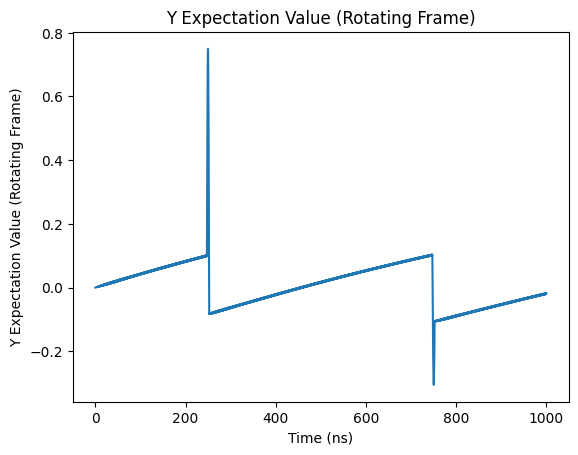

In [108]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

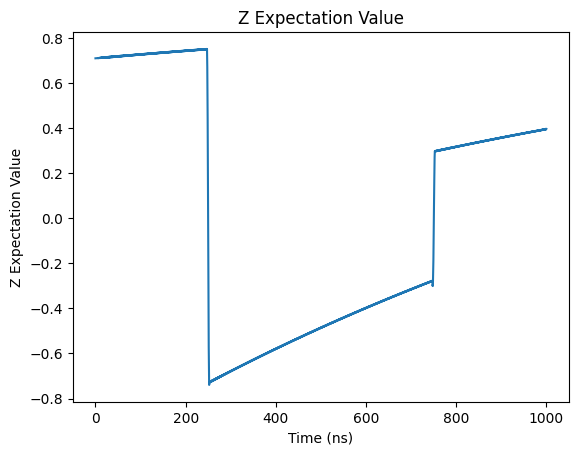

In [109]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

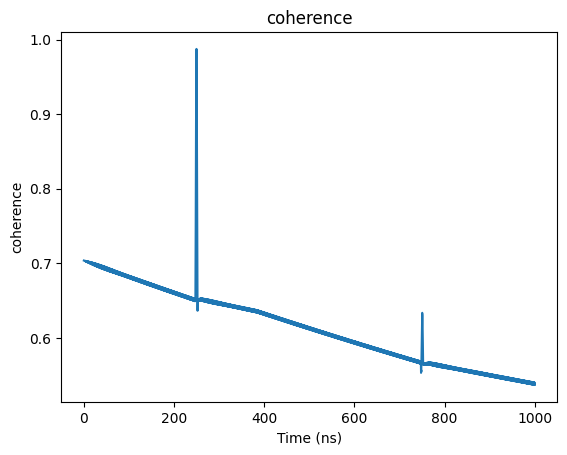

In [110]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

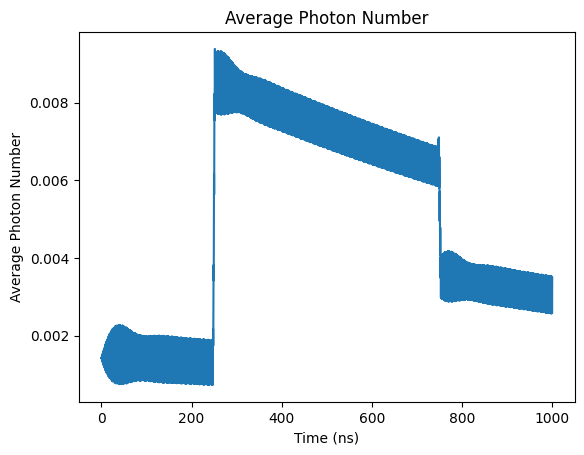

In [111]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

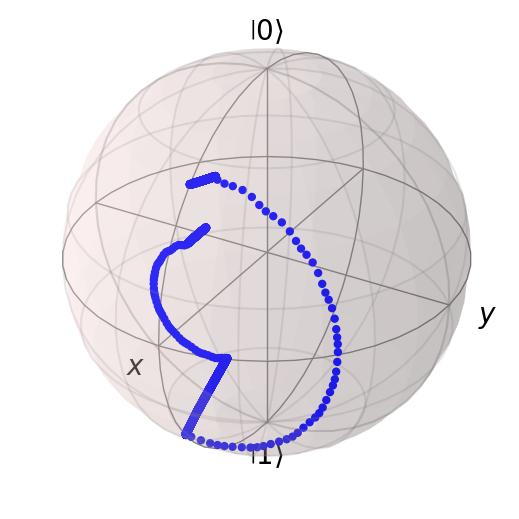

In [112]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [113]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=4)

In [114]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004998502247654467


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

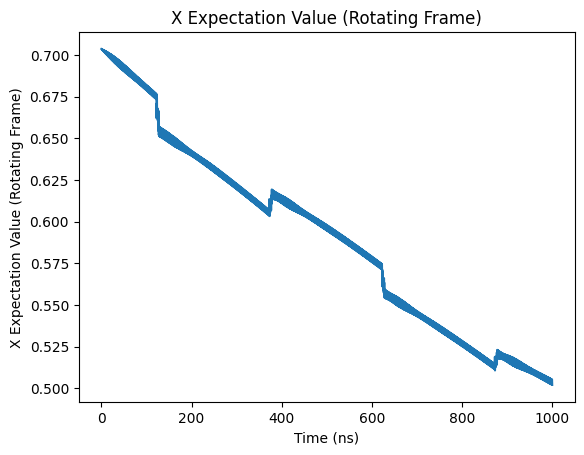

In [115]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

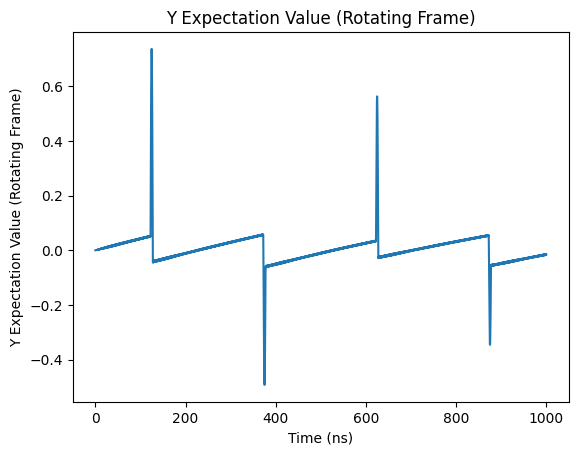

In [116]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

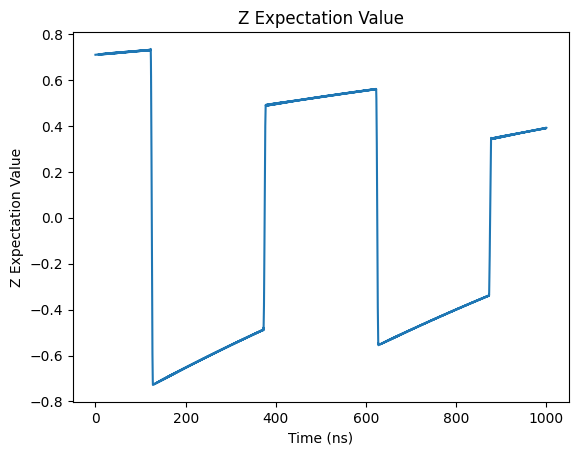

In [117]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

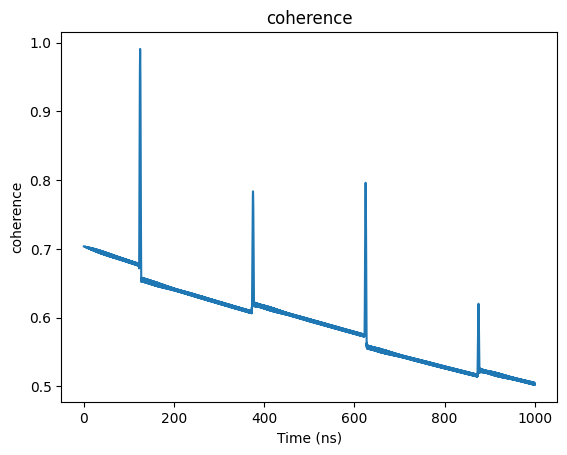

In [118]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

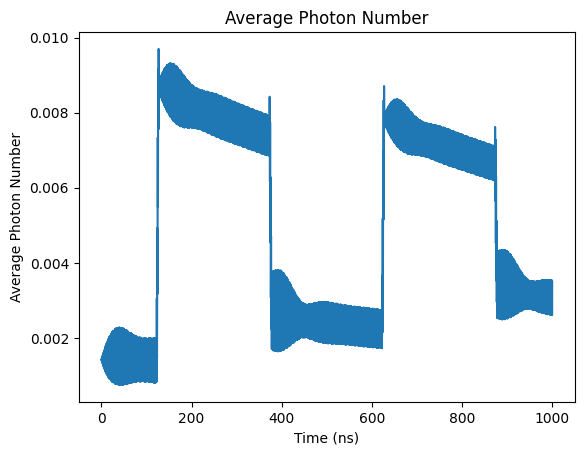

In [119]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

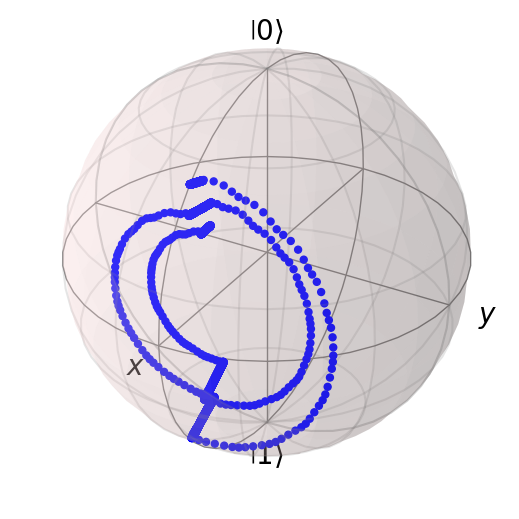

In [120]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [121]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY4

In [122]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY4_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.00490709556212645


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

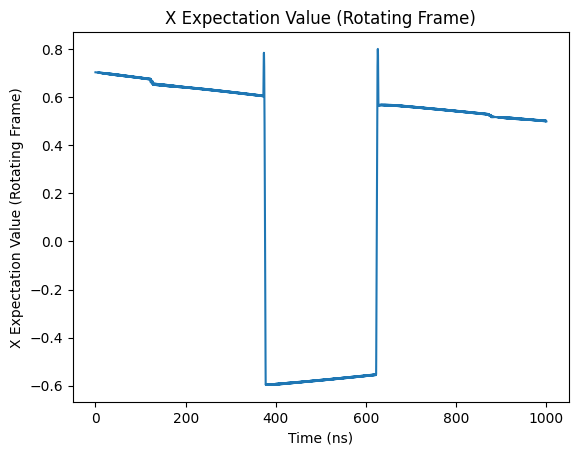

In [123]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

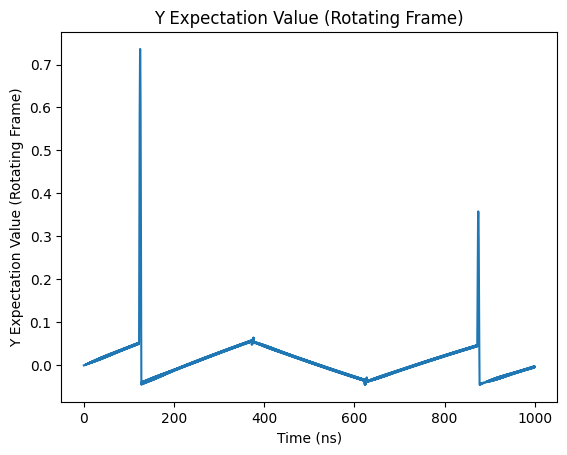

In [124]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

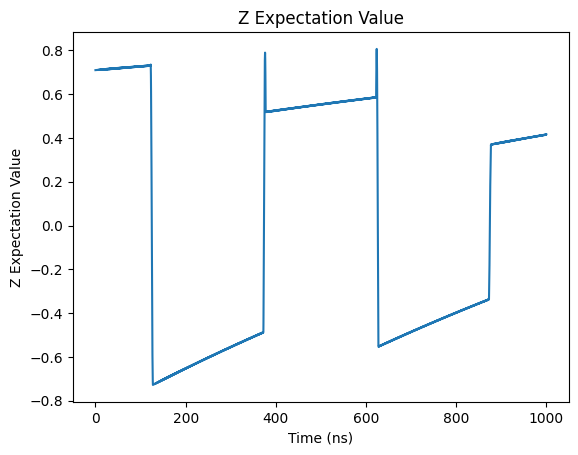

In [125]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

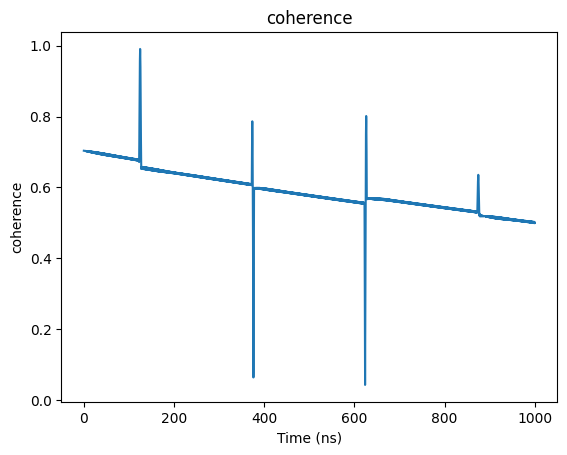

In [126]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

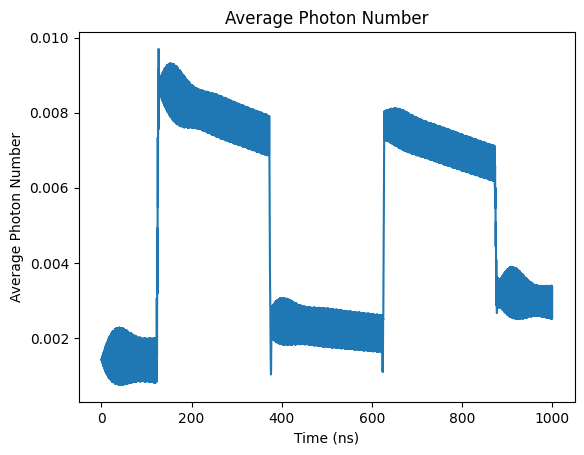

In [127]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

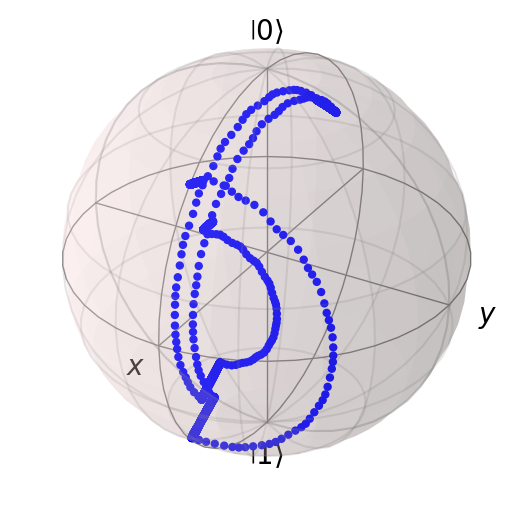

In [128]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [129]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=8)

In [130]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005015577102405902


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

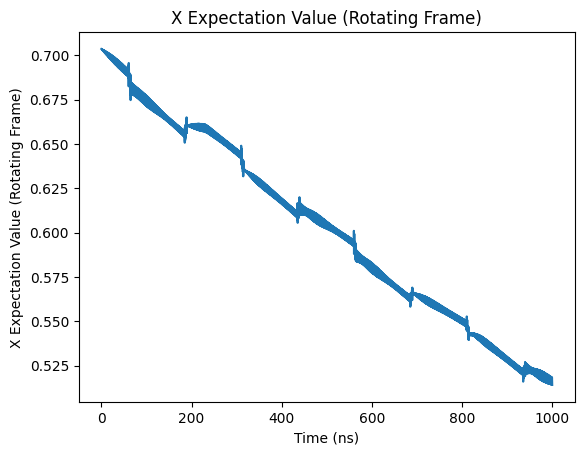

In [131]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

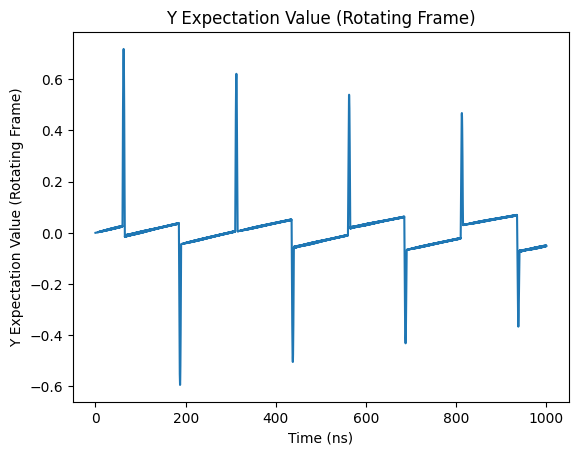

In [132]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

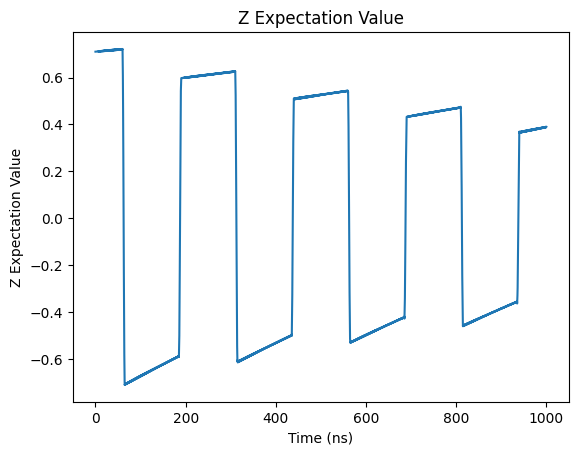

In [133]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

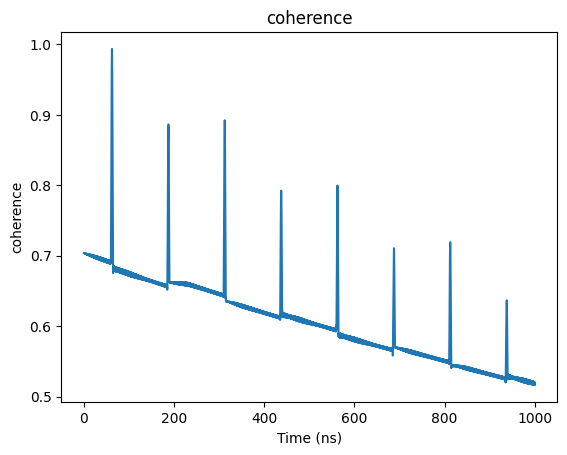

In [134]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

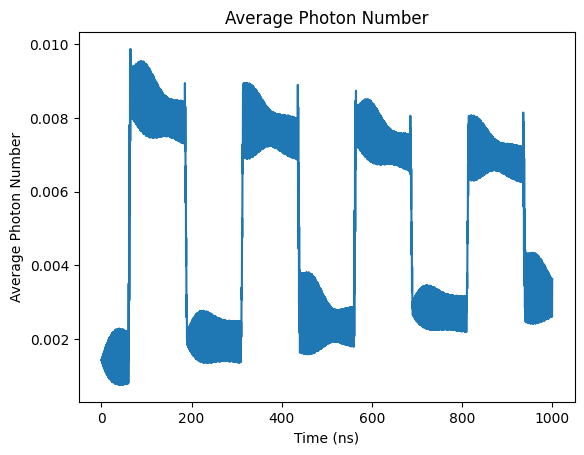

In [135]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

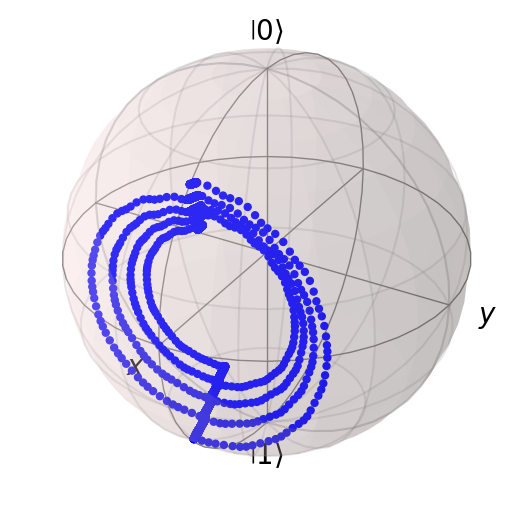

In [136]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [137]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY8

In [138]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY8_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004985045560087152


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

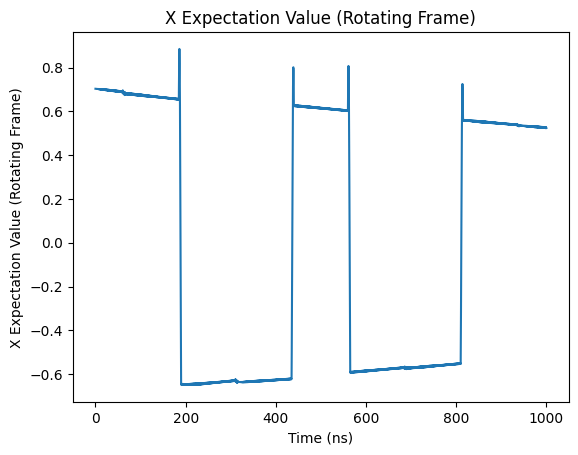

In [139]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

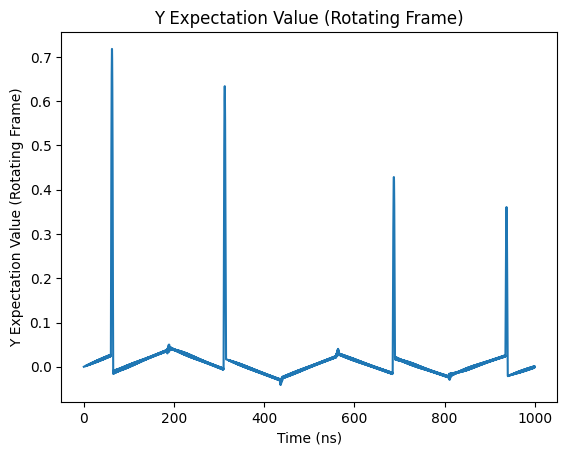

In [140]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

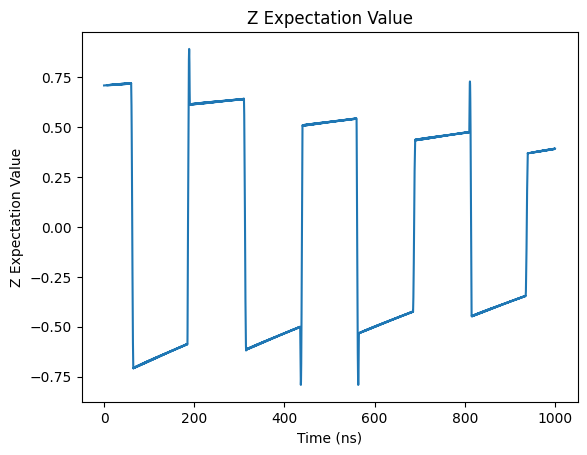

In [141]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

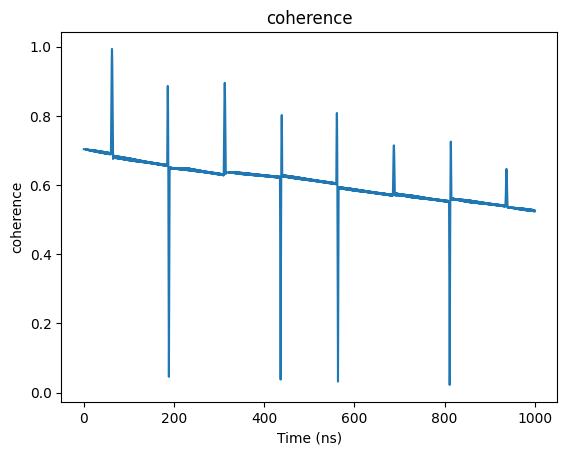

In [142]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

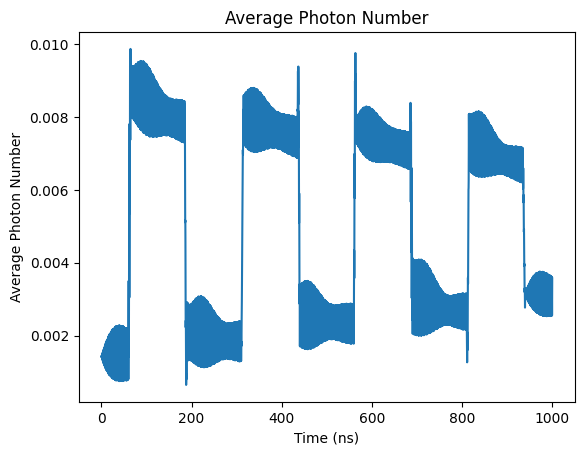

In [143]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

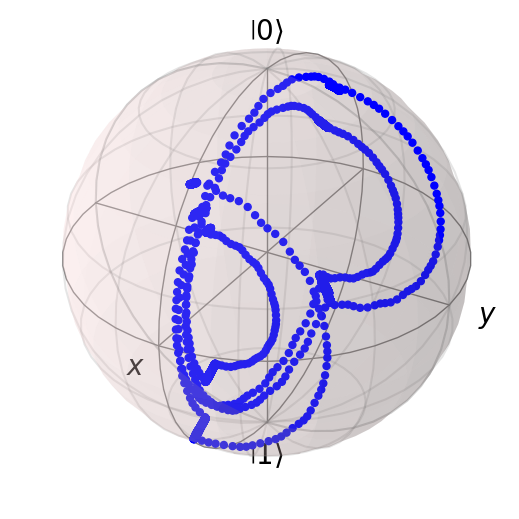

In [144]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [145]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=16)

In [146]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005096349078915313


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

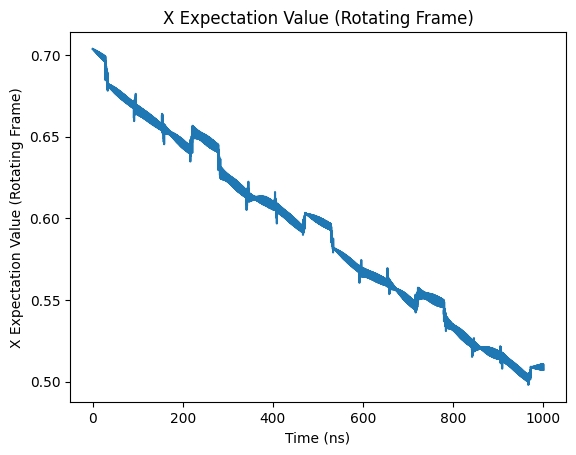

In [147]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

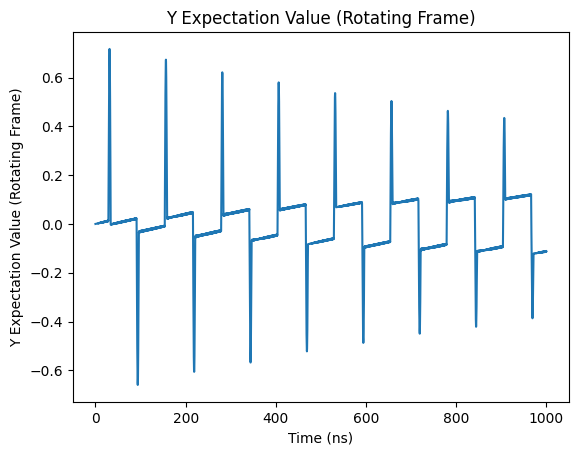

In [148]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

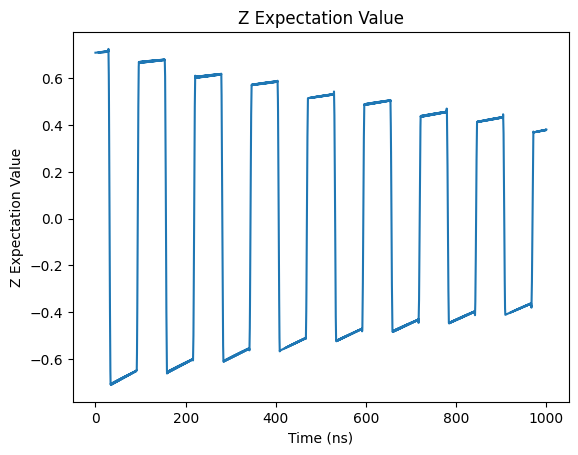

In [149]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

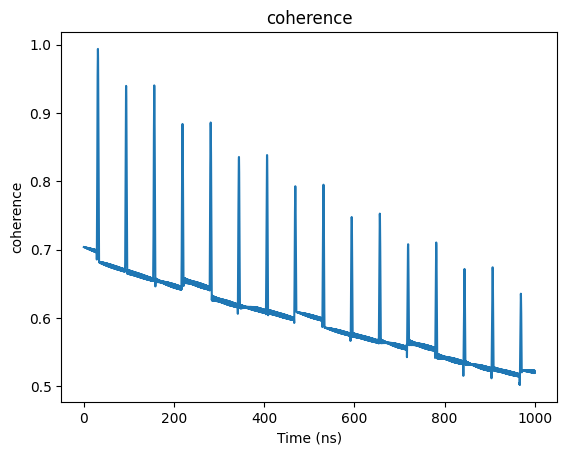

In [150]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

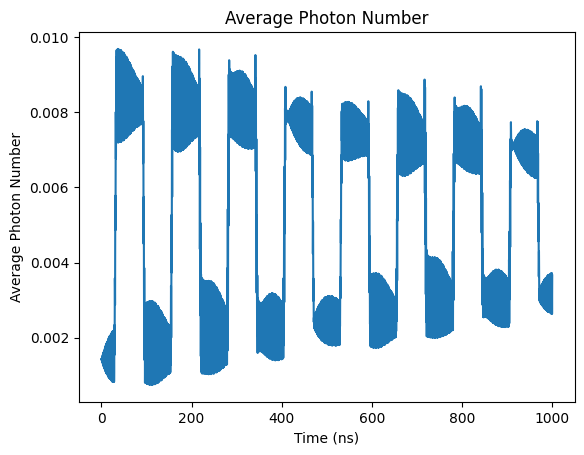

In [151]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

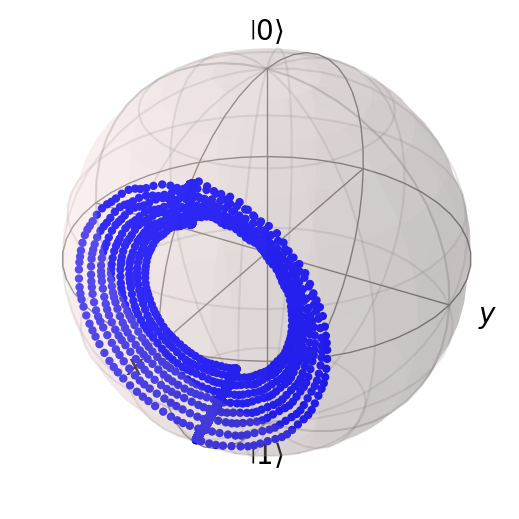

In [152]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [153]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY16

In [154]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY16_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005040895586399495


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

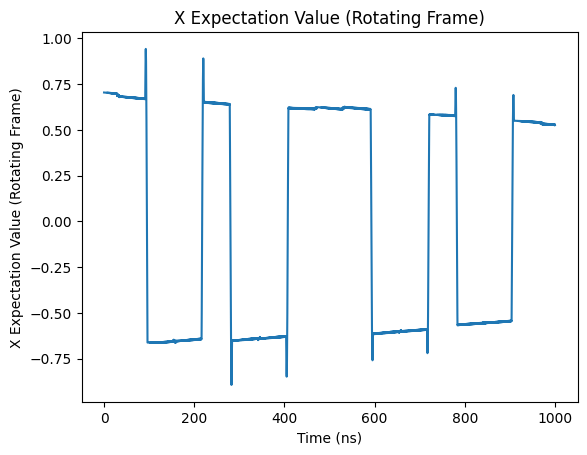

In [155]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

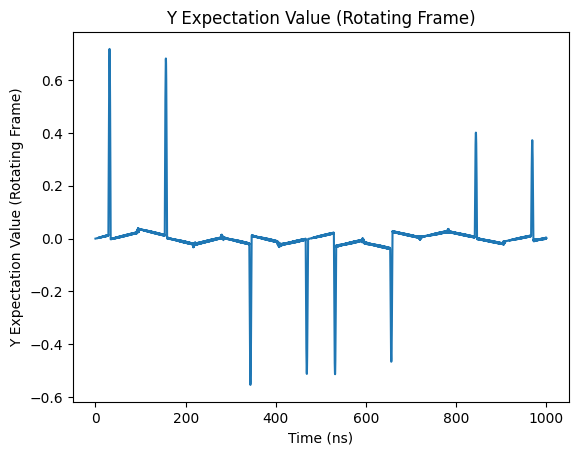

In [156]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

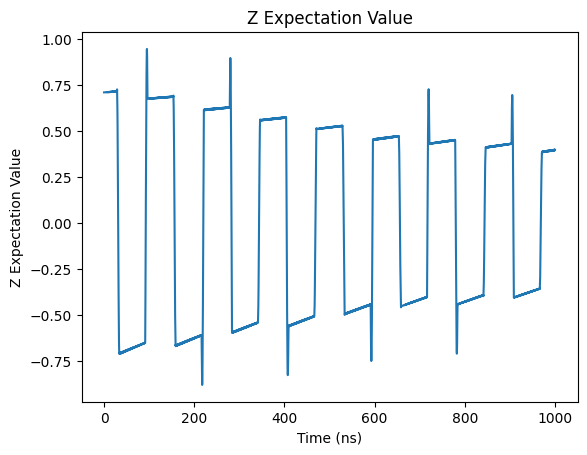

In [157]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

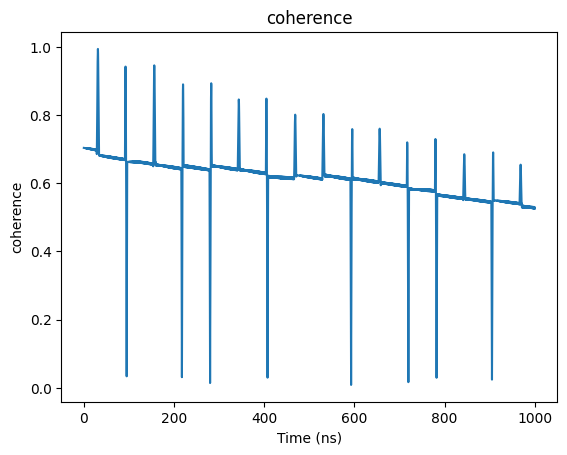

In [158]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

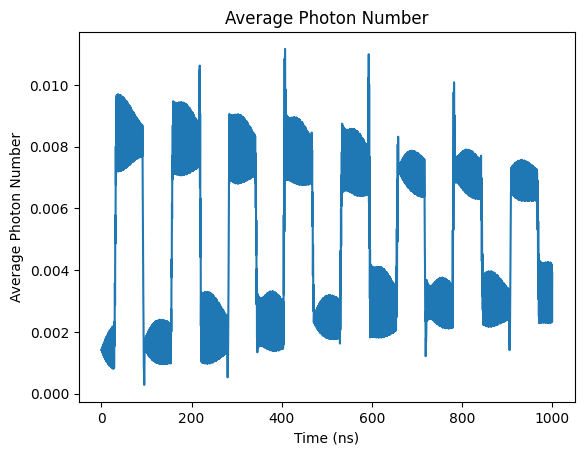

In [159]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

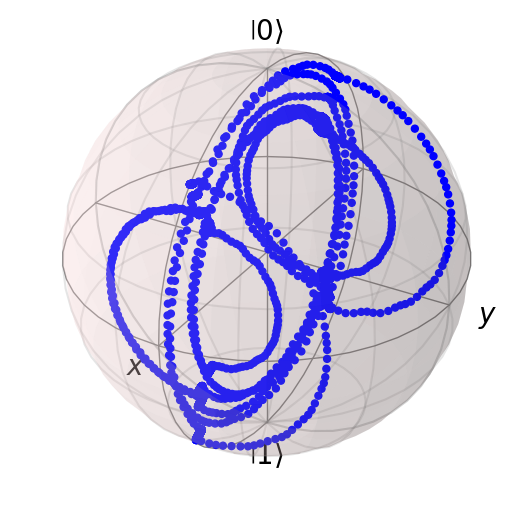

In [160]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [161]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## Print Coherence & Z

In [162]:
x_list

[0.41622835220398047,
 0.5381692795052129,
 0.5036018801154285,
 0.5010873175430037,
 0.5161994544193133,
 0.5258415742415604,
 0.5088510154056479,
 0.527833915343802]

In [163]:
y_list

[0.2994448979224024,
 -0.019048771688766942,
 -0.015428794098748111,
 -0.003417615213610509,
 -0.051022708292838795,
 -0.00041605412232983334,
 -0.11251362643749244,
 0.0013677962616272868]

In [164]:
z_list

[0.8423655740062944,
 0.3955971976600788,
 0.3907474826412351,
 0.41539643335904464,
 0.3889706754591499,
 0.3923089828811891,
 0.37983469324759833,
 0.3969134192566135]

# Dynamical Decoupling Simulation

$ \omega_{qd} = \omega_q^b + \chi $

Evolution time 1000ns

Initial state $ \cos(\frac{1\pi}{8}) |0\rangle + e^{j\frac{1\pi}{2}} \sin(\frac{1\pi}{8}) |1\rangle $

In [165]:
N = 5

omega_r = 2 * np.pi * 7.0     # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0     # qubit frequency in units of GHz

g = 2 * np.pi * 0.1           # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01      # resonator linewidth in units of GHz

detune = omega_q-omega_r
chi = g*g/(detune)

omega_rd = omega_r            # qubit frequency in units of GHz
omega_qd = omega_q + chi      # qubit frequency in units of GHz

sx = sigmax()
sy = sigmay()
sz = sigmaz()
sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

tlist = np.linspace(0, 1000, 10000)
T_end_q = 1000

cos = np.sqrt(0.5 + 0.5*5/np.sqrt(26))
sin = np.sqrt(0.5 - 0.5*5/np.sqrt(26))


psi_20 = tensor(basis(2,0), basis(N,0))
psi_21 = cos*tensor(basis(2,1), basis(N,0)) - sin*tensor(basis(2,0), basis(N,1))
psi_2s = np.cos(1*np.pi/8) * psi_20 + np.exp(1j*np.pi*1/2) * np.sin(1*np.pi/8) * psi_21


H0 = -0.5*omega_q*sz_composite + omega_r*number_composite + g*(tensor(sm, a.dag()) + tensor(sp, a))
H1 = tensor(qeye(2), a + a.dag())
H2 = sx_composite

A = 0.0002 * 2 * np.pi
B = 0.1 * 2 * np.pi

x_list = []
y_list = []
z_list = []

## Ramsey

In [166]:
# Simulation

N_seq = 0

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))
print([x_rot[0], y_rot[0], result.expect[2][0]])

0.0011455031823363751
[4.3087086549499445e-17, -0.7036655234717203, 0.7099506753885818]


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

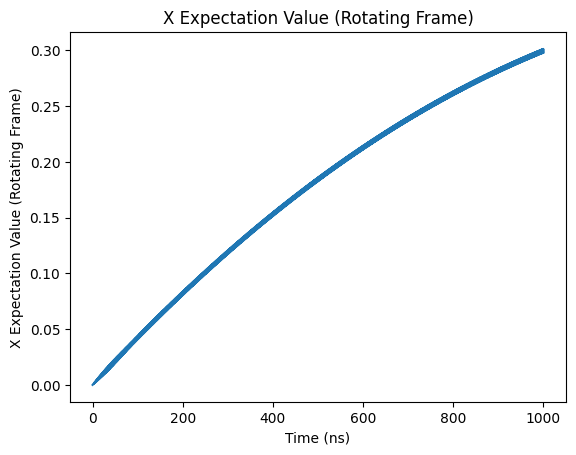

In [167]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

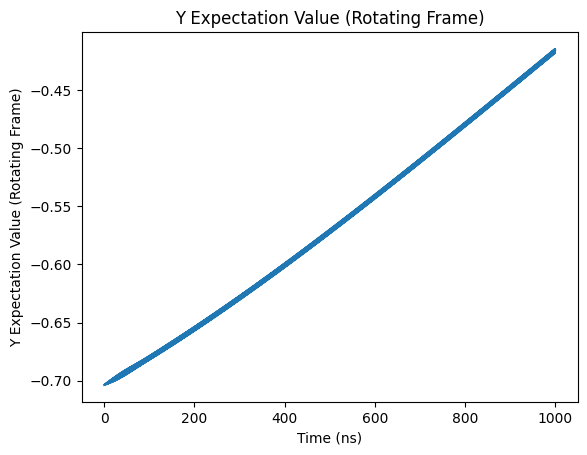

In [168]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

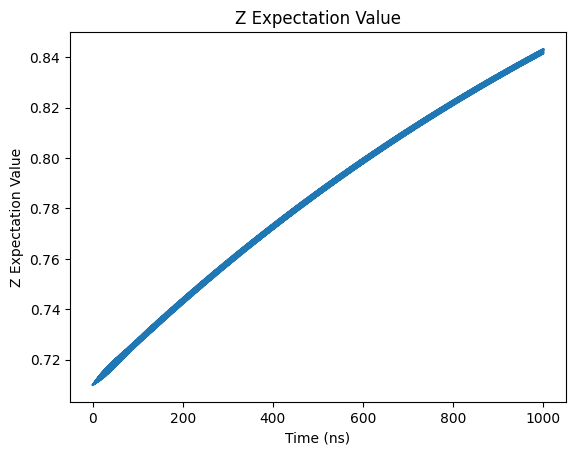

In [169]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

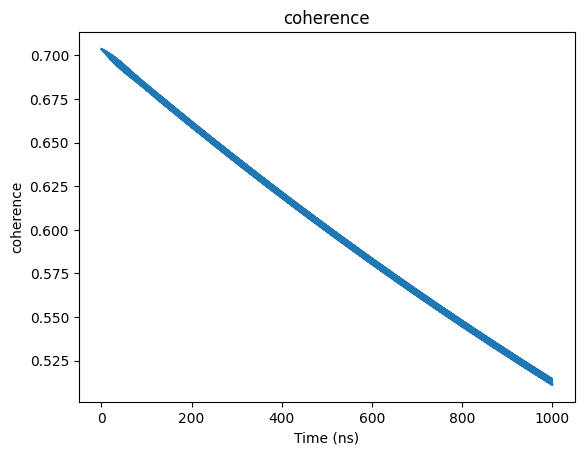

In [170]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

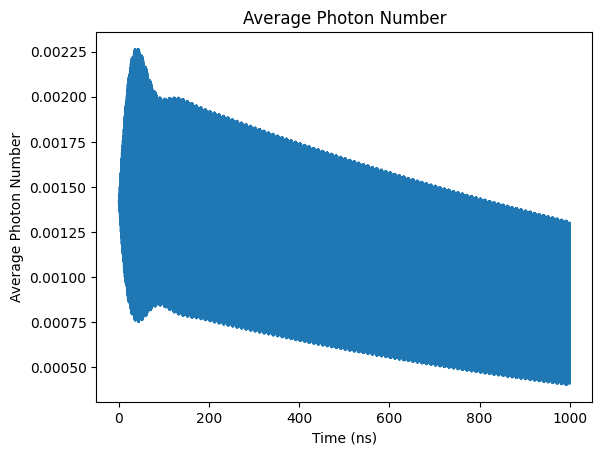

In [171]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

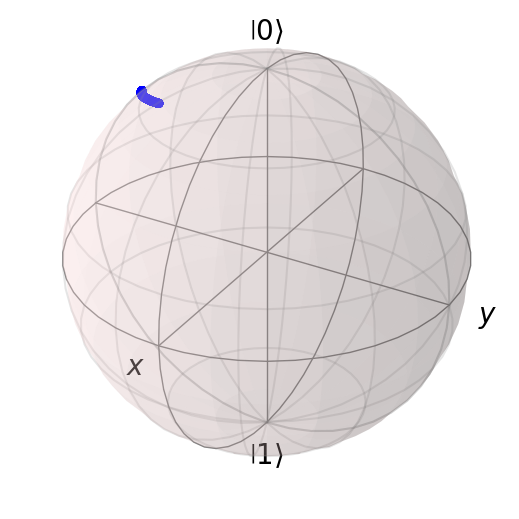

In [172]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [173]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=2)

In [174]:
# Simulation

N_seq = 2

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004869730605792951


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

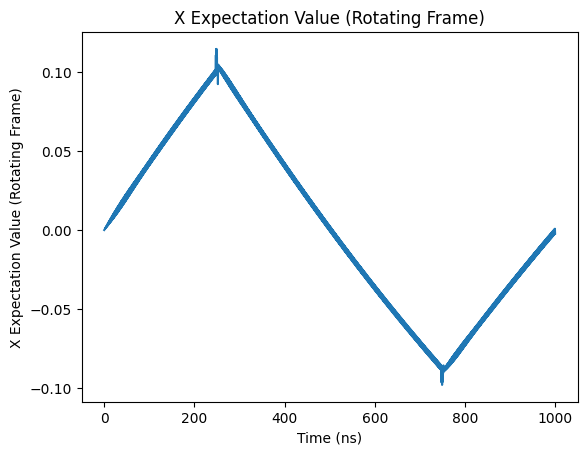

In [175]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

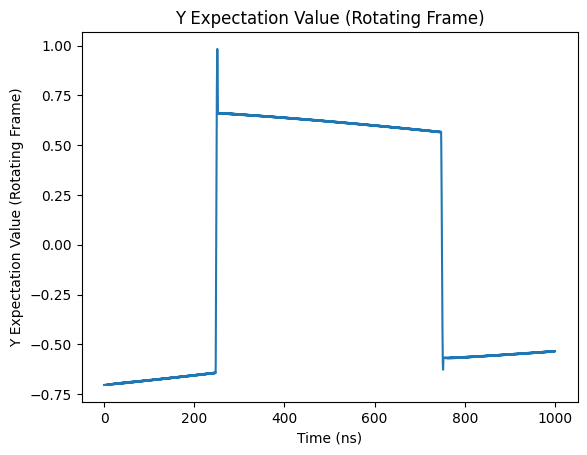

In [176]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

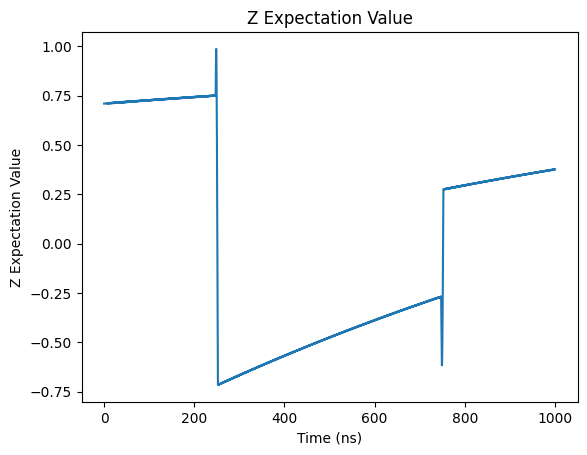

In [177]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

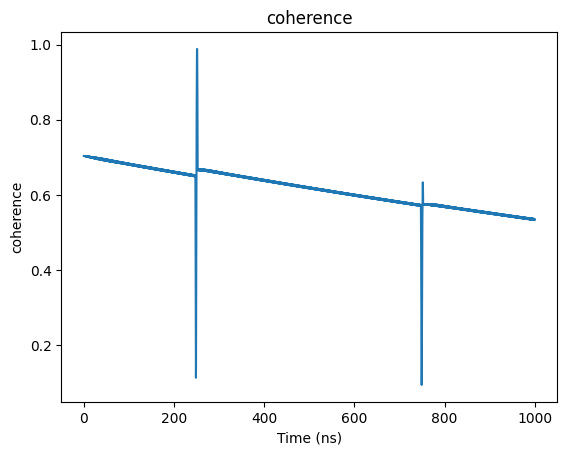

In [178]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

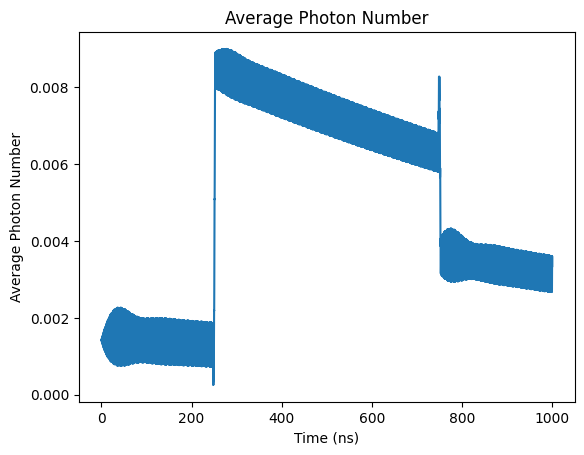

In [179]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

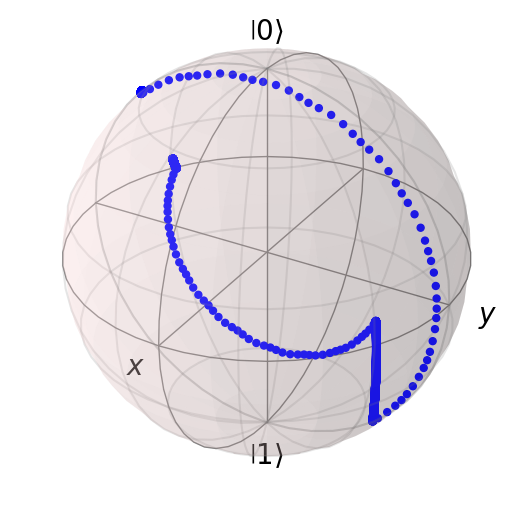

In [180]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [181]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=4)

In [182]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004948098838730574


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

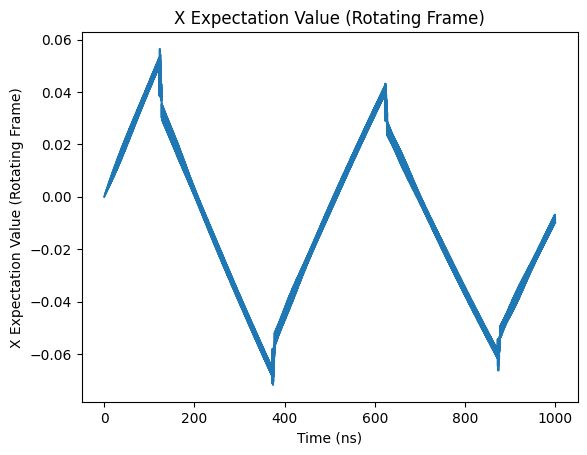

In [183]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

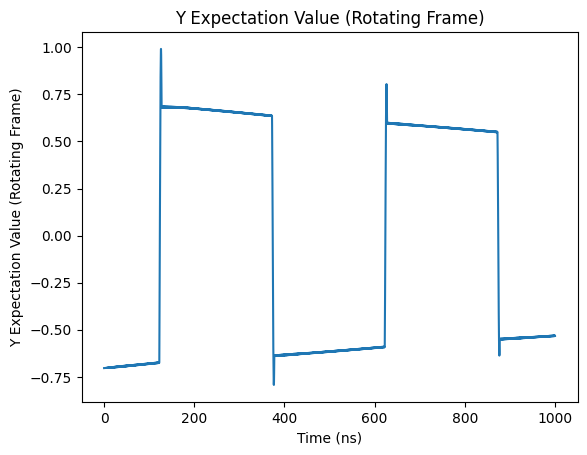

In [184]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

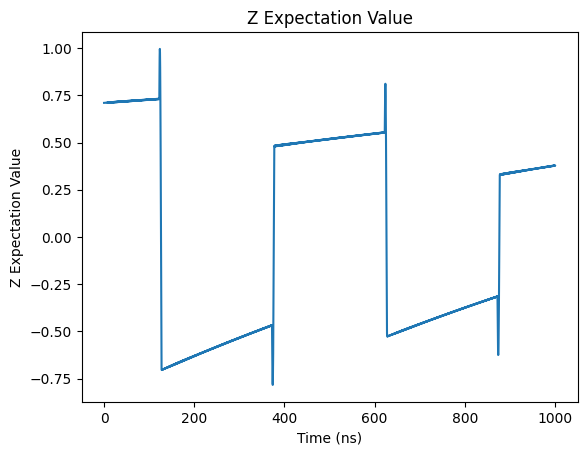

In [185]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

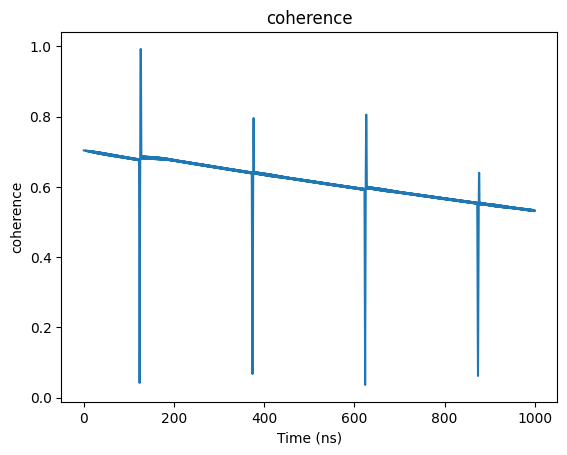

In [186]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

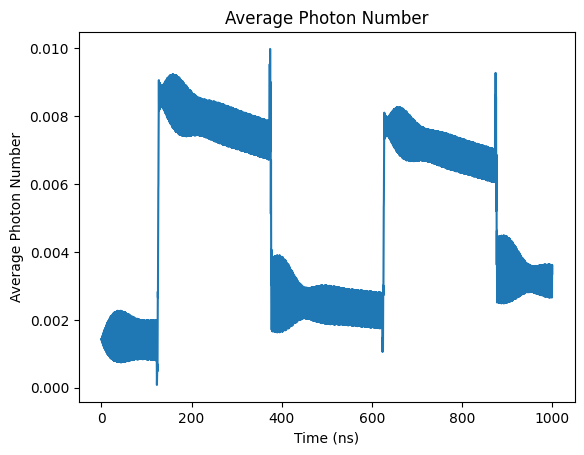

In [187]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

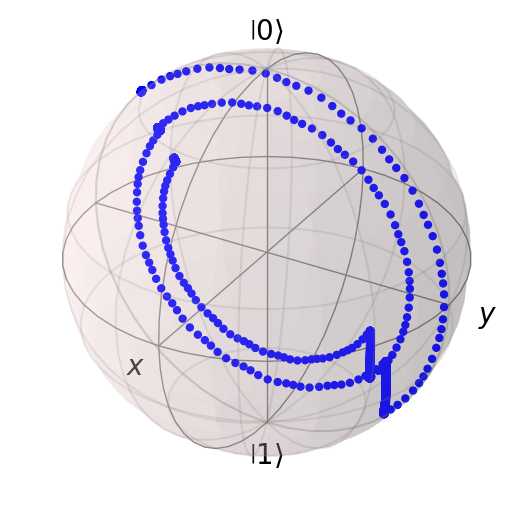

In [188]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [189]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY4

In [190]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY4_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004913910798499847


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

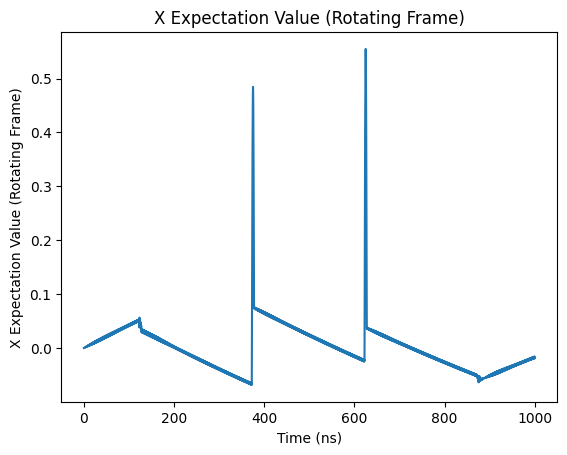

In [191]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

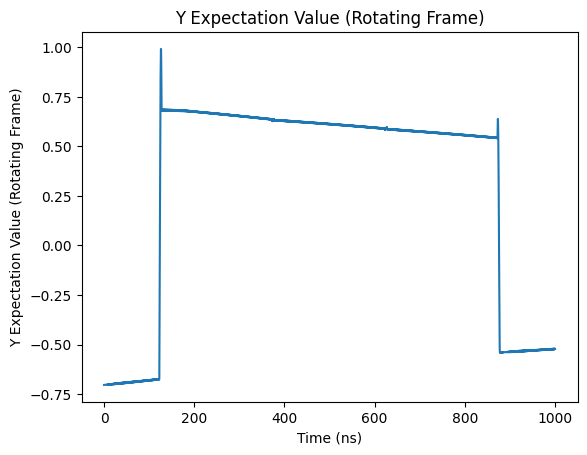

In [192]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

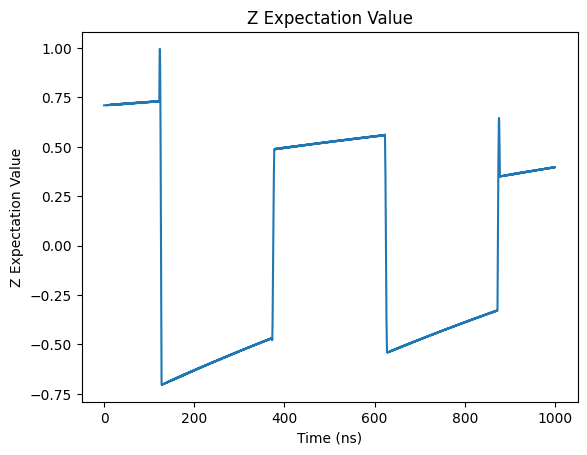

In [193]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

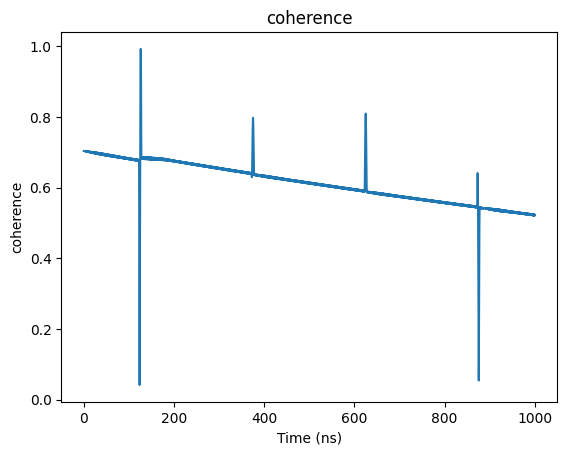

In [194]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

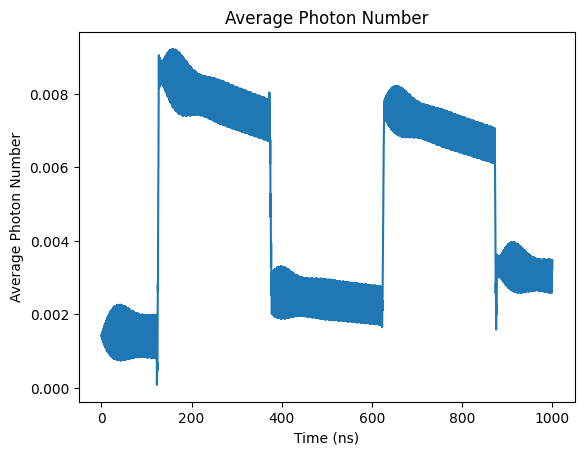

In [195]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

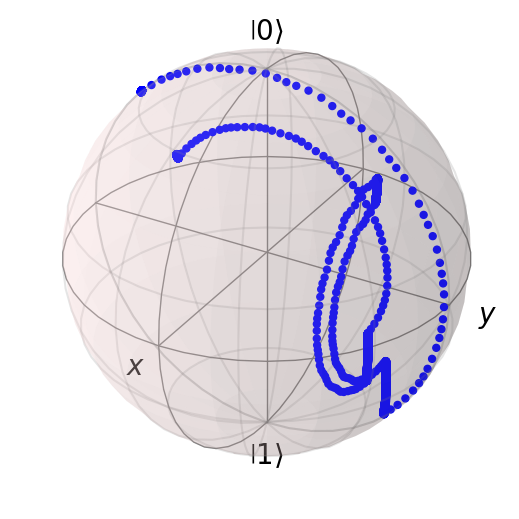

In [196]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [197]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=8)

In [198]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004981519959596215


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

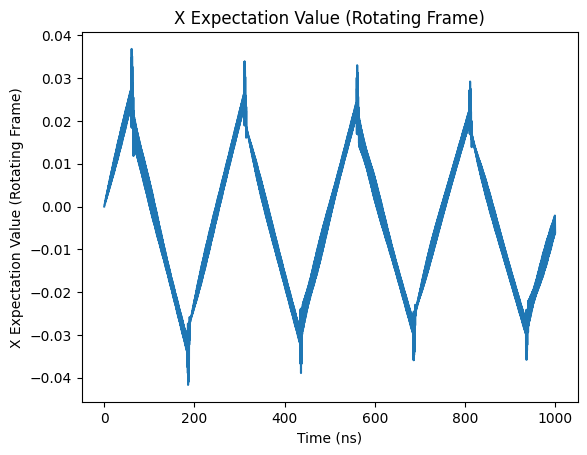

In [199]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

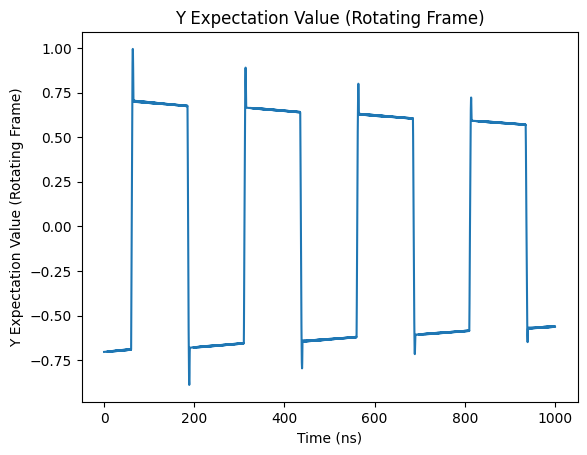

In [200]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

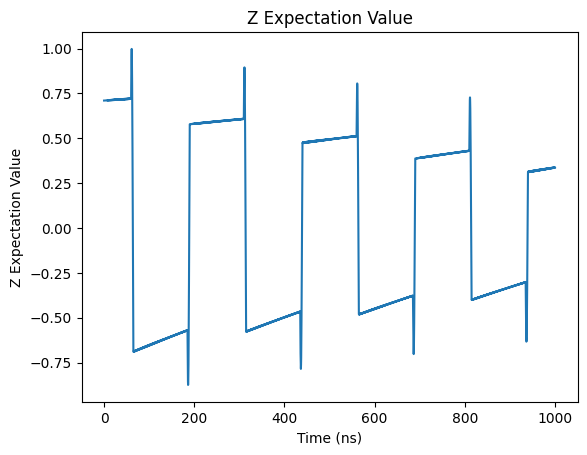

In [201]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

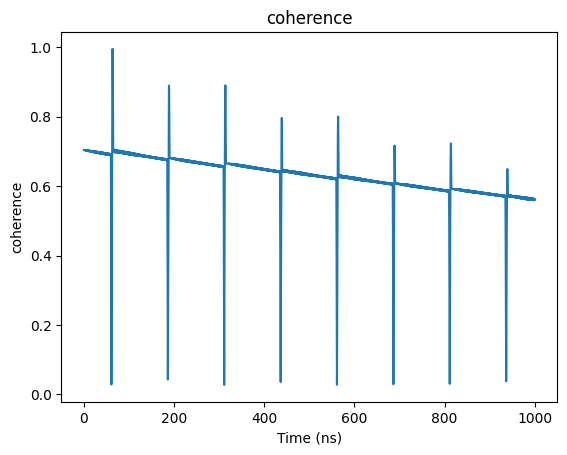

In [202]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

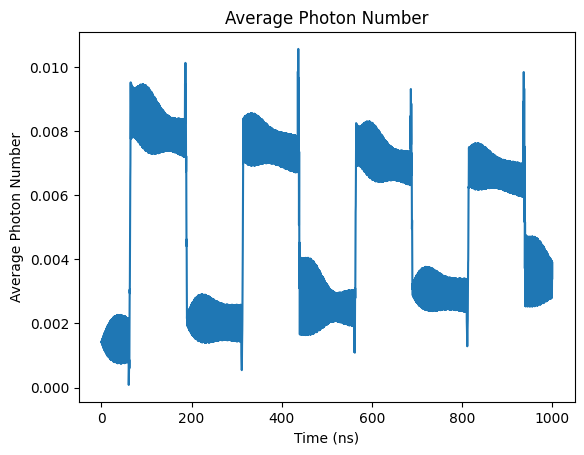

In [203]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

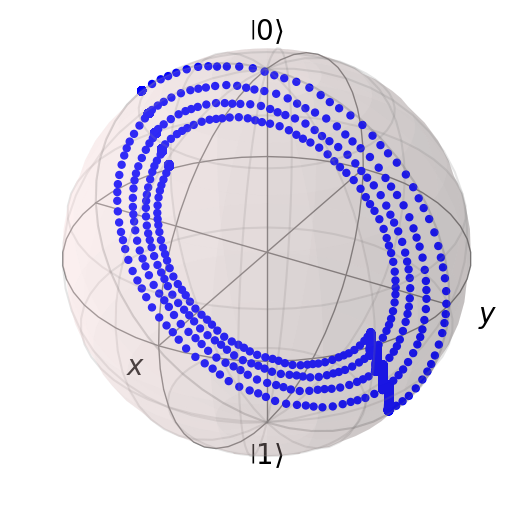

In [204]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [205]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY8

In [206]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY8_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004983494485117339


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

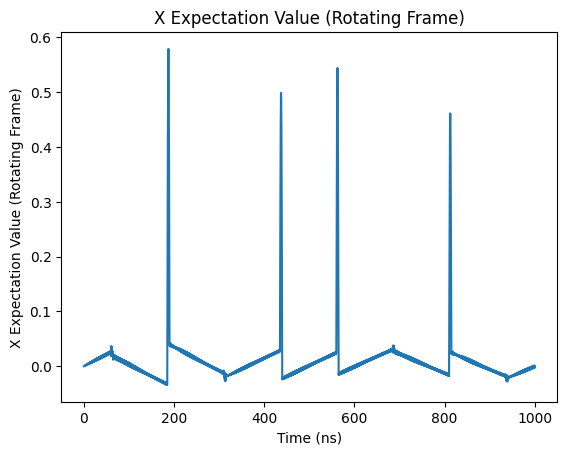

In [207]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

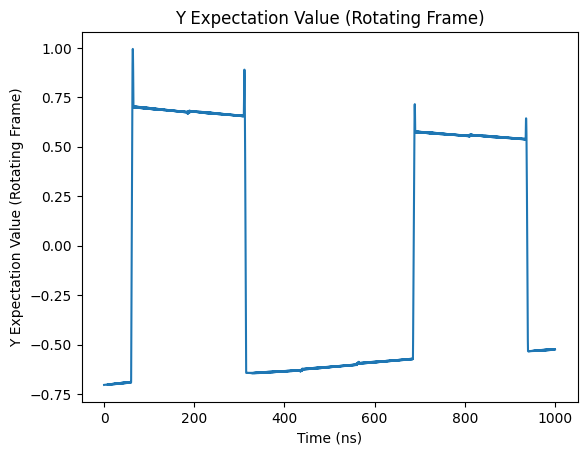

In [208]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

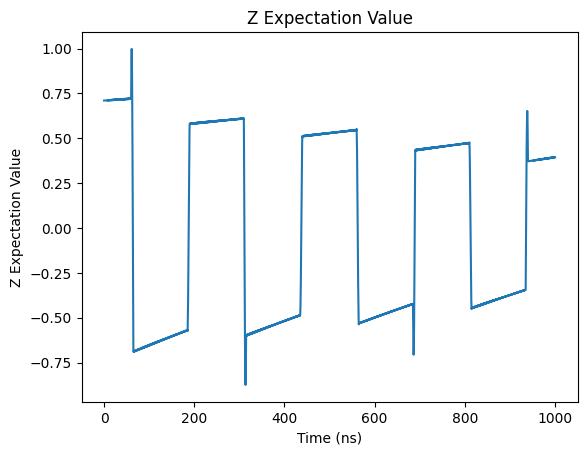

In [209]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

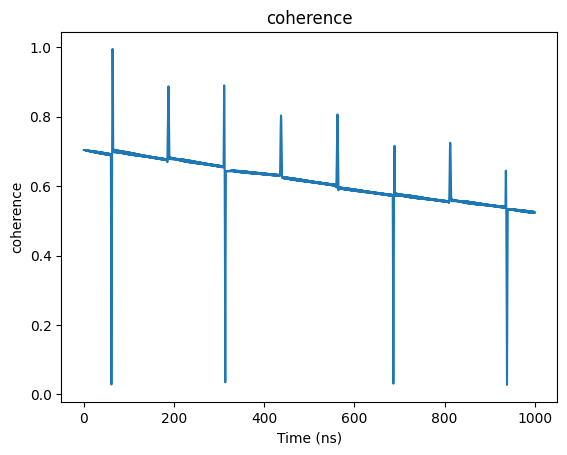

In [210]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

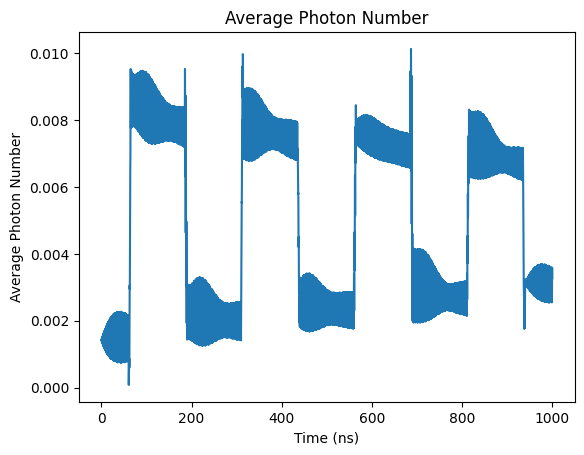

In [211]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

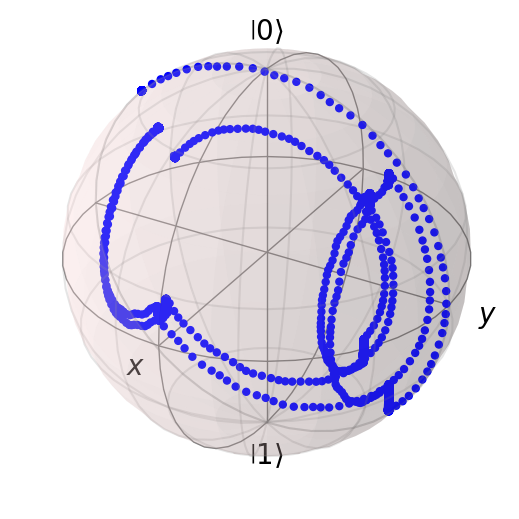

In [212]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [213]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=16)

In [214]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005048905679584648


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

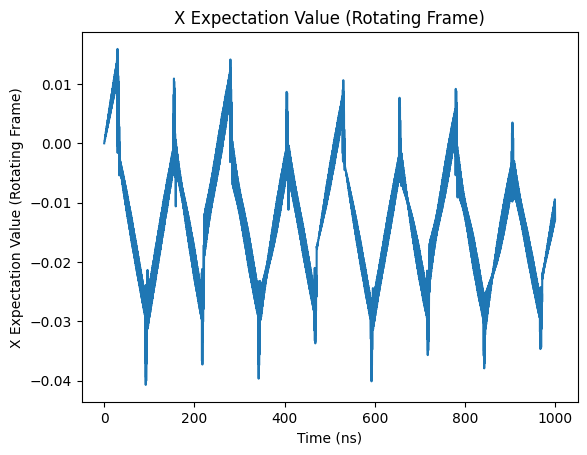

In [215]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

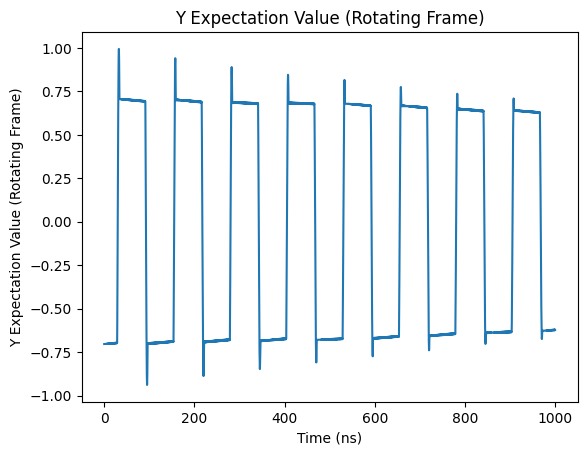

In [216]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

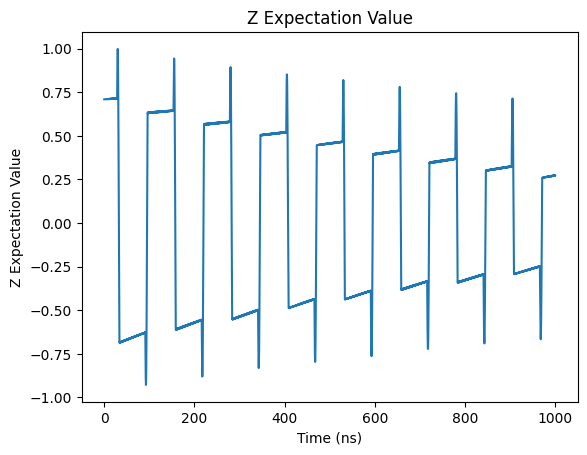

In [217]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

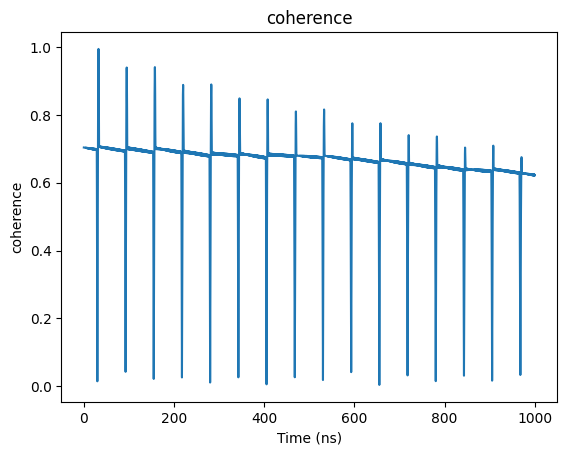

In [218]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

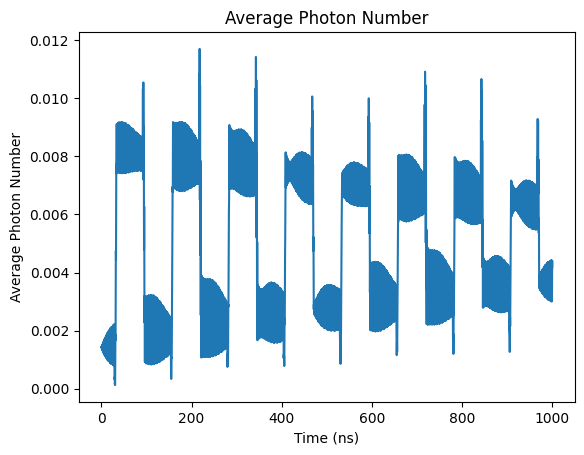

In [219]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

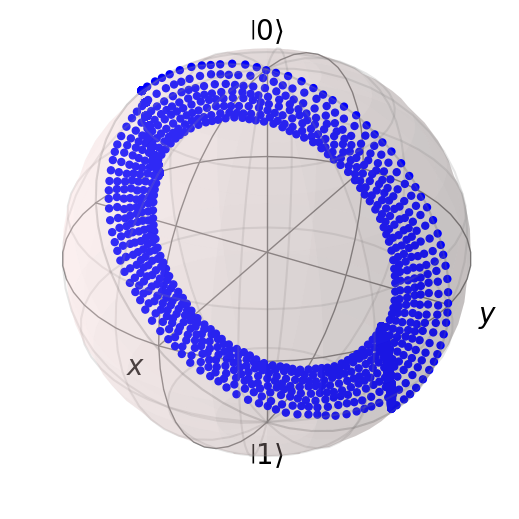

In [220]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [221]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY16

In [222]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY16_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005043310398614264


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

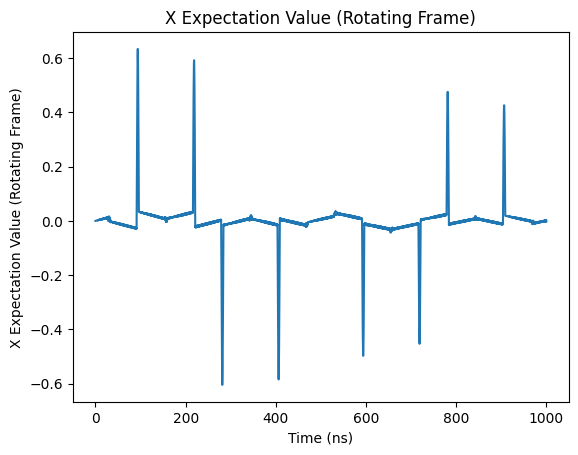

In [223]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

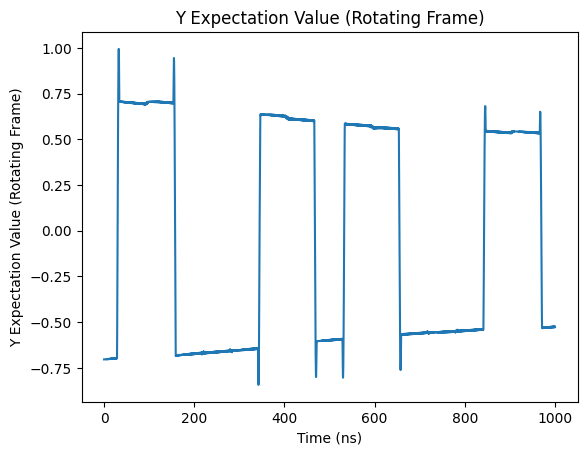

In [224]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

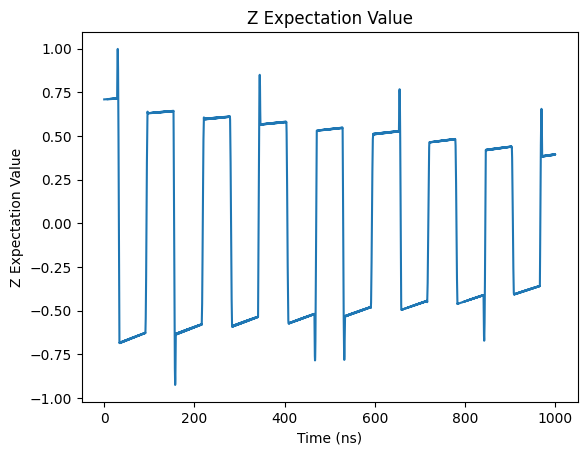

In [225]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

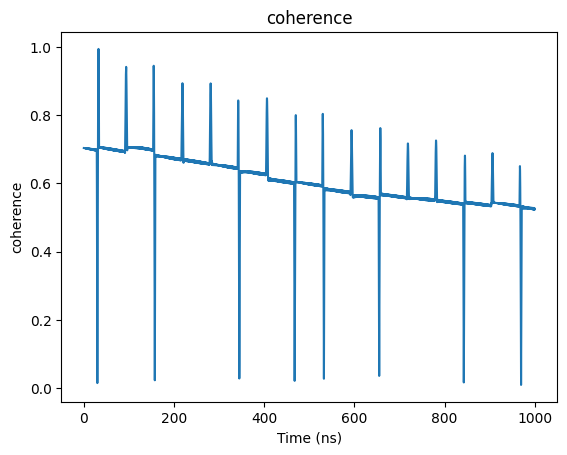

In [226]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

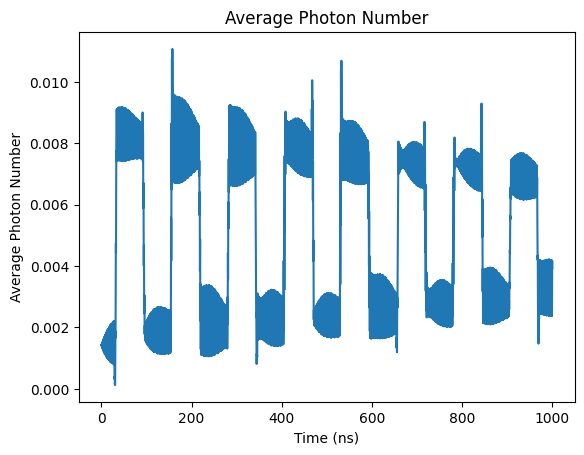

In [227]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

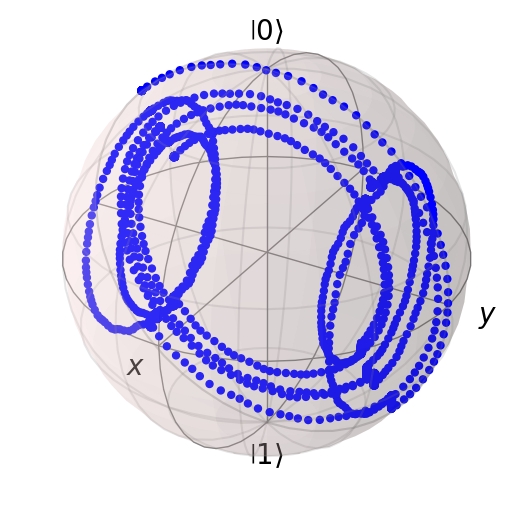

In [228]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [229]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## Print Coherence & Z

In [230]:
x_list

[0.2995407624772015,
 -0.0007329467736993609,
 -0.008420916040674173,
 -0.017304359078490275,
 -0.00418620679624064,
 -0.0005558287610155811,
 -0.011204666727858591,
 0.0001334438308618527]

In [231]:
y_list

[-0.4163737024628146,
 -0.5346960395516389,
 -0.5321732070996499,
 -0.5222370584805917,
 -0.5611730640517124,
 -0.5239546906289092,
 -0.6223103765656439,
 -0.5254324143127322]

In [232]:
z_list

[0.8423725393921557,
 0.3765953524097168,
 0.37790213677616935,
 0.39693231424128694,
 0.33670877575753355,
 0.3938521730107255,
 0.27294098348008305,
 0.39415560433805436]

# Dynamical Decoupling Simulation

$ \omega_{qd} = \omega_q^b + \chi $

Evolution time 1000ns

Initial state $ \cos(\frac{1\pi}{8}) |0\rangle + e^{j\frac{2\pi}{2}} \sin(\frac{1\pi}{8}) |1\rangle $

In [233]:
N = 5

omega_r = 2 * np.pi * 7.0     # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0     # qubit frequency in units of GHz

g = 2 * np.pi * 0.1           # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01      # resonator linewidth in units of GHz

detune = omega_q-omega_r
chi = g*g/(detune)

omega_rd = omega_r            # qubit frequency in units of GHz
omega_qd = omega_q + chi      # qubit frequency in units of GHz

sx = sigmax()
sy = sigmay()
sz = sigmaz()
sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

tlist = np.linspace(0, 1000, 10000)
T_end_q = 1000

cos = np.sqrt(0.5 + 0.5*5/np.sqrt(26))
sin = np.sqrt(0.5 - 0.5*5/np.sqrt(26))


psi_20 = tensor(basis(2,0), basis(N,0))
psi_21 = cos*tensor(basis(2,1), basis(N,0)) - sin*tensor(basis(2,0), basis(N,1))
psi_2s = np.cos(1*np.pi/8) * psi_20 + np.exp(1j*np.pi*2/2) * np.sin(1*np.pi/8) * psi_21


H0 = -0.5*omega_q*sz_composite + omega_r*number_composite + g*(tensor(sm, a.dag()) + tensor(sp, a))
H1 = tensor(qeye(2), a + a.dag())
H2 = sx_composite

A = 0.0002 * 2 * np.pi
B = 0.1 * 2 * np.pi

x_list = []
y_list = []
z_list = []

## Ramsey

In [234]:
# Simulation

N_seq = 0

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))
print([x_rot[0], y_rot[0], result.expect[2][0]])

0.0011455211326950696
[-0.7036655234717203, -8.617417309899889e-17, 0.7099506753885818]


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

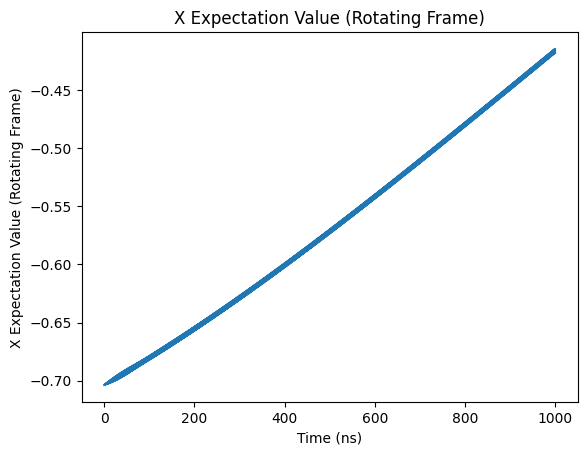

In [235]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

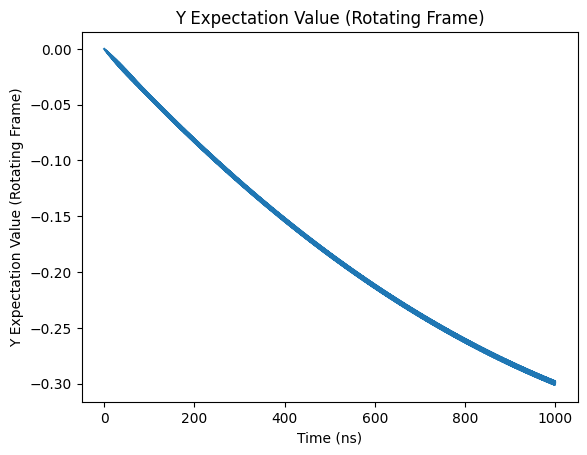

In [236]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

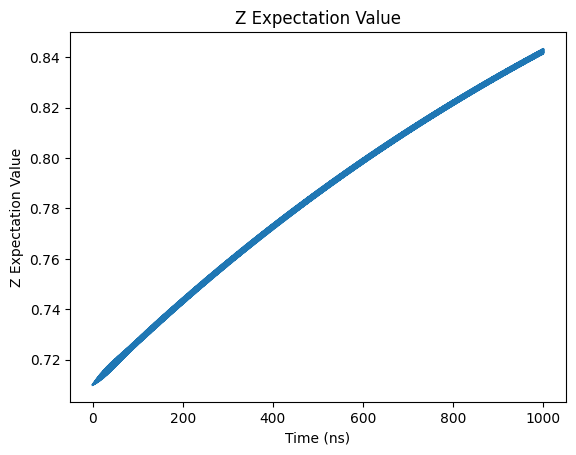

In [237]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

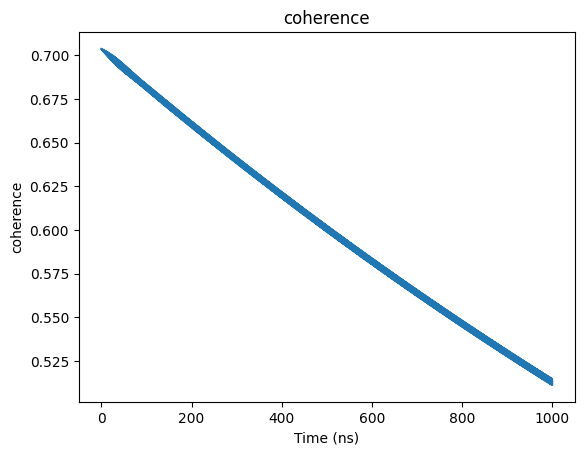

In [238]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

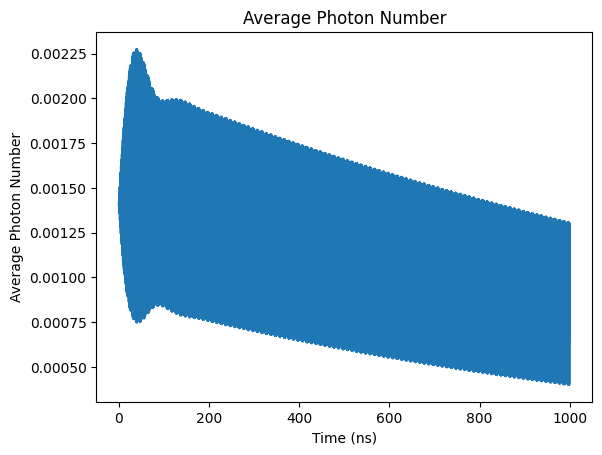

In [239]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

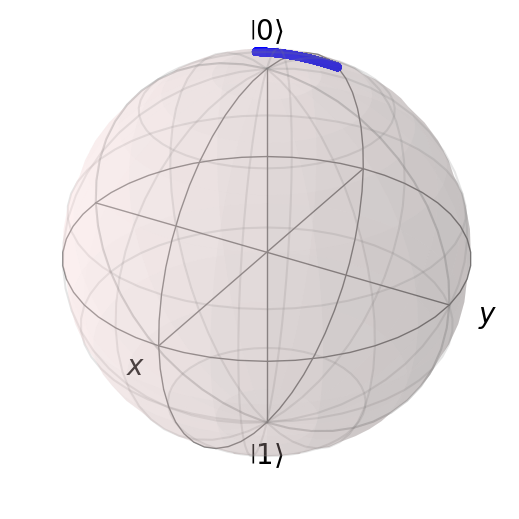

In [240]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [241]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=2)

In [242]:
# Simulation

N_seq = 2

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004872217933155181


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

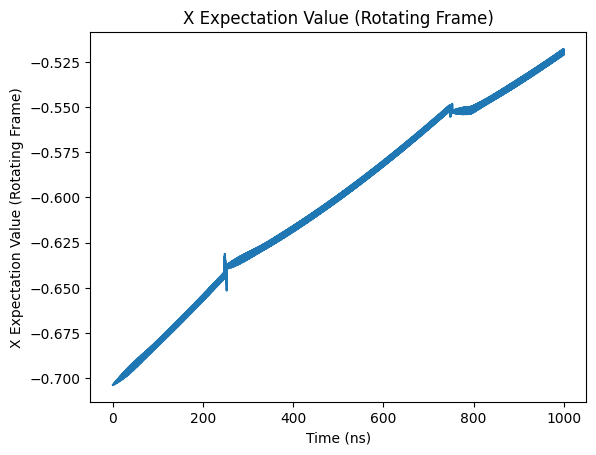

In [243]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

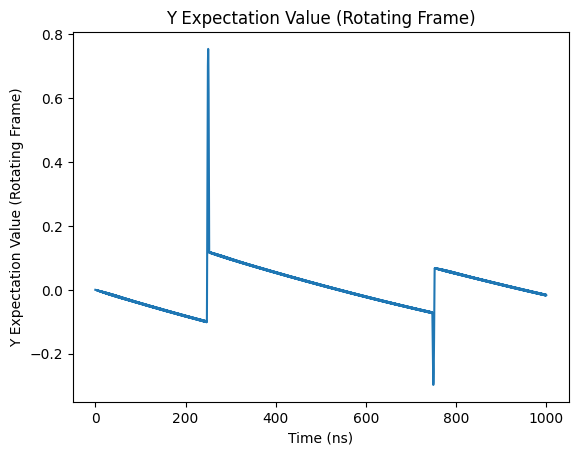

In [244]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

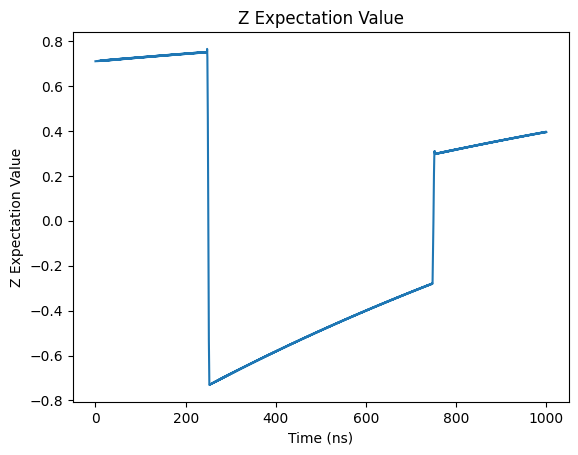

In [245]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

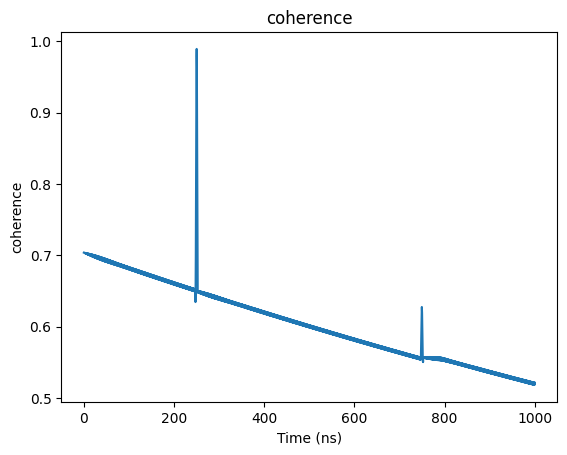

In [246]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

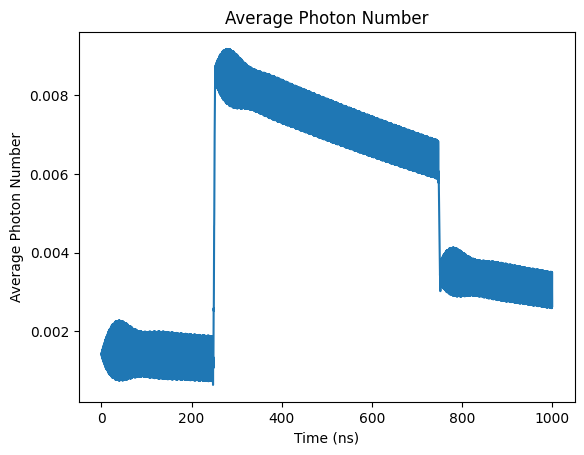

In [247]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

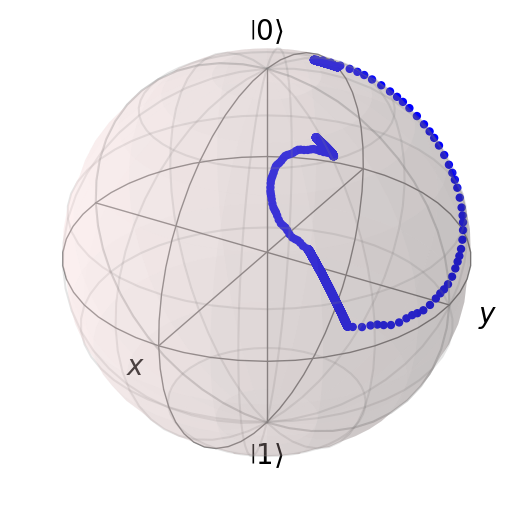

In [248]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [249]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=4)

In [250]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004901320015212379


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

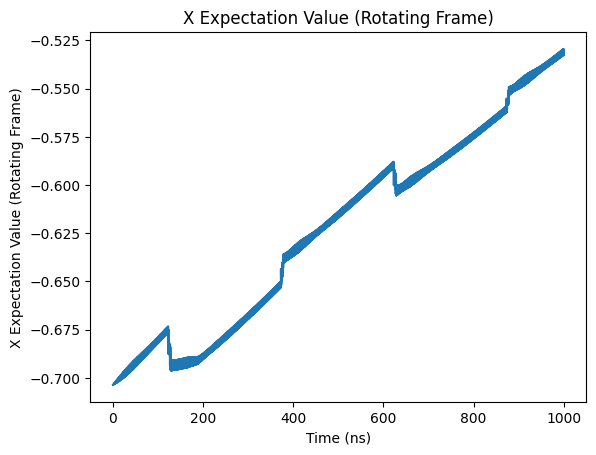

In [251]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

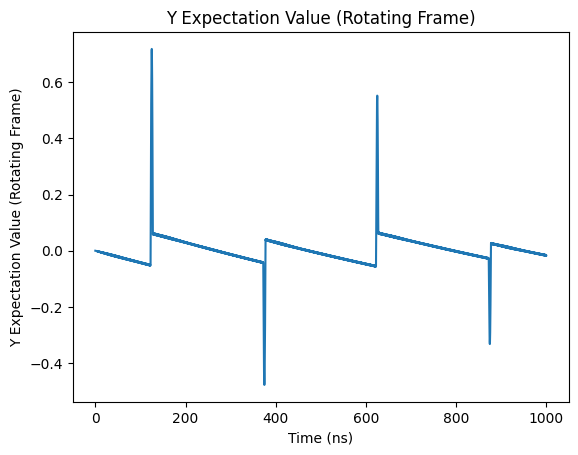

In [252]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

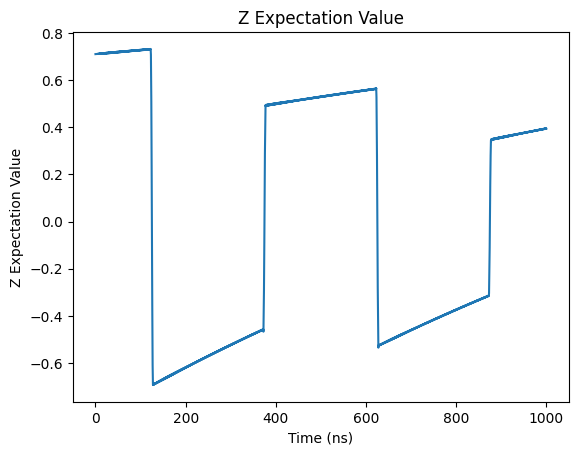

In [253]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

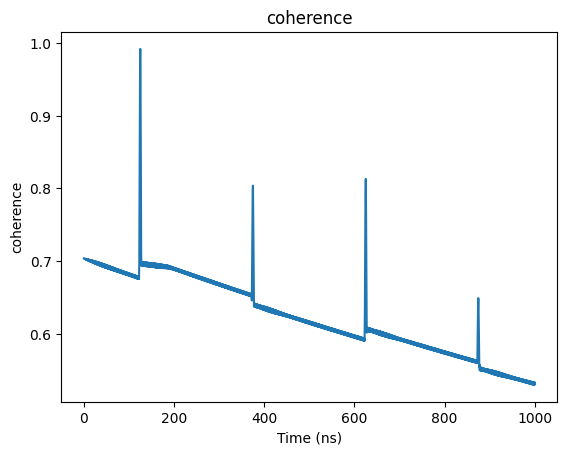

In [254]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

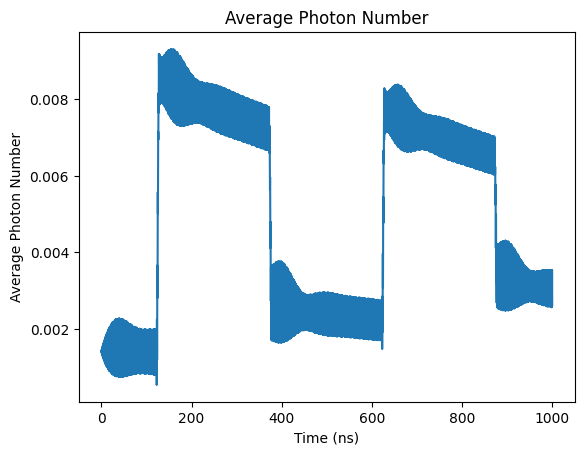

In [255]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

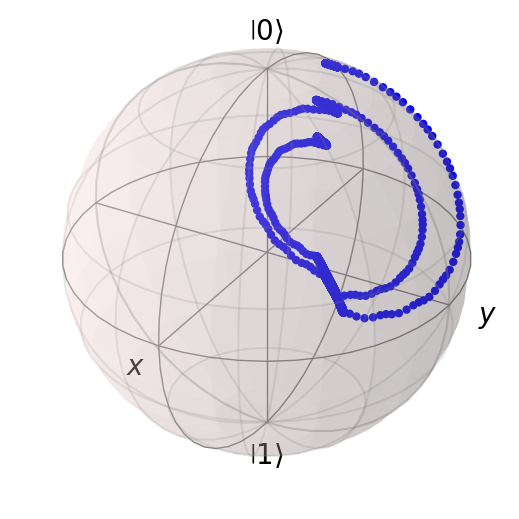

In [256]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [257]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY4

In [258]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY4_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004969814856305379


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

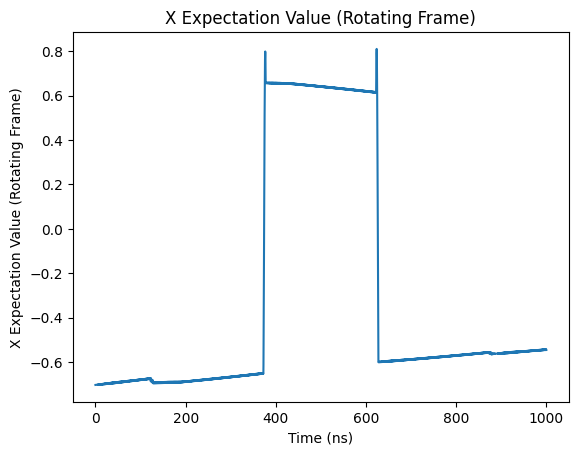

In [259]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

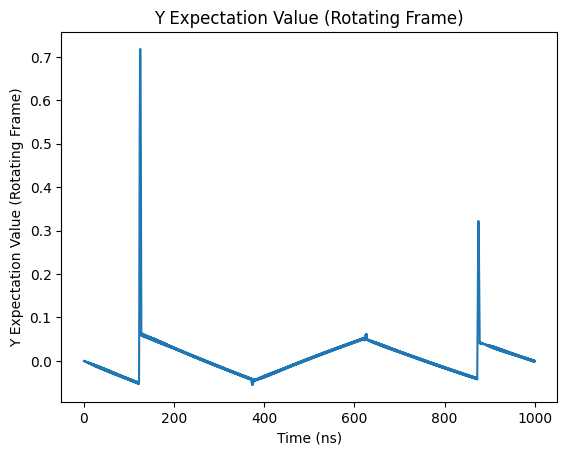

In [260]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

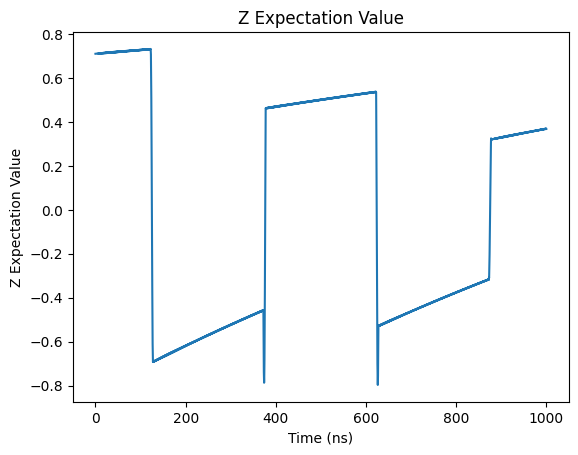

In [261]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

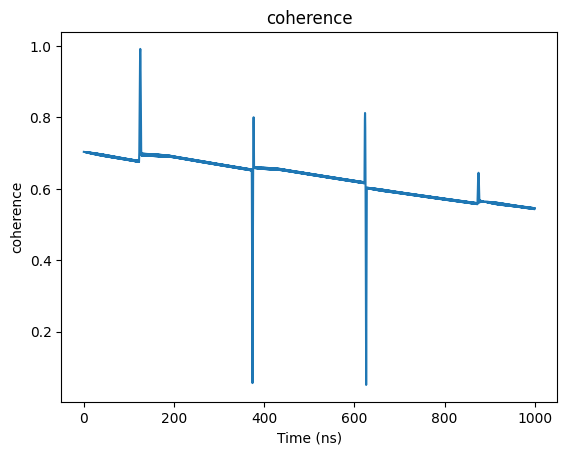

In [262]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

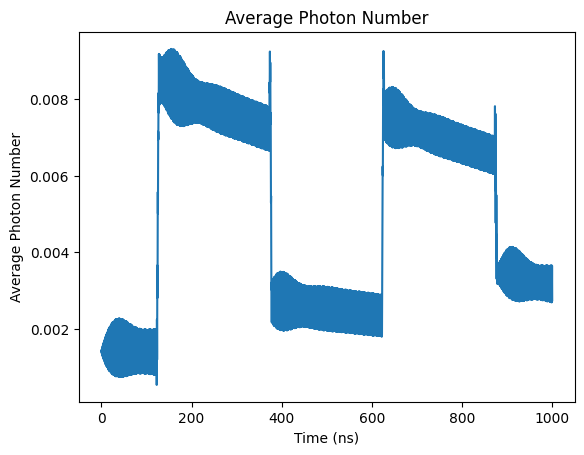

In [263]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

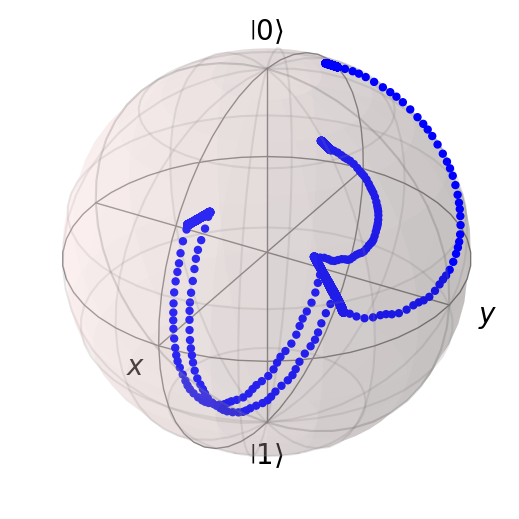

In [264]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [265]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=8)

In [266]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004951245205239717


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

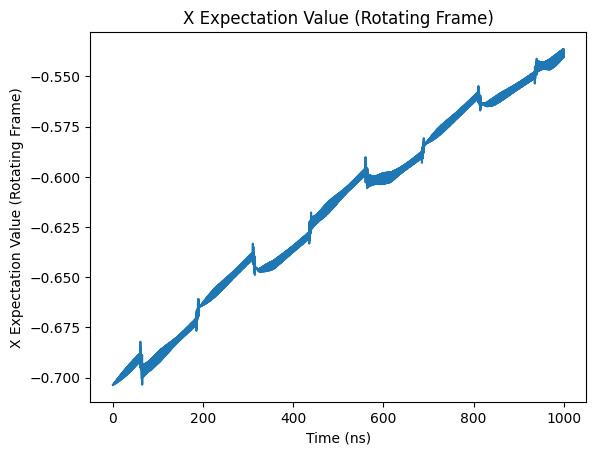

In [267]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

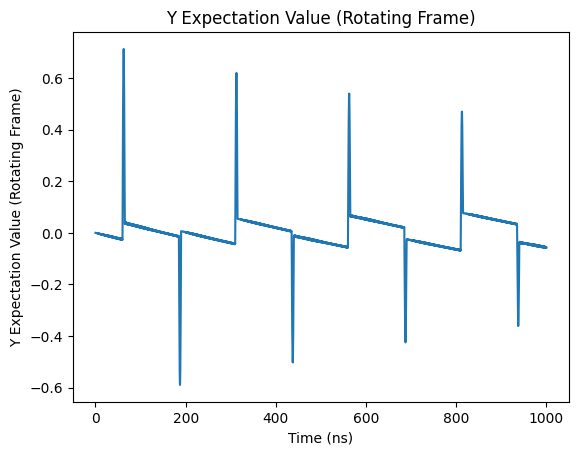

In [268]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

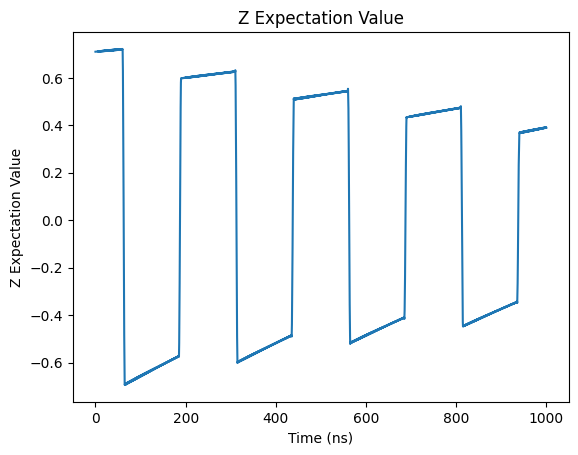

In [269]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

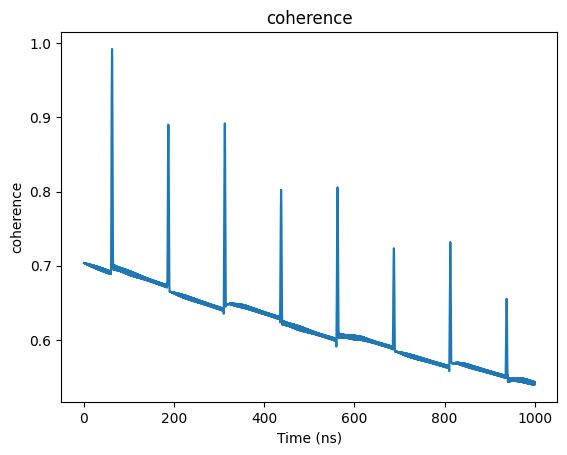

In [270]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

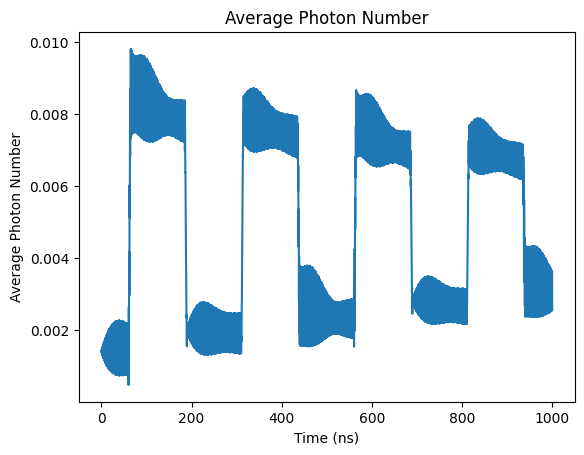

In [271]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

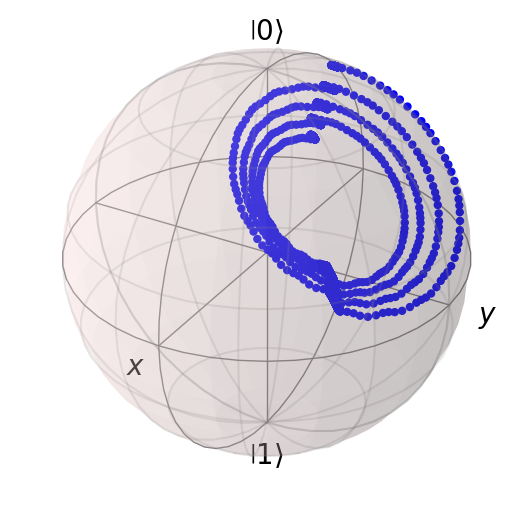

In [272]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [273]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY8

In [274]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY8_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004980778977425889


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

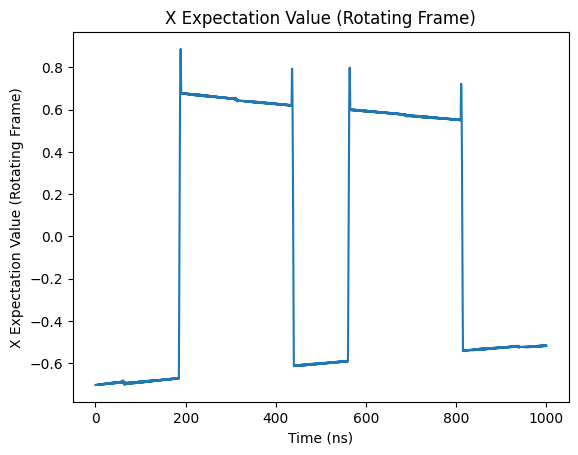

In [275]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

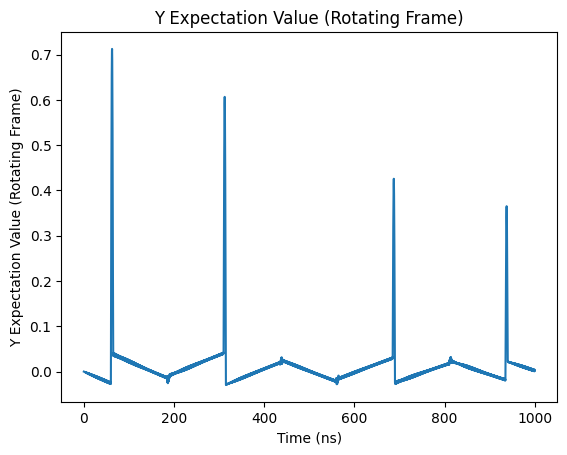

In [276]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

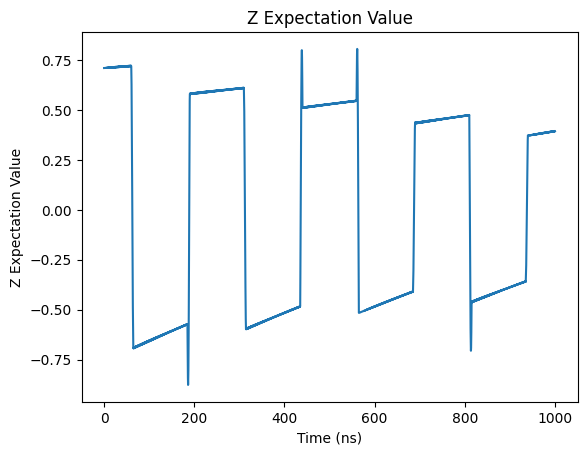

In [277]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

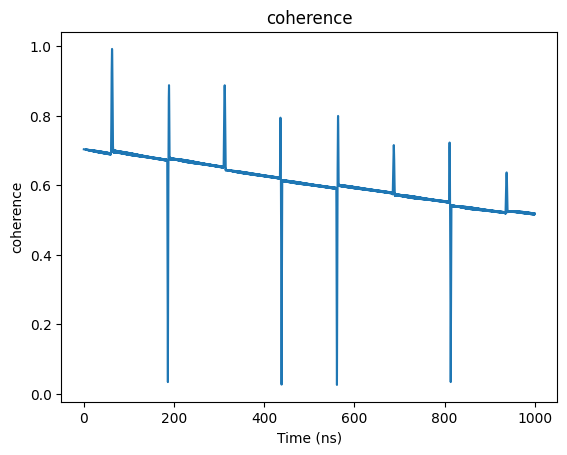

In [278]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

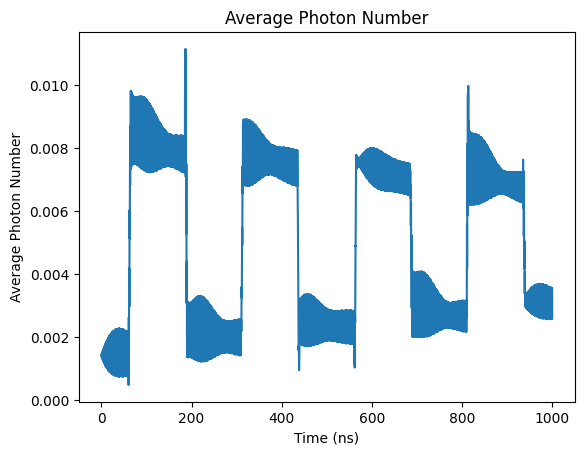

In [279]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

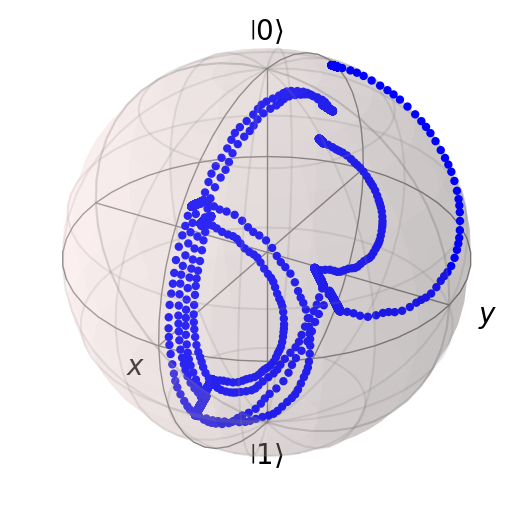

In [280]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [281]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=16)

In [282]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005004468704844719


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

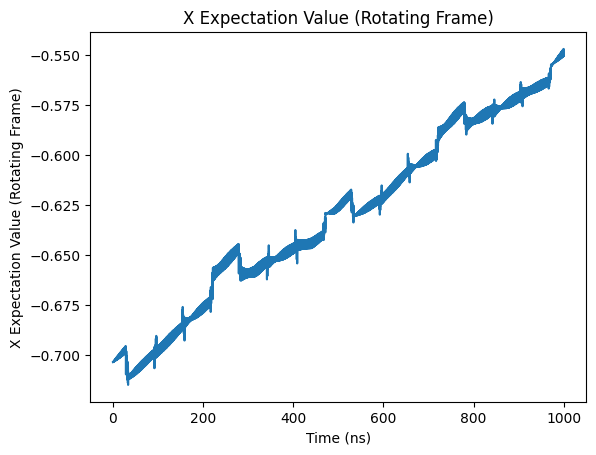

In [283]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

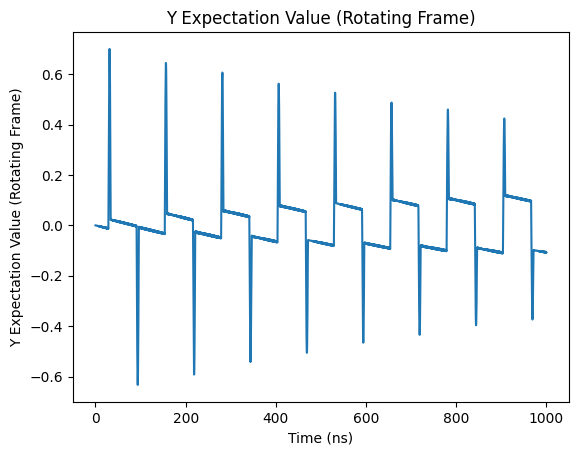

In [284]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

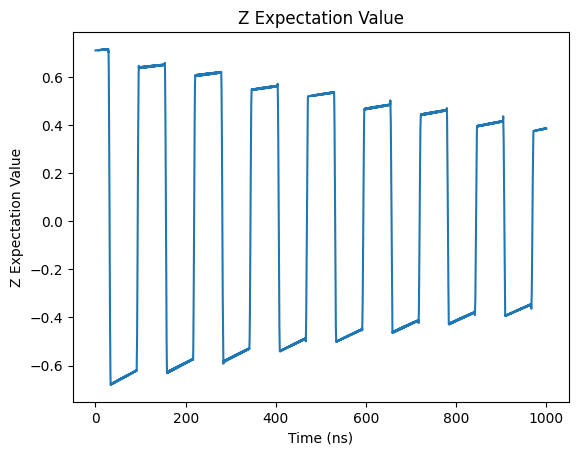

In [285]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

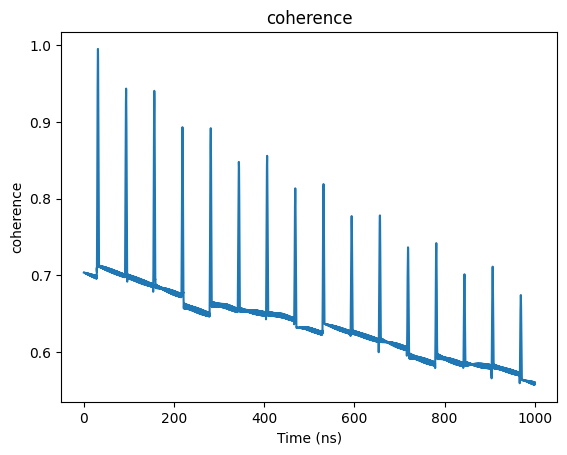

In [286]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

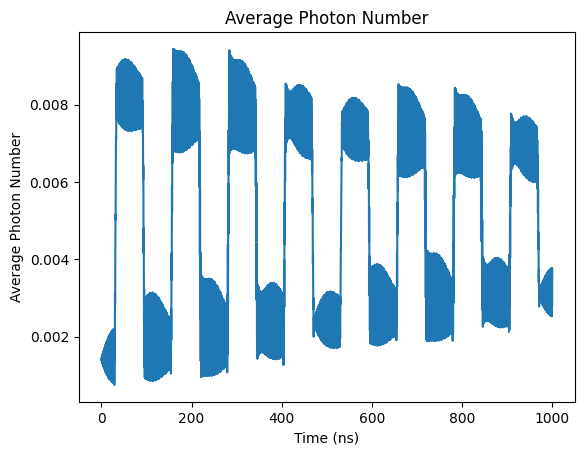

In [287]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

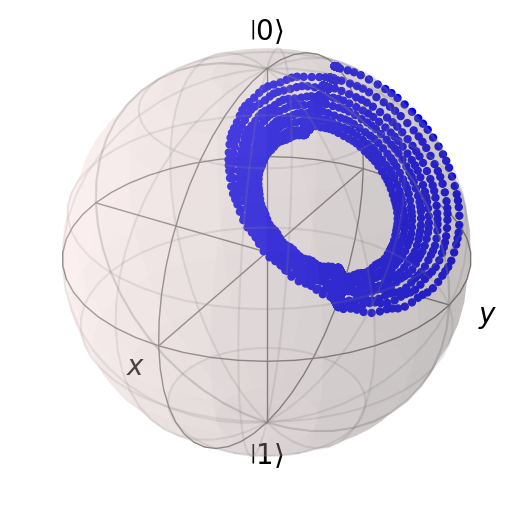

In [288]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [289]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY16

In [290]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY16_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.005044000726306057


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

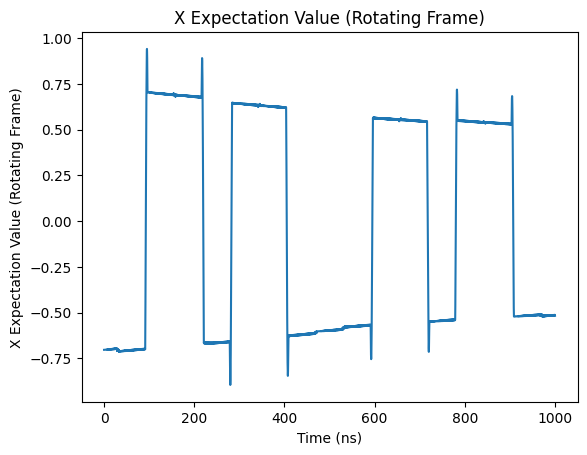

In [291]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

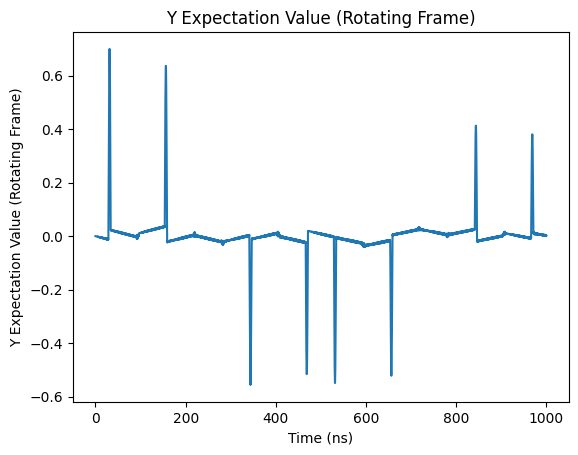

In [292]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

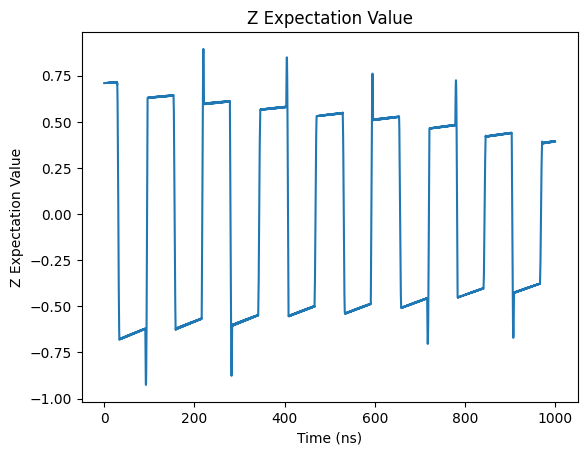

In [293]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

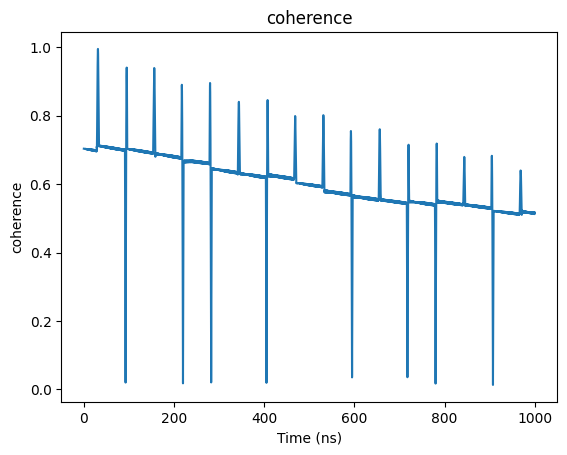

In [294]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

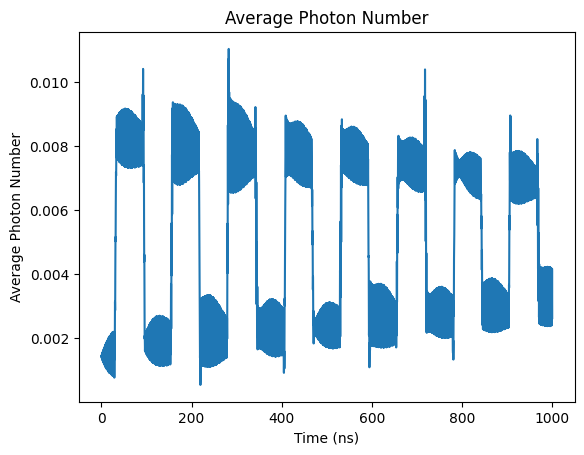

In [295]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

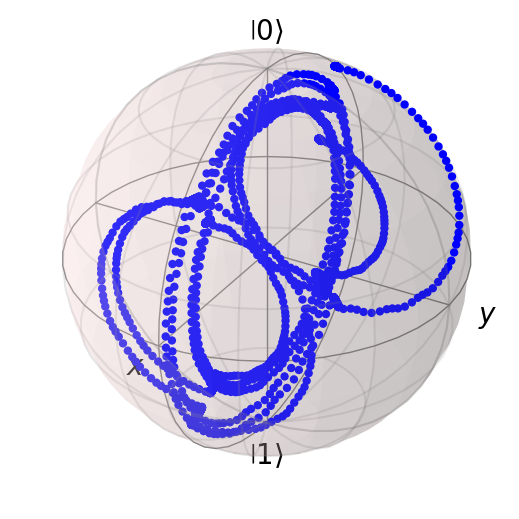

In [296]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [297]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## Print Coherence & Z

In [298]:
x_list

[-0.416373561285239,
 -0.5194068778203235,
 -0.5310260584178728,
 -0.5445574627938872,
 -0.5383545618284419,
 -0.5175821409955849,
 -0.5486169852430244,
 -0.5148014051309118]

In [299]:
y_list

[-0.2995295005678977,
 -0.016614735060866467,
 -0.016568315651824084,
 -0.0008522613508229551,
 -0.056521090429498086,
 0.002347461660000366,
 -0.10696413964400768,
 0.001939223872404909]

In [300]:
z_list

[0.8423663559560636,
 0.3953304902338839,
 0.3945106683980014,
 0.36885506274300495,
 0.3906192656165051,
 0.3938103097713642,
 0.38573163969541147,
 0.394707701048331]

# Dynamical Decoupling Simulation

$ \omega_{qd} = \omega_q^b + \chi $

Evolution time 1000ns

Initial state $ \cos(\frac{1\pi}{8}) |0\rangle + e^{j\frac{3\pi}{2}} \sin(\frac{1\pi}{8}) |1\rangle $

In [301]:
N = 5

omega_r = 2 * np.pi * 7.0     # resonator frequency in units of GHz
omega_q = 2 * np.pi * 6.0     # qubit frequency in units of GHz

g = 2 * np.pi * 0.1           # qubit-resonator coupling in units of GHz
kappa = 2 * np.pi * 0.01      # resonator linewidth in units of GHz

detune = omega_q-omega_r
chi = g*g/(detune)

omega_rd = omega_r            # qubit frequency in units of GHz
omega_qd = omega_q + chi      # qubit frequency in units of GHz

sx = sigmax()
sy = sigmay()
sz = sigmaz()
sp = basis(2,1)*basis(2,0).dag()
sm = basis(2,0)*basis(2,1).dag()
a = destroy(N)

sx_composite = tensor(sx, qeye(N))
sy_composite = tensor(sy, qeye(N))
sz_composite = tensor(sz, qeye(N))
sp_composite = tensor(sp, qeye(N))
number_composite = tensor(qeye(2), a.dag()*a)

op_list = [sx_composite, sy_composite, sz_composite, sp_composite, number_composite]

tlist = np.linspace(0, 1000, 10000)
T_end_q = 1000

cos = np.sqrt(0.5 + 0.5*5/np.sqrt(26))
sin = np.sqrt(0.5 - 0.5*5/np.sqrt(26))


psi_20 = tensor(basis(2,0), basis(N,0))
psi_21 = cos*tensor(basis(2,1), basis(N,0)) - sin*tensor(basis(2,0), basis(N,1))
psi_2s = np.cos(1*np.pi/8) * psi_20 + np.exp(1j*np.pi*3/2) * np.sin(1*np.pi/8) * psi_21


H0 = -0.5*omega_q*sz_composite + omega_r*number_composite + g*(tensor(sm, a.dag()) + tensor(sp, a))
H1 = tensor(qeye(2), a + a.dag())
H2 = sx_composite

A = 0.0002 * 2 * np.pi
B = 0.1 * 2 * np.pi

x_list = []
y_list = []
z_list = []

## Ramsey

In [302]:
# Simulation

N_seq = 0

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))
print([x_rot[0], y_rot[0], result.expect[2][0]])

0.0011454866037015326
[-1.2926125964849835e-16, 0.7036655234717203, 0.7099506753885818]


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

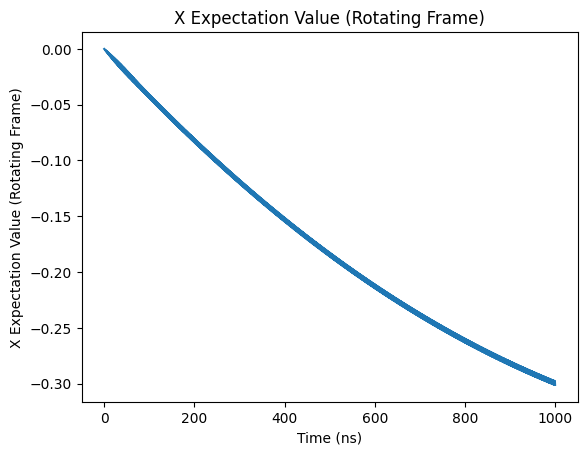

In [303]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

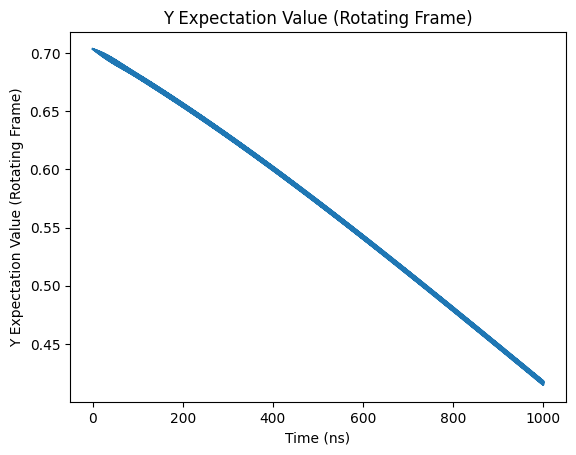

In [304]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

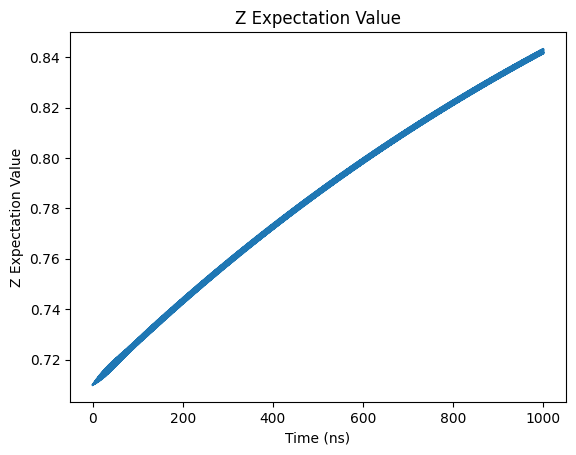

In [305]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

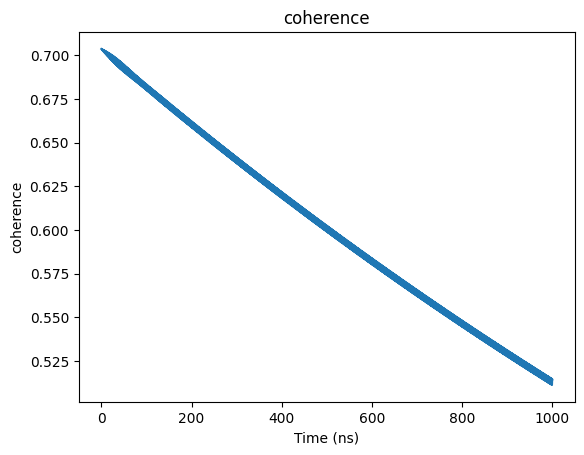

In [306]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

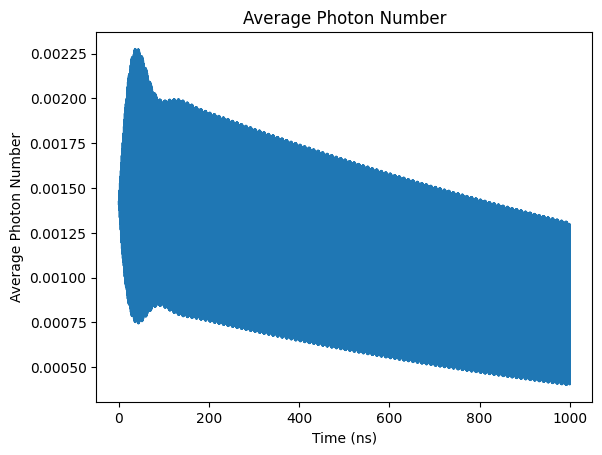

In [307]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

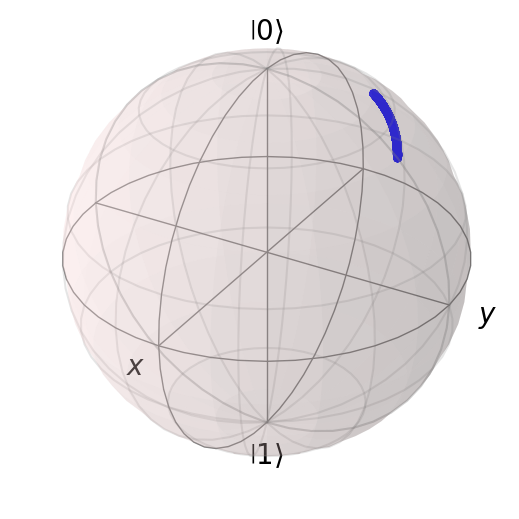

In [308]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [309]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=2)

In [310]:
# Simulation

N_seq = 2

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004880660767238507


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

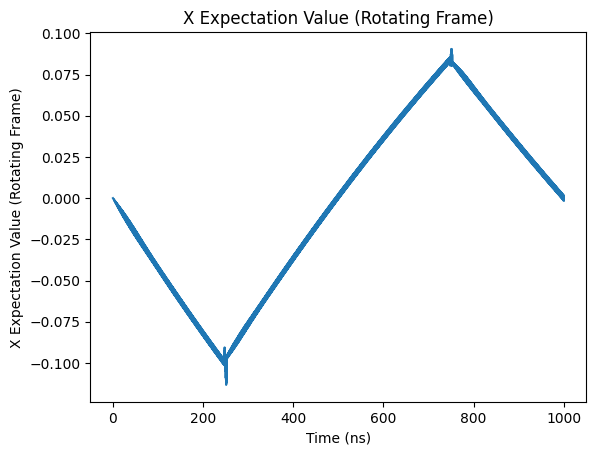

In [311]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

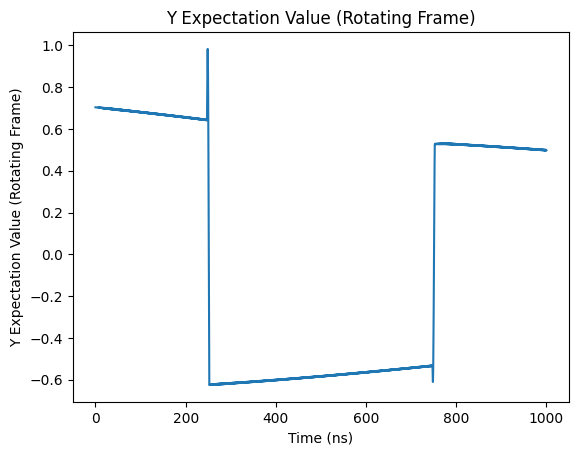

In [312]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

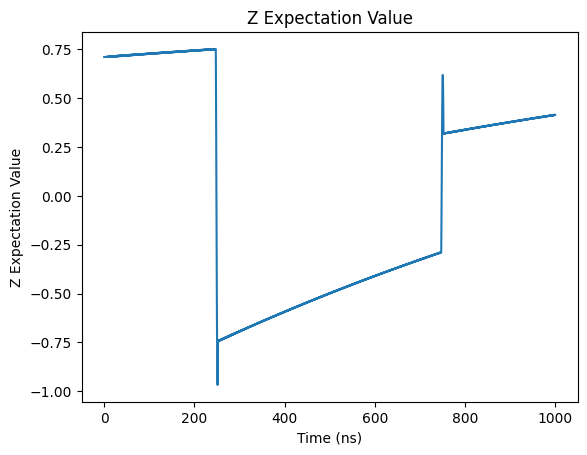

In [313]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

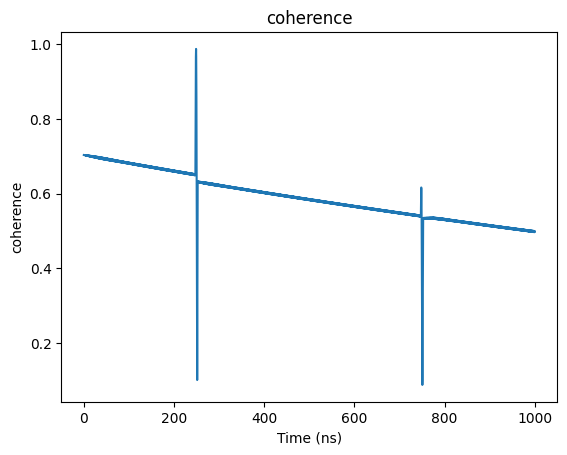

In [314]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

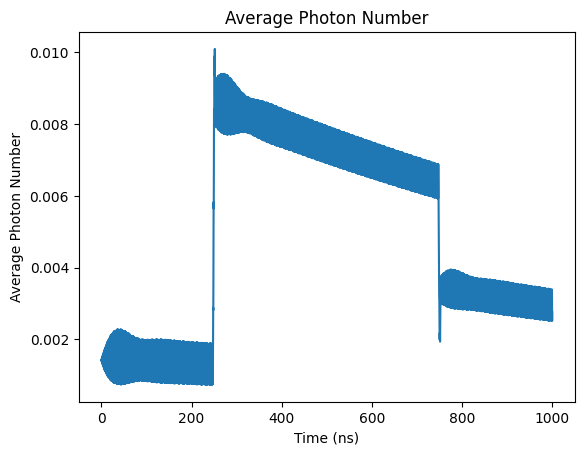

In [315]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

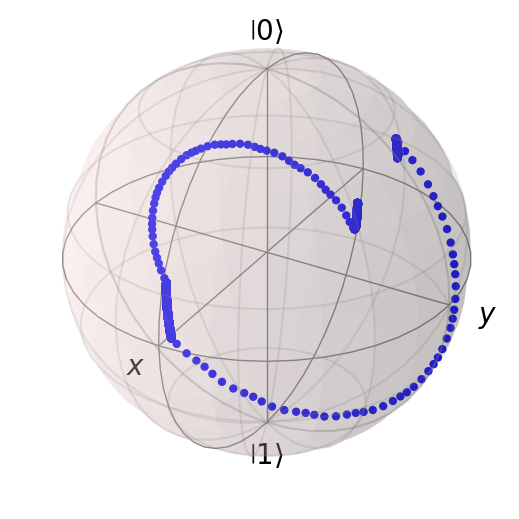

In [316]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [317]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=4)

In [318]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004952281627374481


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

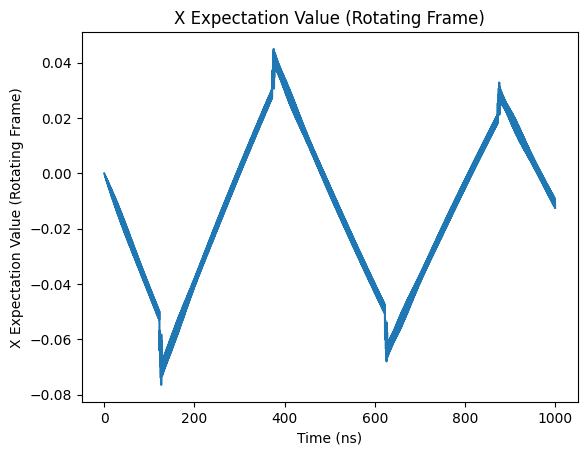

In [319]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

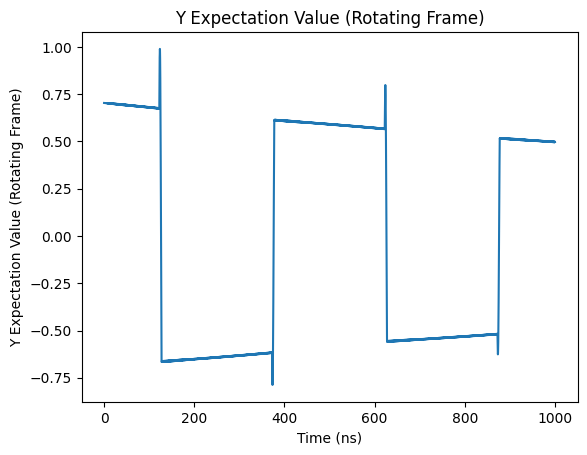

In [320]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

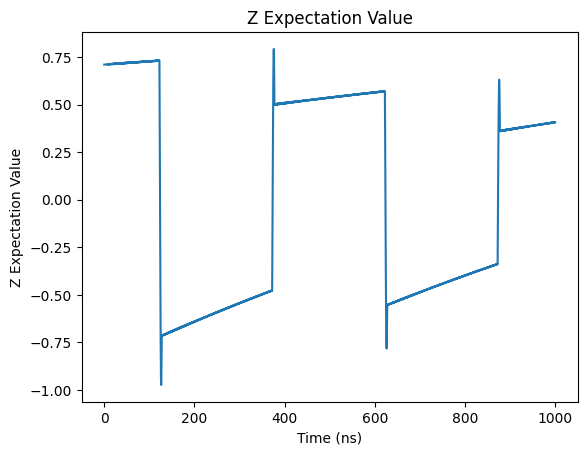

In [321]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

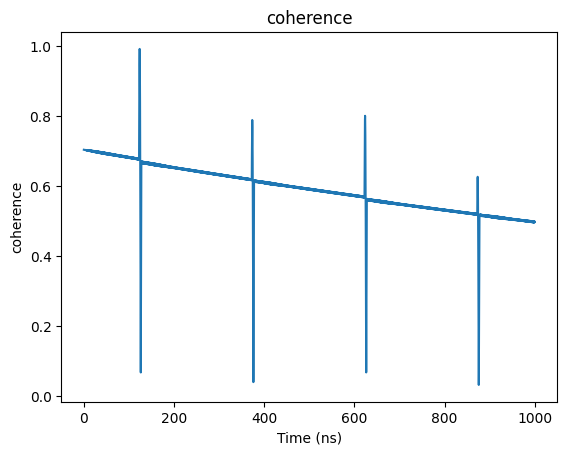

In [322]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

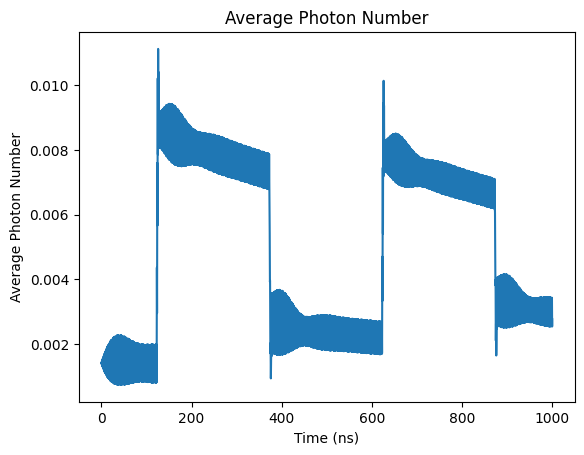

In [323]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

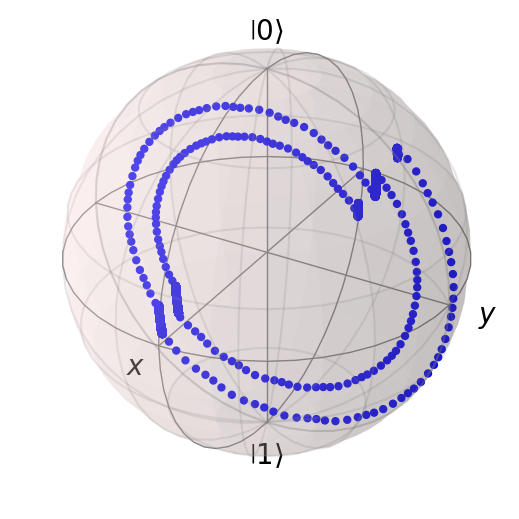

In [324]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [325]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY4

In [326]:
# Simulation

N_seq = 4

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY4_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004962005314949941


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

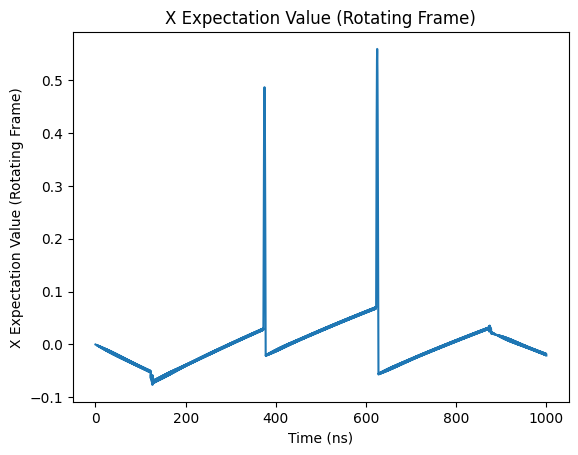

In [327]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

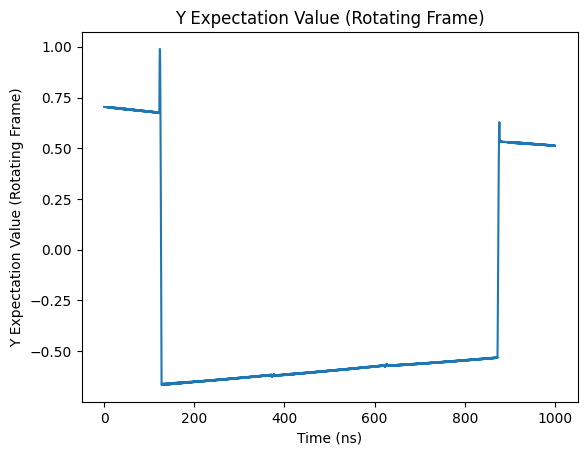

In [328]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

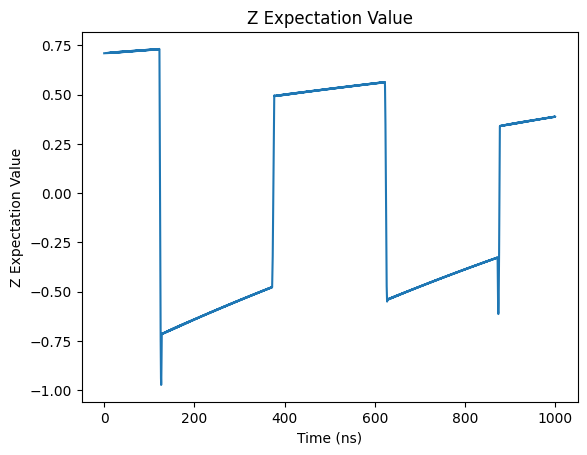

In [329]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

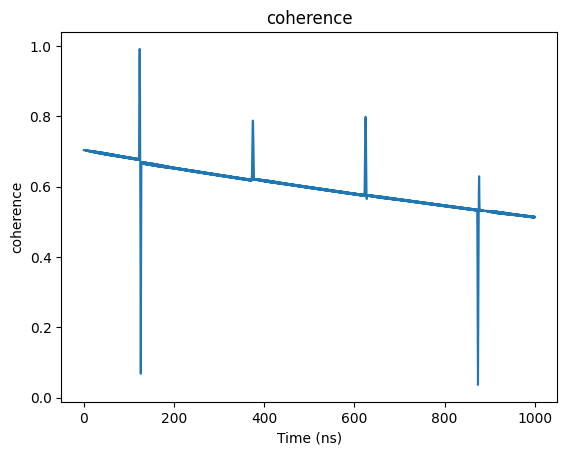

In [330]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

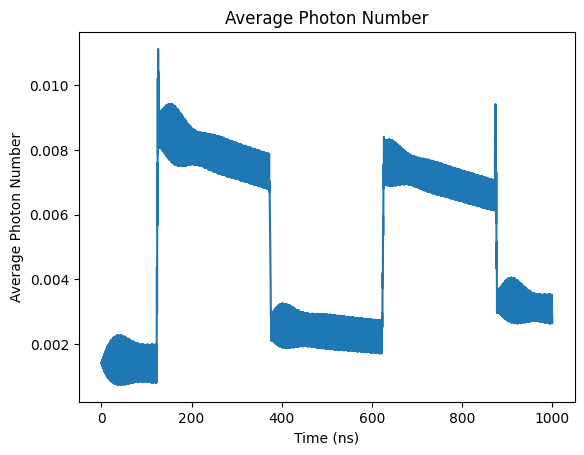

In [331]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

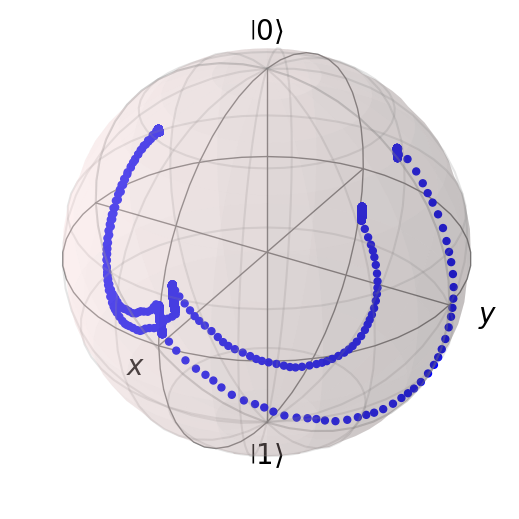

In [332]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [333]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=8)

In [334]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004985148610054654


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

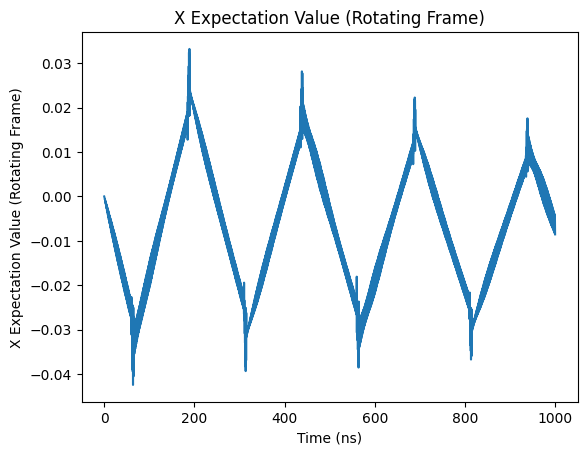

In [335]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

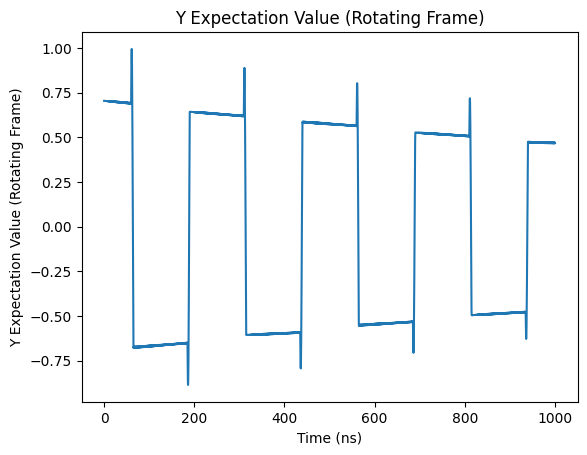

In [336]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

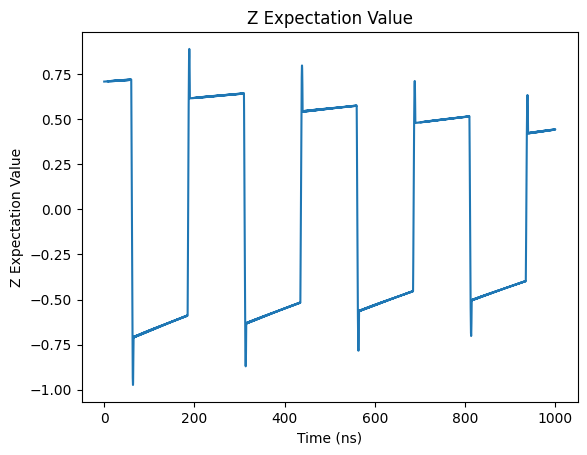

In [337]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

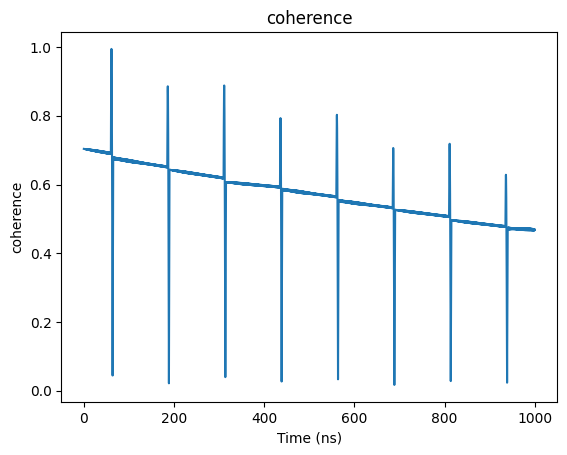

In [338]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

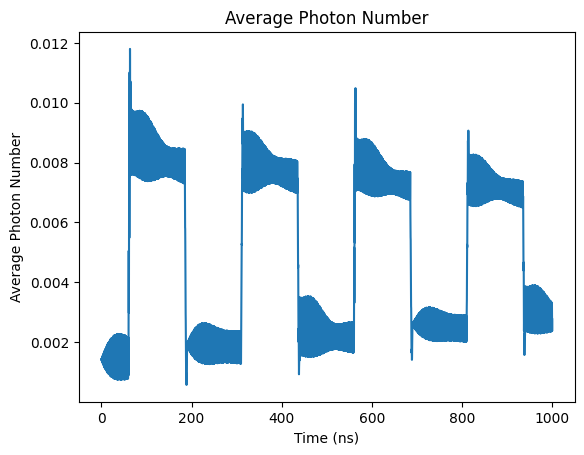

In [339]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

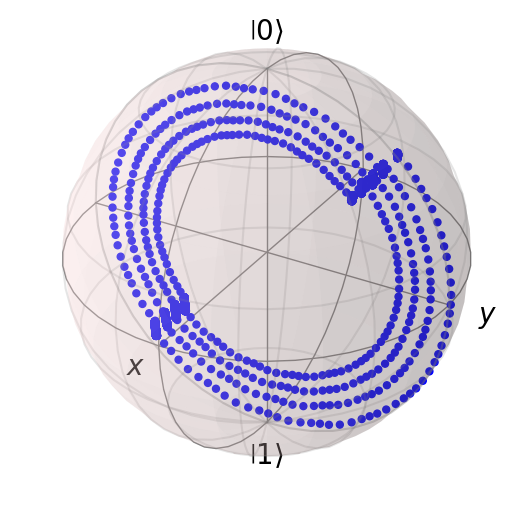

In [340]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [341]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY8

In [342]:
# Simulation

N_seq = 8

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY8_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.004982112923086671


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

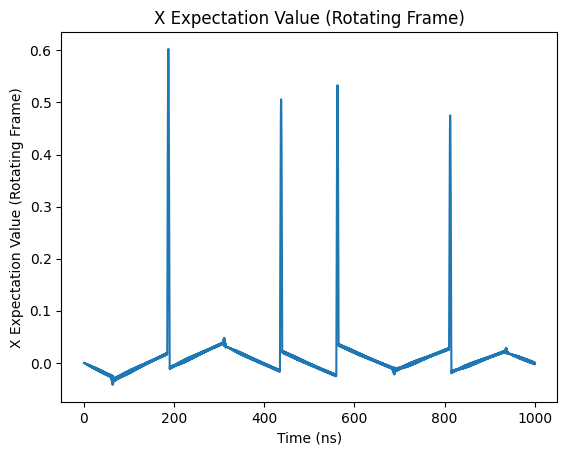

In [343]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

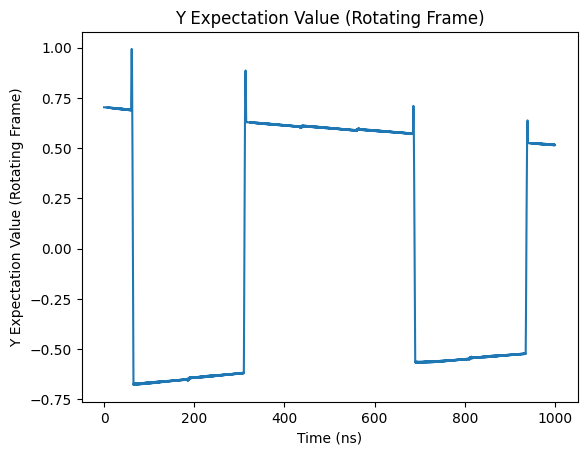

In [344]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

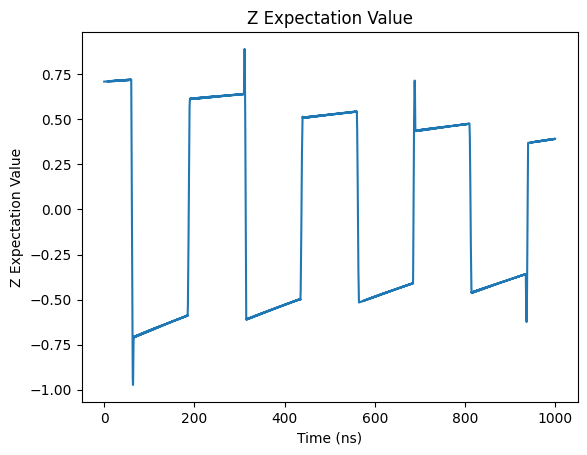

In [345]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

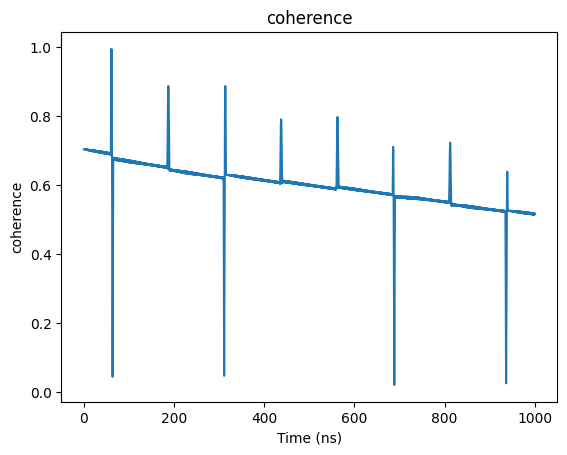

In [346]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

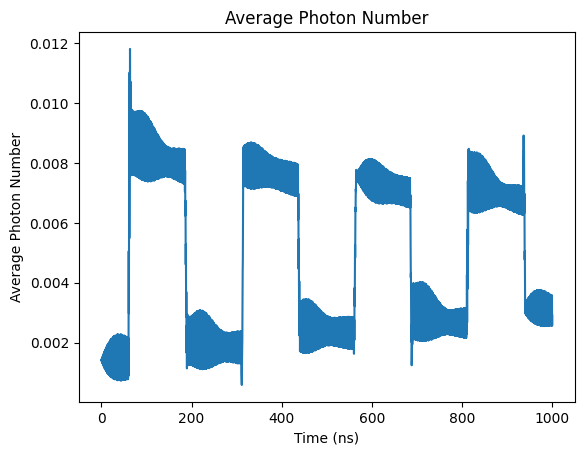

In [347]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

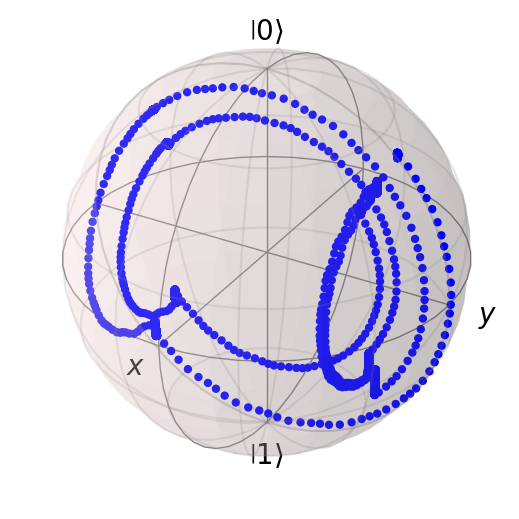

In [348]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [349]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## CP (N=16)

In [350]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, CP_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.0050522728707580785


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

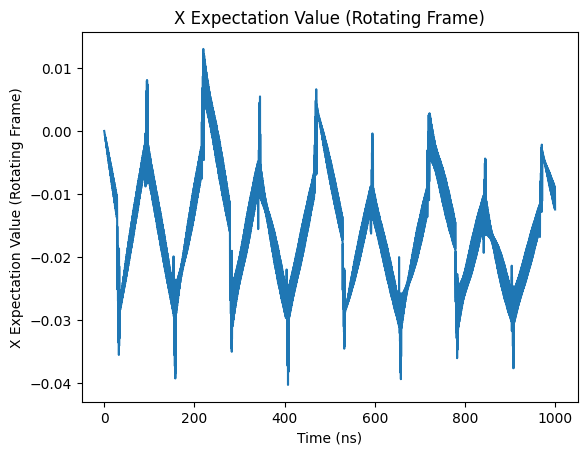

In [351]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

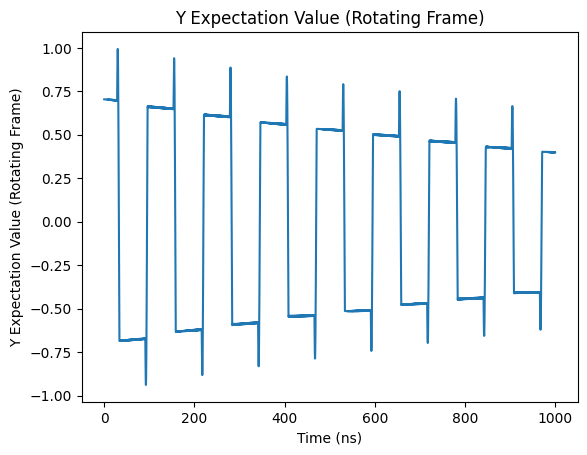

In [352]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

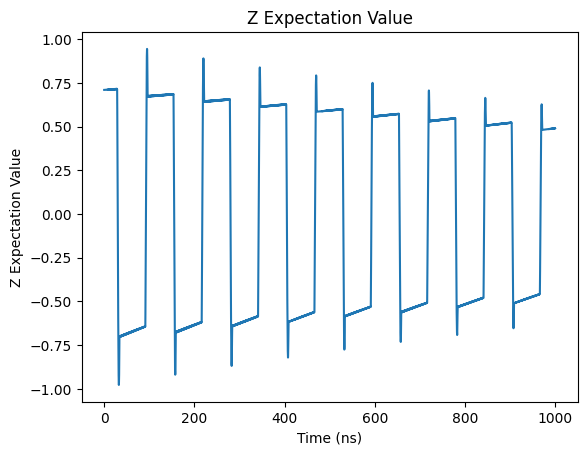

In [353]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

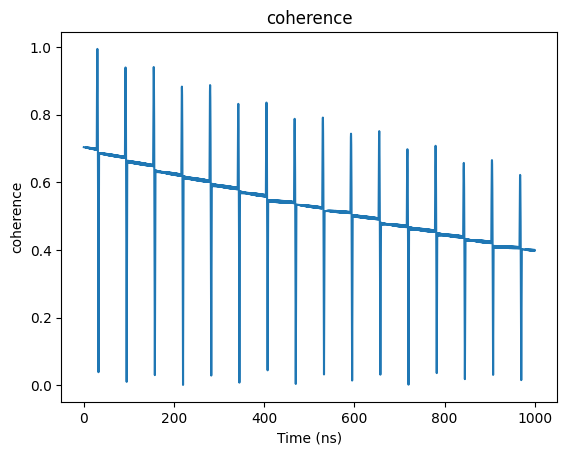

In [354]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

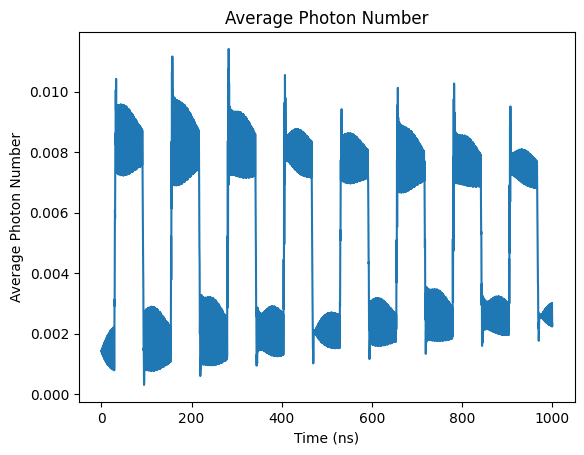

In [355]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

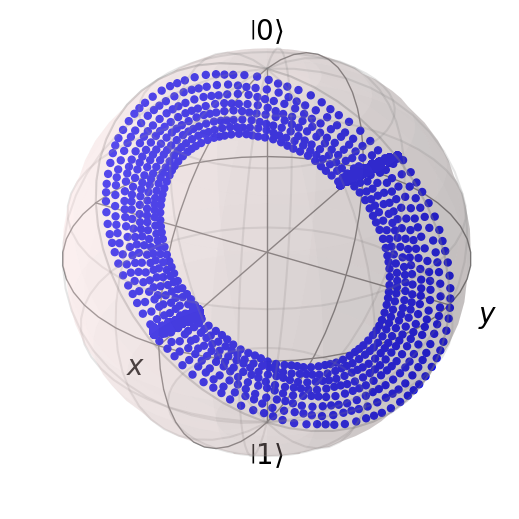

In [356]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [357]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## XY16

In [358]:
# Simulation

N_seq = 16

result = mesolve(
    [H0, [H1, Hrd_lab_frame], [H2, XY16_lab_frame]],
    psi_2s,
    tlist,
    c_ops = [np.sqrt(kappa) * tensor(qeye(2), a)],
    args = {'A': A, 'T_srt_r': 0, 'T_end_r': 50000, 'Omega_rd': omega_rd, 'B': B, 'T_srt_q': 0, 'T_end_q': T_end_q, 'N_seq': N_seq, 'Omega_qd': omega_qd},
    e_ops = op_list,
)

x_rot = + np.cos(omega_qd*tlist) * result.expect[0] - np.sin(omega_qd*tlist) * result.expect[1]
y_rot = - np.sin(omega_qd*tlist) * result.expect[0] - np.cos(omega_qd*tlist) * result.expect[1]

print(np.mean(result.expect[4]))

0.0050411298119559175


Text(0, 0.5, 'X Expectation Value (Rotating Frame)')

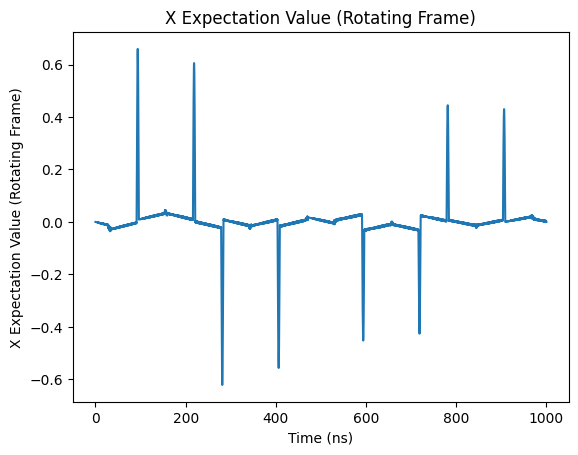

In [359]:
# Plot Results

plt.plot(tlist, x_rot)

plt.title('X Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('X Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Y Expectation Value (Rotating Frame)')

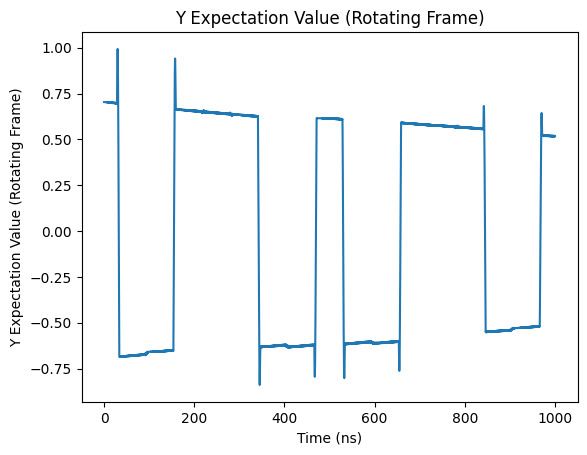

In [360]:
# Plot Results

plt.plot(tlist, y_rot)

plt.title('Y Expectation Value (Rotating Frame)')
plt.xlabel('Time (ns)')
plt.ylabel('Y Expectation Value (Rotating Frame)')

Text(0, 0.5, 'Z Expectation Value')

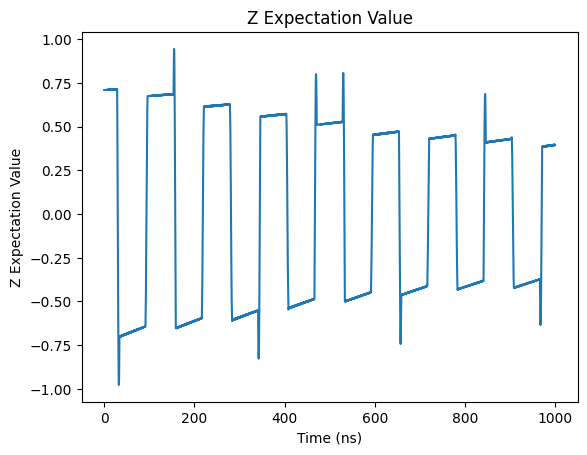

In [361]:
# Plot Results

plt.plot(tlist, result.expect[2])

plt.title('Z Expectation Value')
plt.xlabel('Time (ns)')
plt.ylabel('Z Expectation Value')

Text(0, 0.5, 'coherence')

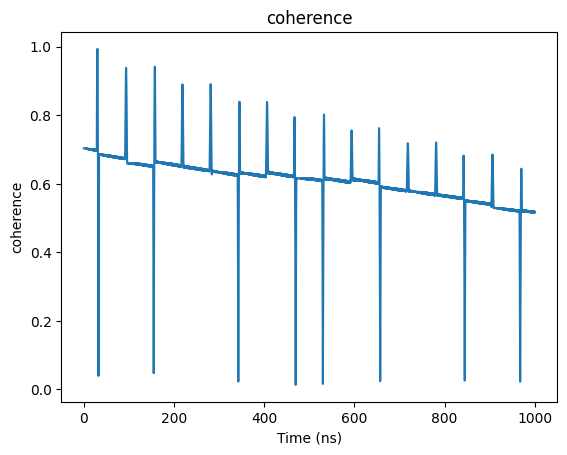

In [362]:
# Plot Results

plt.plot(tlist, 2*np.abs(result.expect[3]), label = 'average photon number 0.0005')

plt.title('coherence')
plt.xlabel('Time (ns)')
plt.ylabel('coherence')

Text(0, 0.5, 'Average Photon Number')

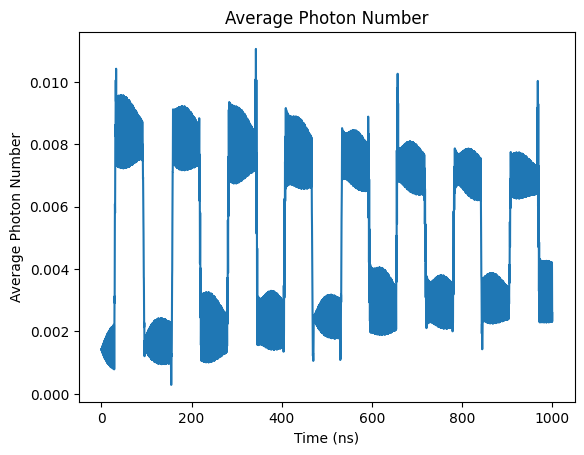

In [363]:
# Plot Results

plt.plot(tlist, result.expect[4])

plt.title('Average Photon Number')
plt.xlabel('Time (ns)')
plt.ylabel('Average Photon Number')

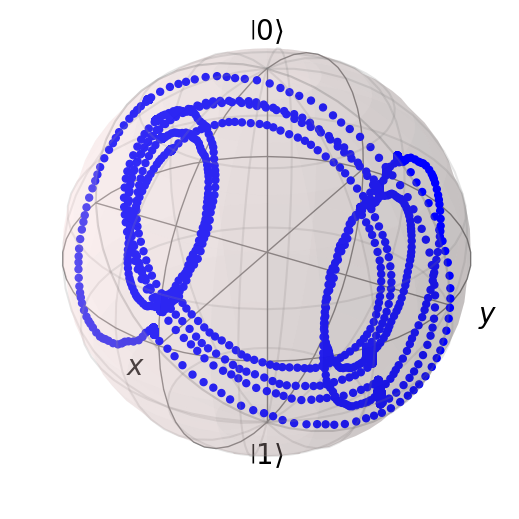

In [364]:
sphere = Bloch()
sphere.zlabel = [r'$\left|0\right>$', r'$\left|1\right>$']
sphere.add_points(np.array([x_rot, y_rot, result.expect[2]]), meth="s")
sphere.show()

In [365]:
avg = 0
for i in range(10):
  avg = avg + x_rot[-1-i]
avg = avg/10

x_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + y_rot[-1-i]
avg = avg/10

y_list.append(avg)


avg = 0
for i in range(10):
  avg = avg + result.expect[2][-1-i]
avg = avg/10

z_list.append(avg)

## Print Coherence & Z

In [366]:
x_list

[-0.29955920115658097,
 0.00016199827290384043,
 -0.010783399752229585,
 -0.01908200598606673,
 -0.006369782706599379,
 -0.0008194105821257228,
 -0.01072972914426018,
 0.0019883502642186034]

In [367]:
y_list

[0.4163881952057123,
 0.4983545069749858,
 0.4973021711119843,
 0.512662236101946,
 0.46806722795644146,
 0.5160339506178284,
 0.39849511147351446,
 0.5170576337093842]

In [368]:
z_list

[0.842359392479436,
 0.4140385051644039,
 0.40691394101506145,
 0.3879395179861925,
 0.44377292977044897,
 0.39200066913986165,
 0.49008534009736515,
 0.3961173548454157]